## Importing All Necessary Libraries

In [287]:
%matplotlib inline
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)
%config InlineBackend.figure_format = 'retina'

## 1. Data/Domain Understanding  and Exploration

#### 1.1 Meaning and Type of Features and Analysis of Distributions

In [290]:
df = pd.read_csv("C:/Users/Salman/Desktop/ML/adverts.csv")

In [291]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [292]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [293]:
df.describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


In [294]:
# Define the data for the table
data = {
    "Feature": df.columns,
    "Description": [
        "Unique identifier for each vehicle.",
        "Distance traveled by the vehicle.",
        "Regional registration code for the vehicle.",
        "Color of the vehicle.",
        "Manufacturer or brand of the vehicle.",
        "Specific model of the vehicle.",
        "Condition of the vehicle, e.g., NEW or USED.",
        "Year when the vehicle was first registered.",
        "Selling price of the vehicle (target variable).",
        "Type of vehicle body, e.g., SUV, Saloon.",
        "Whether the vehicle is a crossover between a car and a van.",
        "Type of fuel used by the vehicle."
    ],
    "Type": [
        "Categorical", "Numerical", "Categorical", "Categorical", "Categorical",
        "Categorical", "Categorical", "Numerical", "Numerical",
        "Categorical", "Binary", "Categorical"
    ],
    "Data Type (pandas)": [str(dtype) for dtype in df.dtypes]
}

df_features = pd.DataFrame(data)

print(df_features.to_markdown(index=False))



| Feature               | Description                                                 | Type        | Data Type (pandas)   |
|:----------------------|:------------------------------------------------------------|:------------|:---------------------|
| public_reference      | Unique identifier for each vehicle.                         | Categorical | int64                |
| mileage               | Distance traveled by the vehicle.                           | Numerical   | float64              |
| reg_code              | Regional registration code for the vehicle.                 | Categorical | object               |
| standard_colour       | Color of the vehicle.                                       | Categorical | object               |
| standard_make         | Manufacturer or brand of the vehicle.                       | Categorical | object               |
| standard_model        | Specific model of the vehicle.                              | Categorical | object               |


In [295]:
df['mileage'].value_counts()

mileage
0.0        16207
10.0       12873
5.0         2434
60000.0     1609
50000.0     1580
           ...  
53660.0        1
72993.0        1
74437.0        1
66881.0        1
53460.0        1
Name: count, Length: 80634, dtype: int64

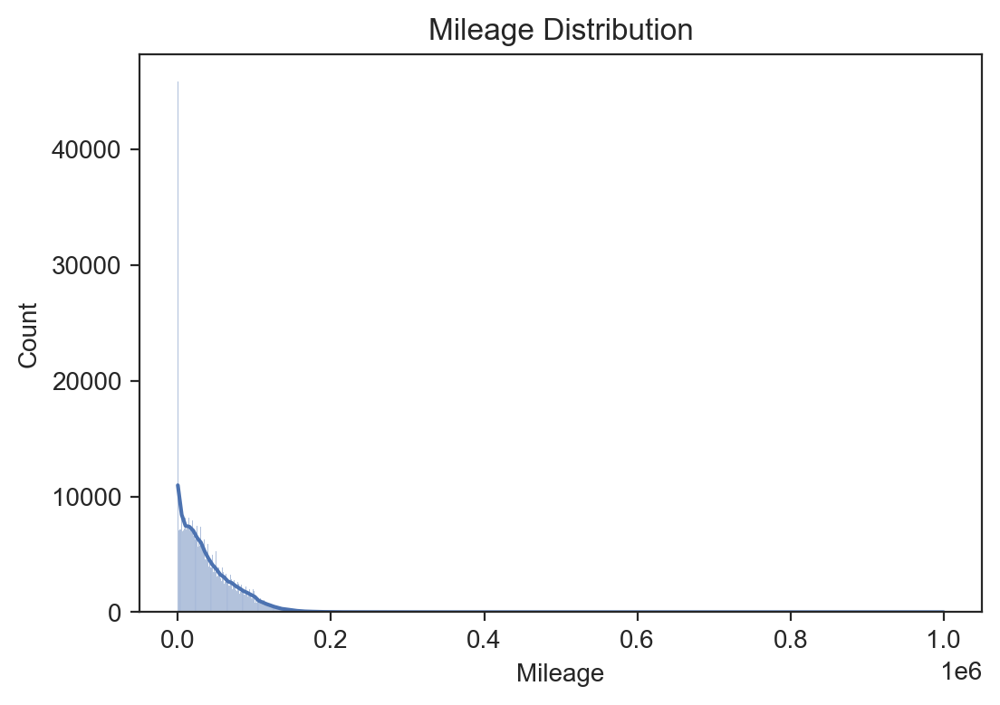

In [296]:
sns.histplot(df['mileage'],kde=True,)
plt.title('Mileage Distribution')
plt.xlabel('Mileage')
plt.ylabel('Count')
#plt.savefig("Figures/Mileage_Distribution.png")
plt.show()

In [297]:
df['price'].value_counts()

price
8995     2432
7995     2377
6995     2369
9995     2340
5995     2249
         ... 
16253       1
44150       1
50340       1
76989       1
58987       1
Name: count, Length: 30578, dtype: int64

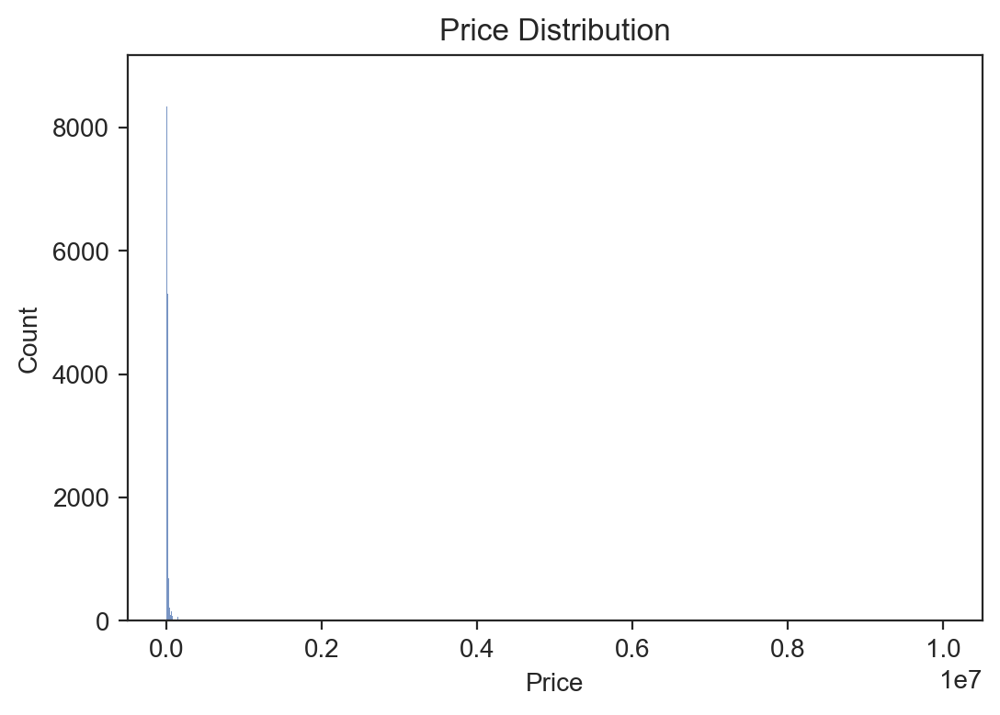

In [298]:
sns.histplot(df['price'])
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Count')
#plt.savefig('Figures/Price_Distribution.png')
plt.show()

In [299]:
df['year_of_registration'].value_counts()

year_of_registration
2017.0    68790
2016.0    43483
2019.0    39236
2018.0    38300
2015.0    29019
          ...  
1010.0        1
1934.0        1
1016.0        1
1063.0        1
1015.0        1
Name: count, Length: 84, dtype: int64

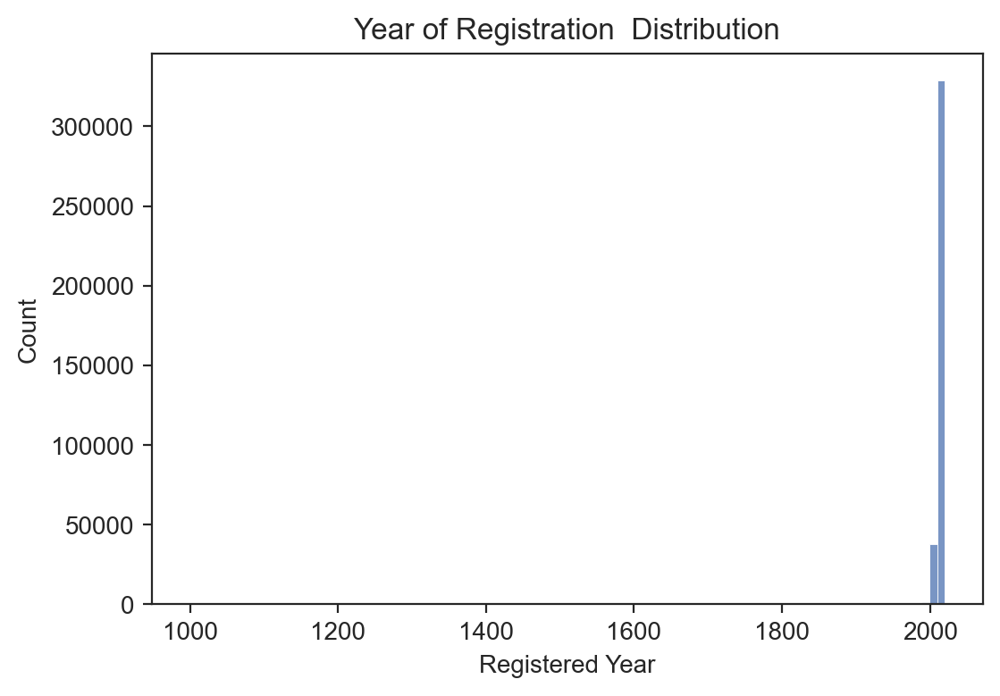

In [300]:
sns.histplot(df['year_of_registration'], bins = 100)
plt.title('Year of Registration  Distribution')
plt.xlabel('Registered Year')
plt.ylabel('Count')
# plt.savefig('Figures/Year_of_Registration_Distribution.png')
plt.show()

In [301]:
df['fuel_type'].value_counts()

fuel_type
Petrol                   216929
Diesel                   158120
Petrol Hybrid             13602
Petrol Plug-in Hybrid      6160
Electric                   4783
Diesel Hybrid              1403
Bi Fuel                     221
Diesel Plug-in Hybrid       185
Natural Gas                   1
Name: count, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

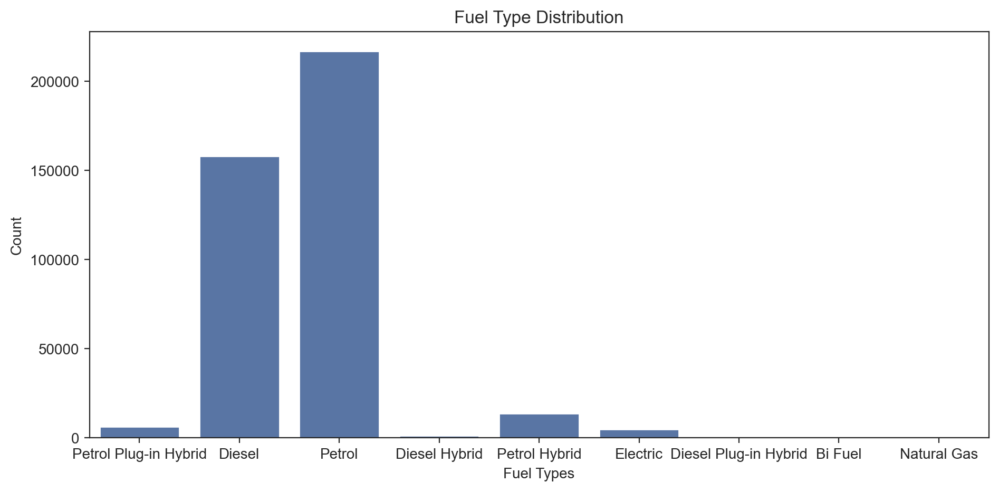

In [302]:
plt.figure(figsize=(11,5))
sns.countplot(x="fuel_type", data=df)
plt.title('Fuel Type Distribution')
plt.xlabel('Fuel Types')
plt.ylabel('Count')
#plt.savefig('Figures/Fuel_Type_Distribution.png')
plt.show

In [303]:
df["standard_colour"].value_counts()

standard_colour
Black          86287
White          70535
Grey           68227
Blue           59784
Silver         49323
Red            42024
Green           4534
Orange          4088
Yellow          2097
Brown           2014
Multicolour     1854
Beige           1539
Bronze          1330
Purple          1211
Gold             818
Pink             410
Turquoise        307
Maroon           159
Burgundy          63
Magenta           15
Navy               7
Indigo             1
Name: count, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

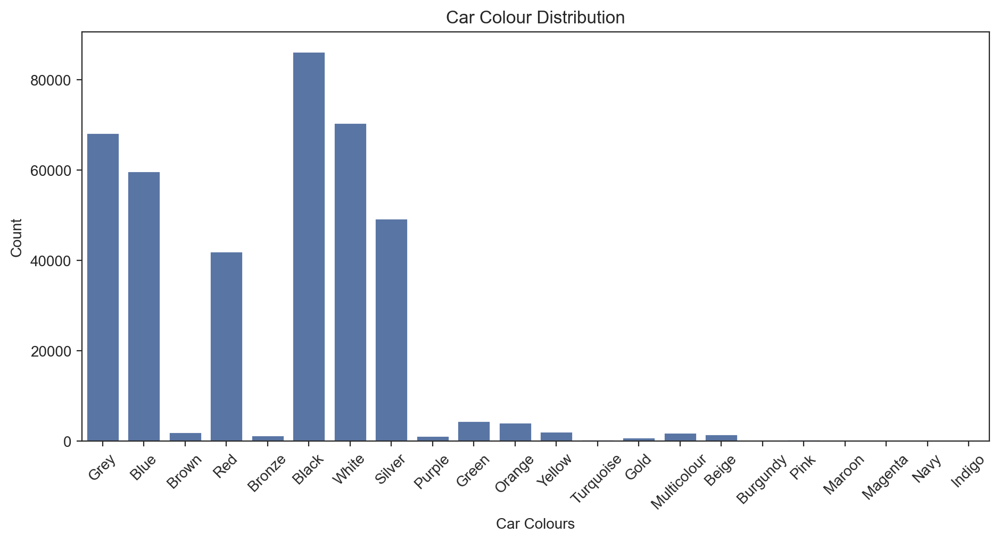

In [304]:
plt.figure(figsize=(11,5))
sns.countplot(x="standard_colour", data=df)
plt.title('Car Colour Distribution')
plt.xlabel('Car Colours')
plt.ylabel('Count')
plt.xticks(rotation=45)
#plt.savefig('Figures/Car_Colour_Distribution.png')
plt.show

In [305]:
df['body_type'].value_counts()

body_type
Hatchback          167315
SUV                115872
Saloon              36641
Estate              24692
Coupe               23258
Convertible         16038
MPV                 16026
Pickup                620
Combi Van             214
Limousine             159
Minibus               149
Camper                 77
Panel Van              61
Window Van             41
Chassis Cab             3
Car Derived Van         2
Name: count, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

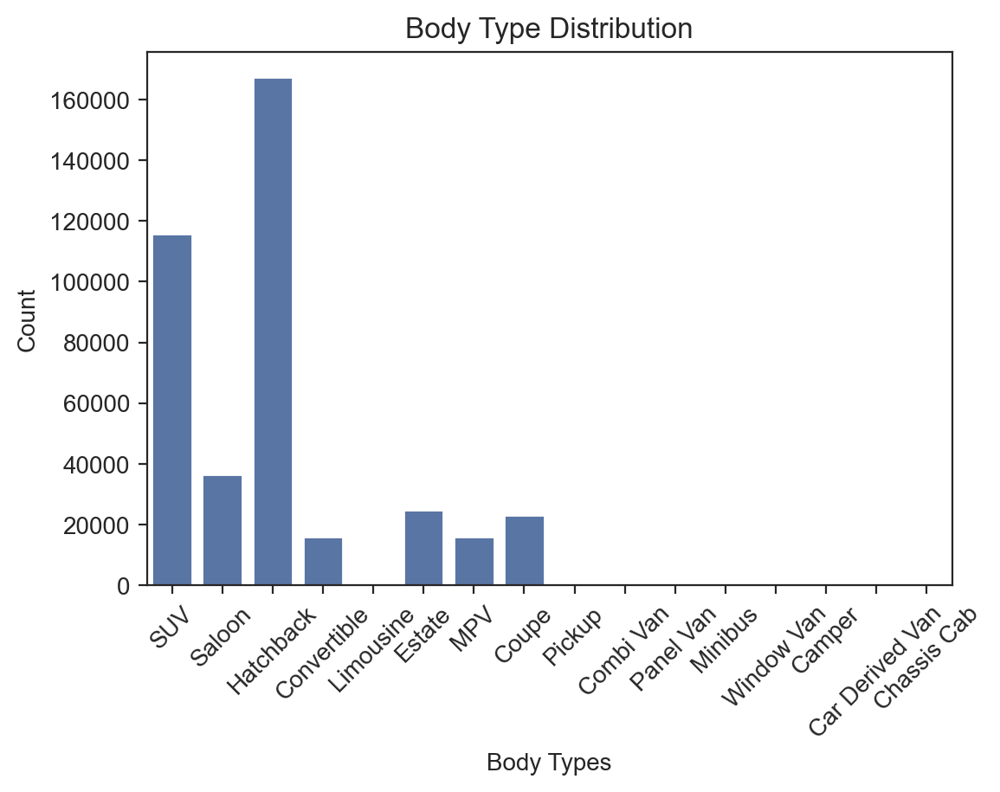

In [306]:
sns.countplot(x="body_type", data=df)
plt.title('Body Type Distribution')
plt.xlabel('Body Types')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Body_Type_Distribution.png')
plt.show

#### 1.2 Analysis of Predictive Power of Features

<function matplotlib.pyplot.show(close=None, block=None)>

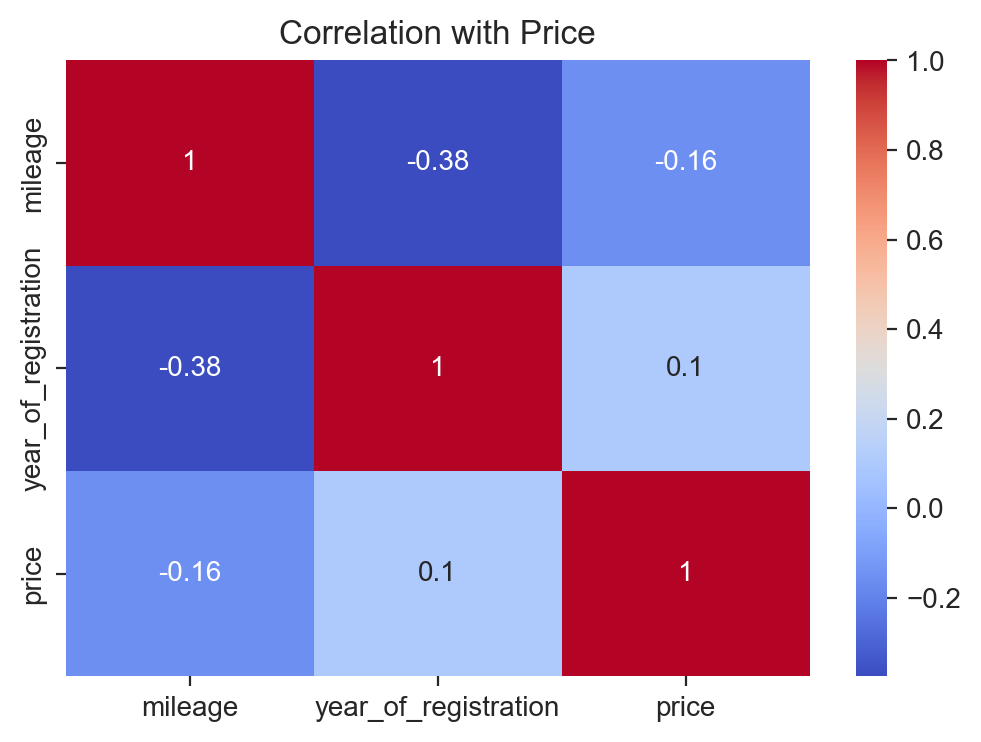

In [308]:
corr = df[['mileage', 'year_of_registration', 'price']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation with Price')
plt.show

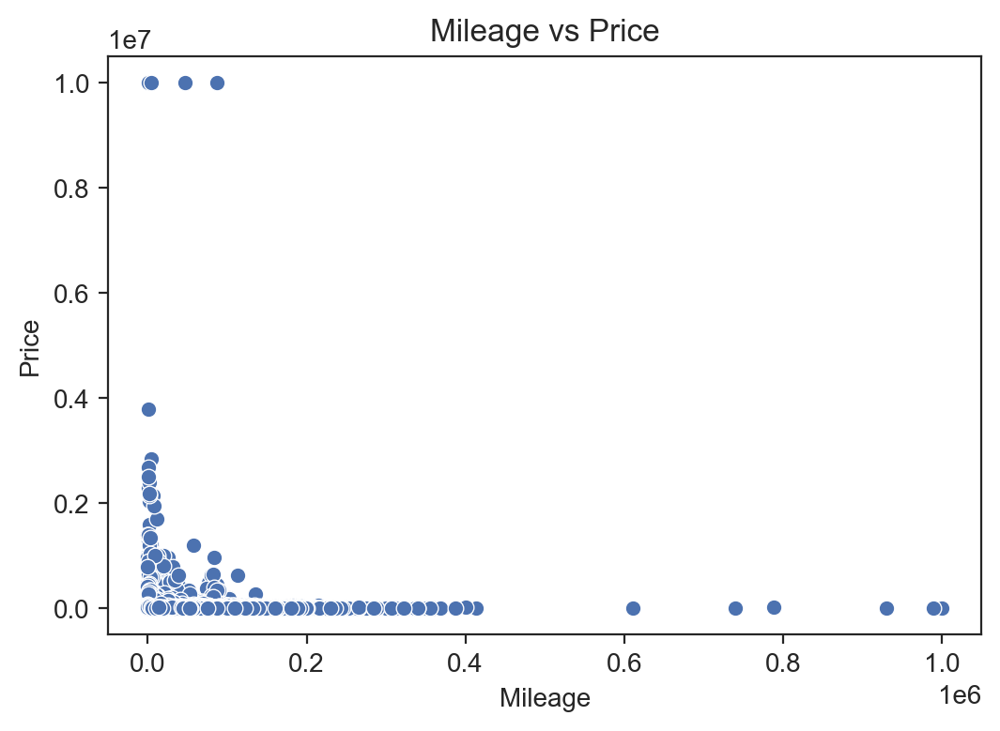

In [309]:
sns.scatterplot(x='mileage', y='price',data=df)
plt.title('Mileage vs Price')
plt.xlabel('Mileage')
plt.ylabel('Price')
#plt.savefig('Figures/Mileage_vs_Price.png')
plt.show()

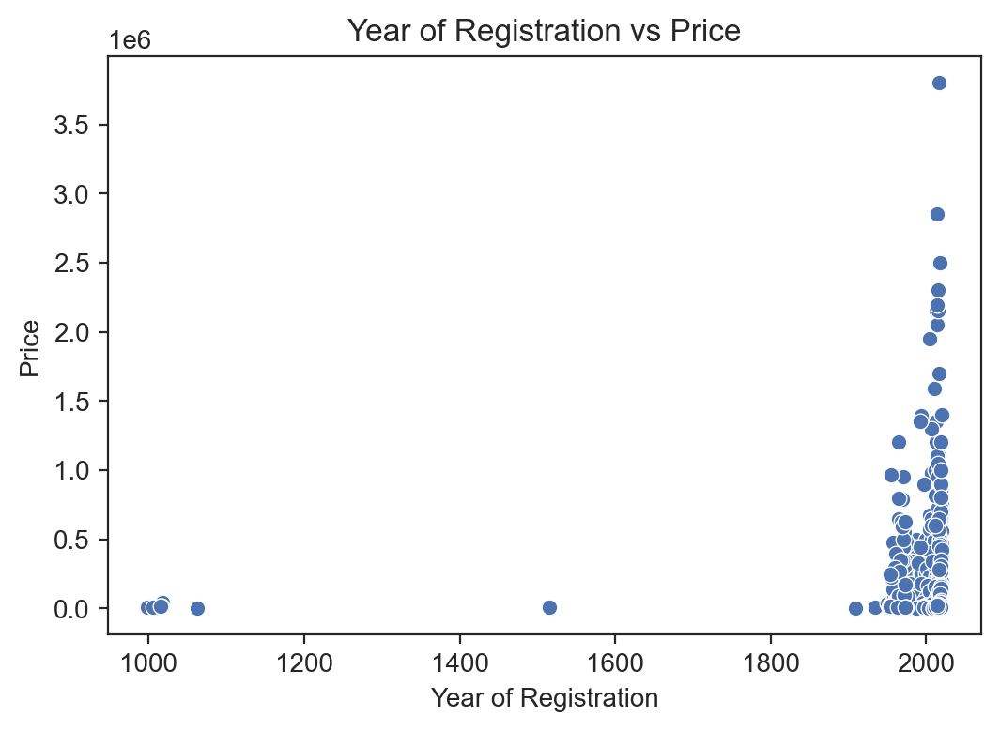

In [310]:
sns.scatterplot(data=df, x='year_of_registration', y='price')
plt.title('Year of Registration vs Price')
plt.xlabel('Year of Registration')
plt.ylabel('Price')
#plt.savefig('Figures/Year_of_registration_vs_Price.png')
plt.show()

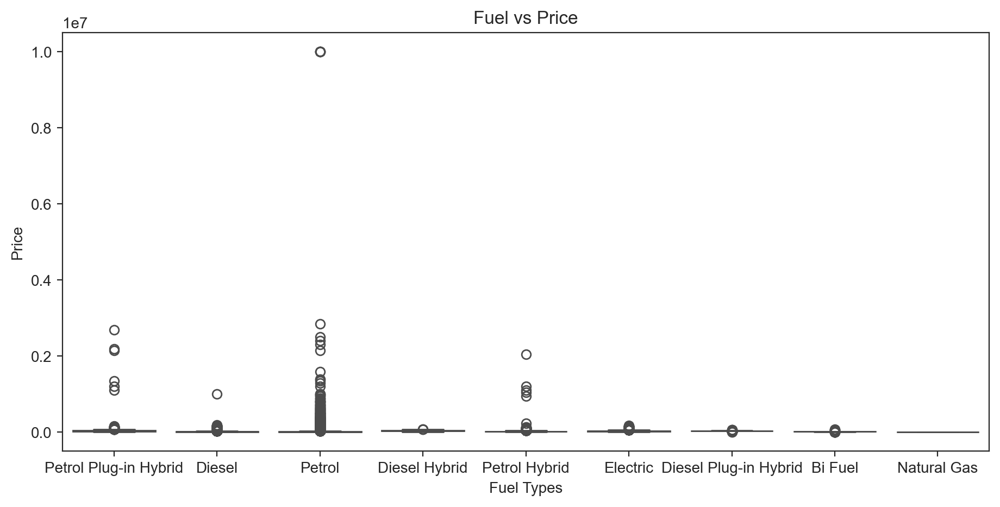

In [311]:
plt.figure(figsize=(11,5))
sns.boxplot(x='fuel_type', y='price',data=df)
plt.title('Fuel vs Price')
plt.xlabel('Fuel Types')
plt.ylabel('Price')
#plt.savefig('Figures/Fuel_Type_vs_Price')
plt.show()

#### 1.3 Data Processing for Data Exploration and visualisationn

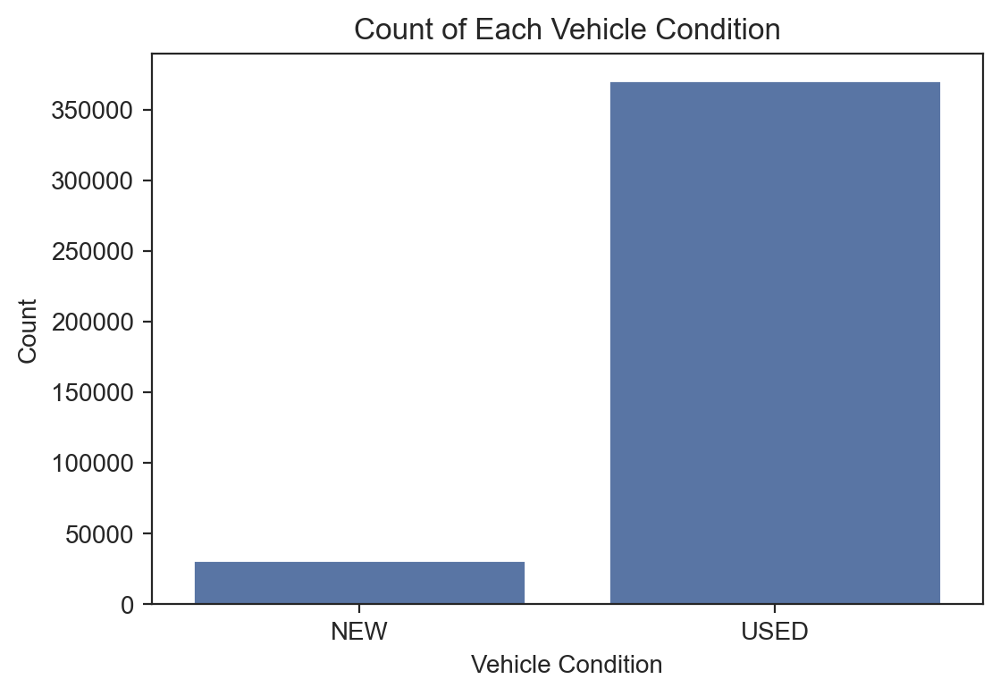

In [313]:
plt.figure(figsize=(6, 4))
sns.countplot(x='vehicle_condition', data=df)
plt.title('Count of Each Vehicle Condition')
plt.xlabel('Vehicle Condition')
plt.ylabel('Count')
#plt.savefig('Figures/Count_of_Vehicle_Condition.png')
plt.show()

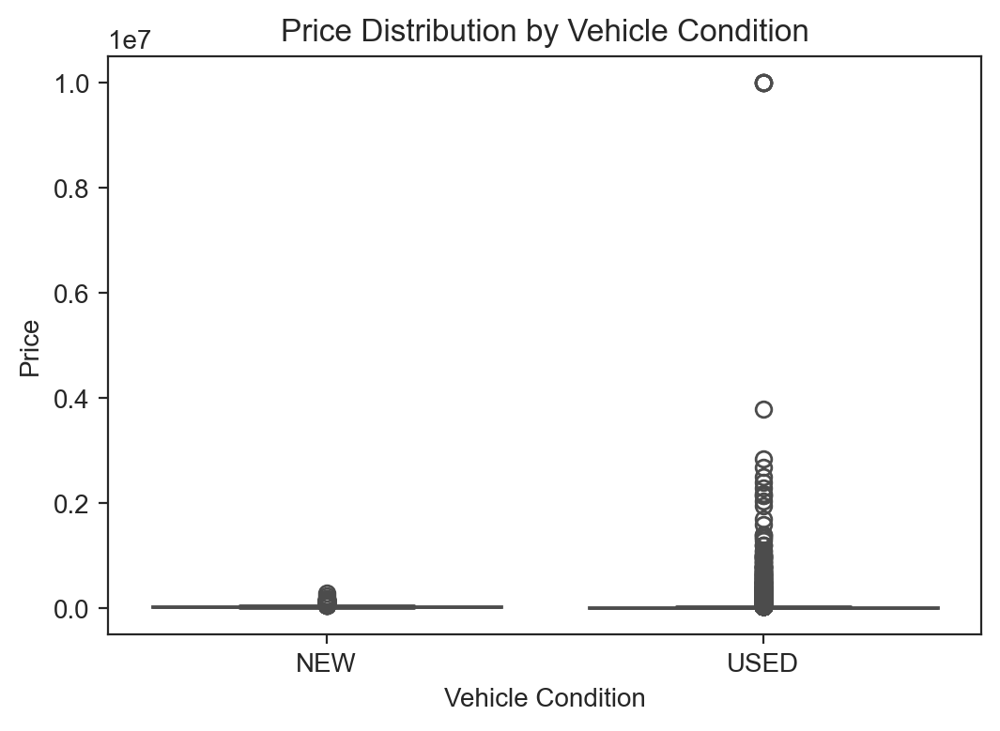

In [314]:
sns.boxplot(x='vehicle_condition', y='price', data=df)
plt.title('Price Distribution by Vehicle Condition')
plt.xlabel('Vehicle Condition')
plt.ylabel('Price')
#plt.savefig('Figures/Price_vs_Vehicle_Condition.png')
plt.show()

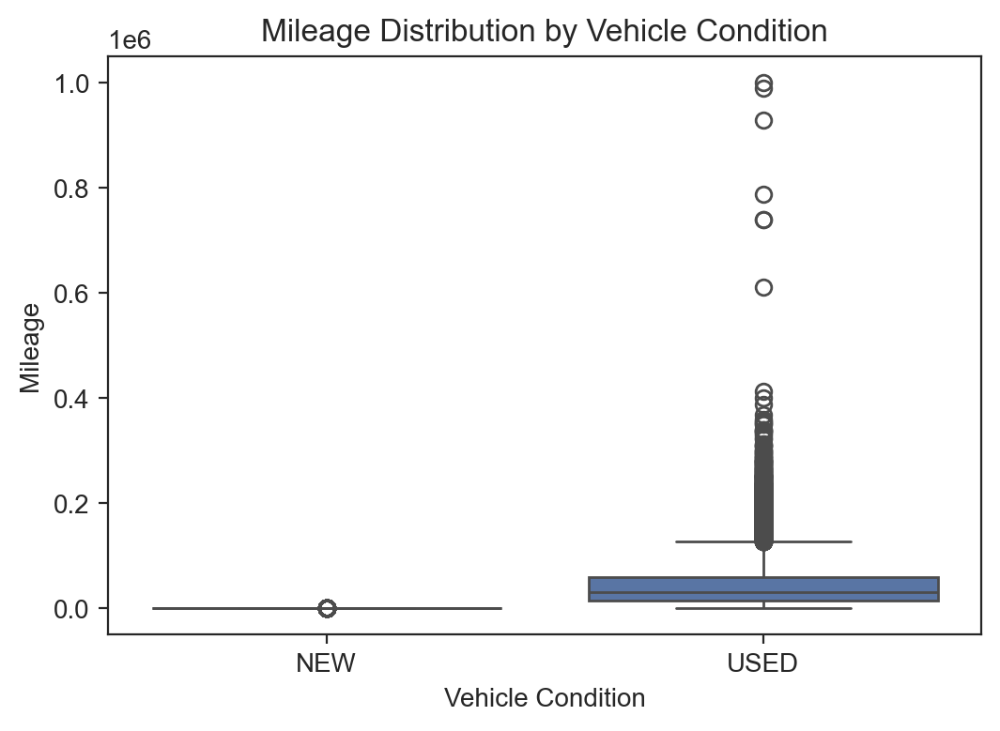

In [315]:
sns.boxplot(x='vehicle_condition', y='mileage', data=df)
plt.title('Mileage Distribution by Vehicle Condition')
plt.xlabel('Vehicle Condition')
plt.ylabel('Mileage')
#plt.savefig('Figures/Mileage_vs_Vehicle_Condition')
plt.show()

In [316]:
df['standard_make'].value_counts()

standard_make
BMW               37376
Audi              35280
Volkswagen        34246
Vauxhall          33700
Mercedes-Benz     31917
                  ...  
Bristol               1
Wolseley              1
Pagani                1
International         1
Custom Vehicle        1
Name: count, Length: 110, dtype: int64

In [317]:
top_10_makes = df['standard_make'].value_counts().head(10)
print(top_10_makes)

standard_make
BMW              37376
Audi             35280
Volkswagen       34246
Vauxhall         33700
Mercedes-Benz    31917
Nissan           19892
Toyota           17671
Peugeot          15161
Land Rover       14795
Renault          12821
Name: count, dtype: int64


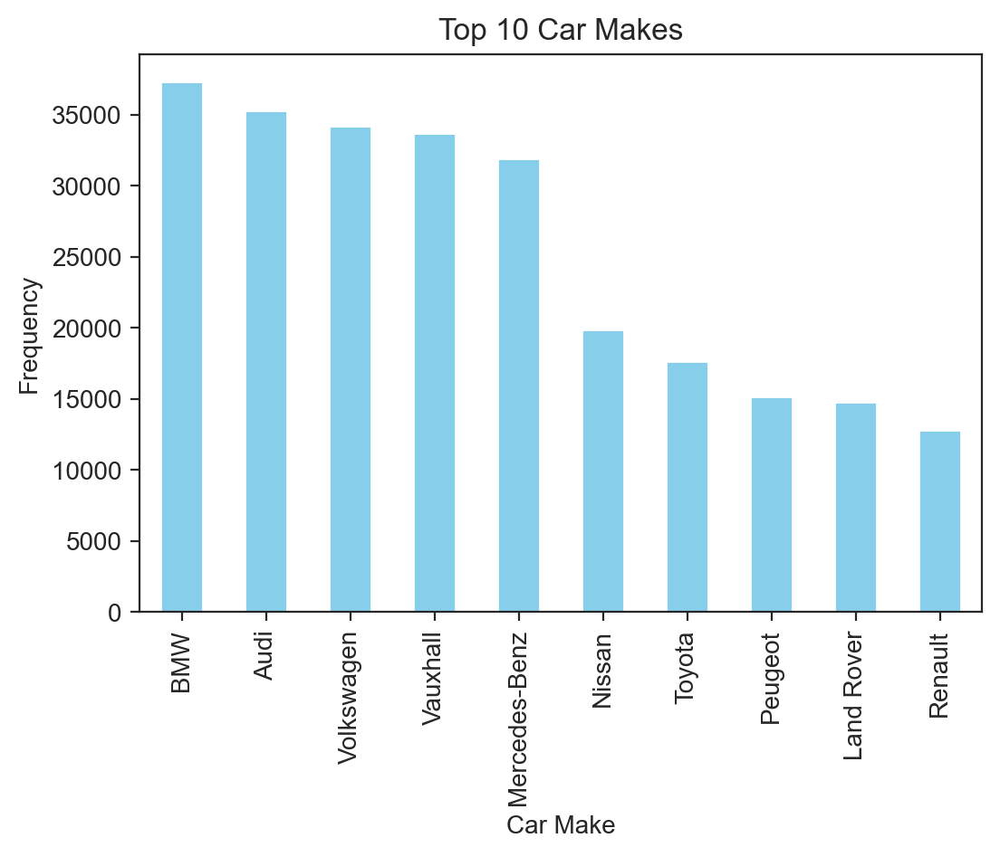

In [318]:
top_10_makes.plot(kind='bar', color='skyblue')
plt.title('Top 10 Car Makes')
plt.xlabel('Car Make')
plt.ylabel('Frequency')
# plt.savefig('Figures/Top_10_Make.png')
plt.show()

In [319]:
df['standard_model'].value_counts()

standard_model
Golf                11583
Corsa               10647
C Class              8550
3 Series             8347
Polo                 7681
                    ...  
Isetta                  1
Starlet Glanza V        1
RX 200t                 1
Scuderia Spider         1
480                     1
Name: count, Length: 1168, dtype: int64

In [320]:
top_7_model = df['standard_model'].value_counts().head(7)
print(top_7_model)

standard_model
Golf        11583
Corsa       10647
C Class      8550
3 Series     8347
Polo         7681
Qashqai      7507
1 Series     7455
Name: count, dtype: int64


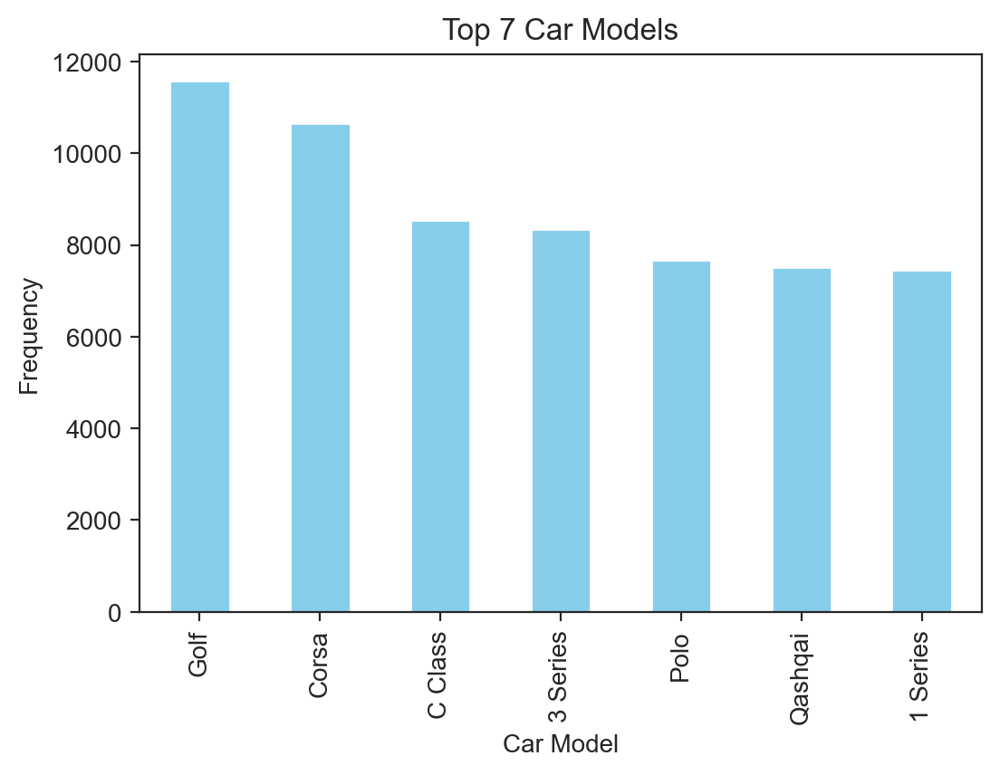

In [321]:
top_7_model.plot(kind='bar', color='skyblue')
plt.title('Top 7 Car Models')
plt.xlabel('Car Model')
plt.ylabel('Frequency')
# plt.savefig('Figures/Top_7_Models.png')
plt.show()

In [322]:
top_5_body_types = df['body_type'].value_counts().head(5)
print(top_5_body_types)

body_type
Hatchback    167315
SUV          115872
Saloon        36641
Estate        24692
Coupe         23258
Name: count, dtype: int64


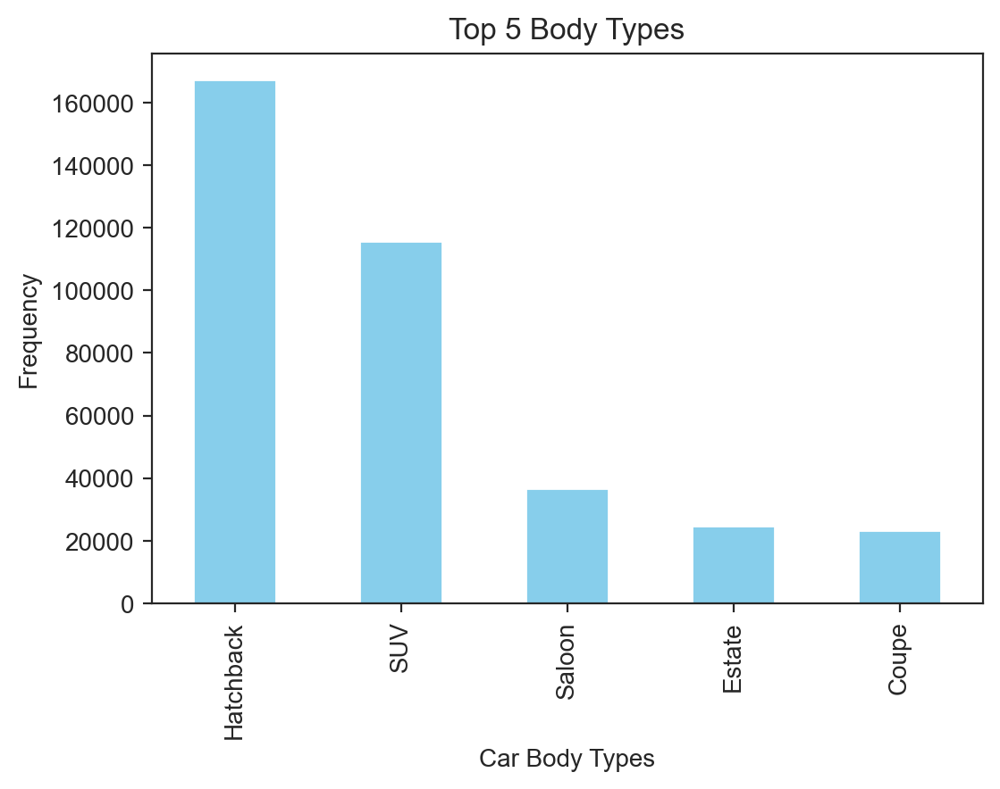

In [323]:
top_5_body_types.plot(kind='bar', color='skyblue')
plt.title('Top 5 Body Types')
plt.xlabel('Car Body Types')
plt.ylabel('Frequency')
# plt.savefig('Figures/Top_5_Body_Types.png')
plt.show()

## 2. Data Processing for Machine  Learning

### 2.1 Dealing with Missing Values, Outliers, and Noise

In [326]:
df.describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


In [327]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

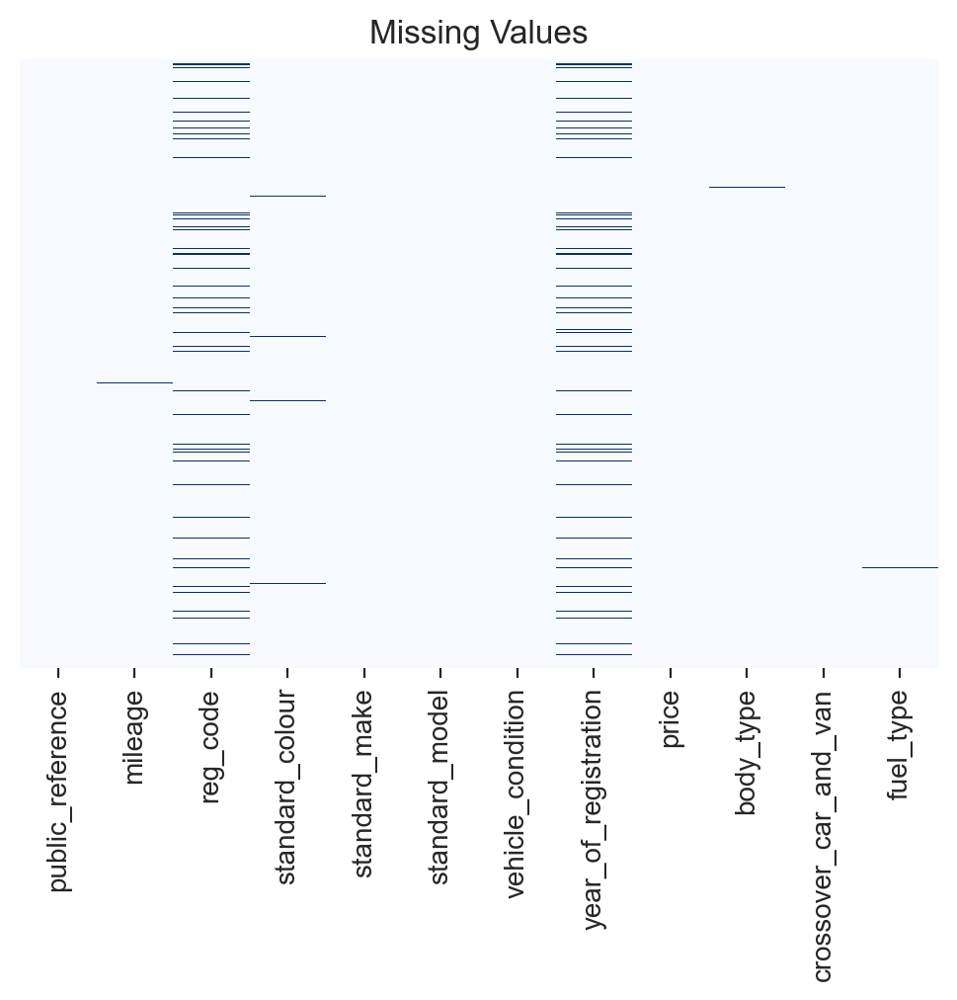

In [328]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False,cmap="Blues")
plt.title("Missing Values")
#plt.savefig('Missing_Values_in_Dataset.png')
plt.show()

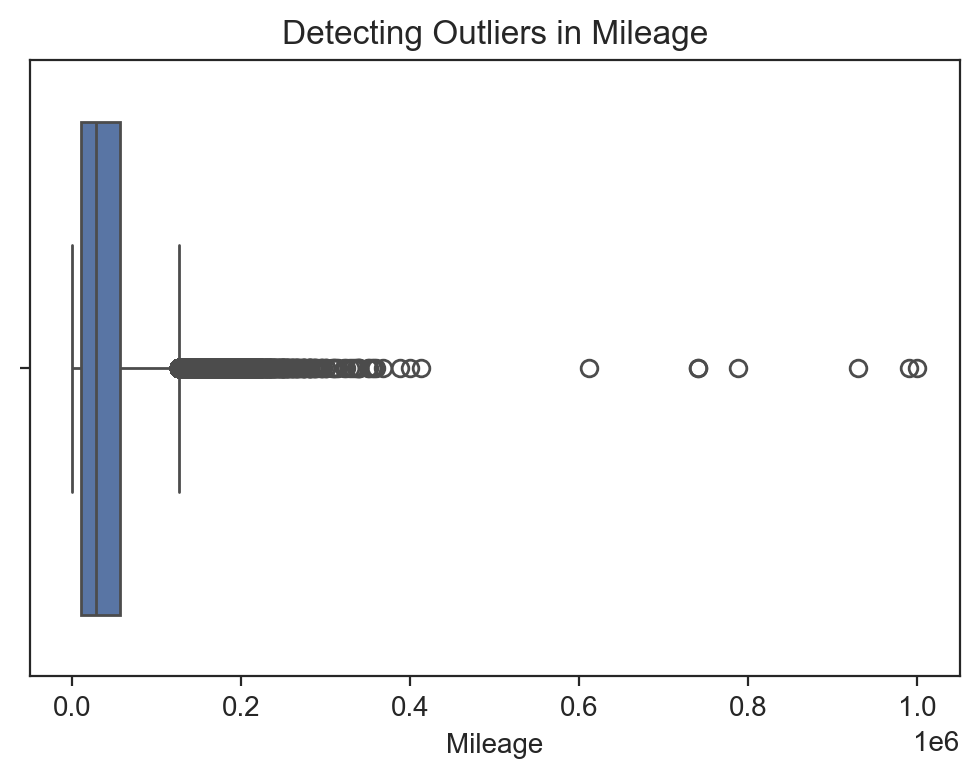

In [329]:
sns.boxplot(data=df, x='mileage')
plt.title("Detecting Outliers in Mileage")
plt.xlabel("Mileage")
#plt.savefig('Figures/Outliers_in_Mileage.png')
plt.show()

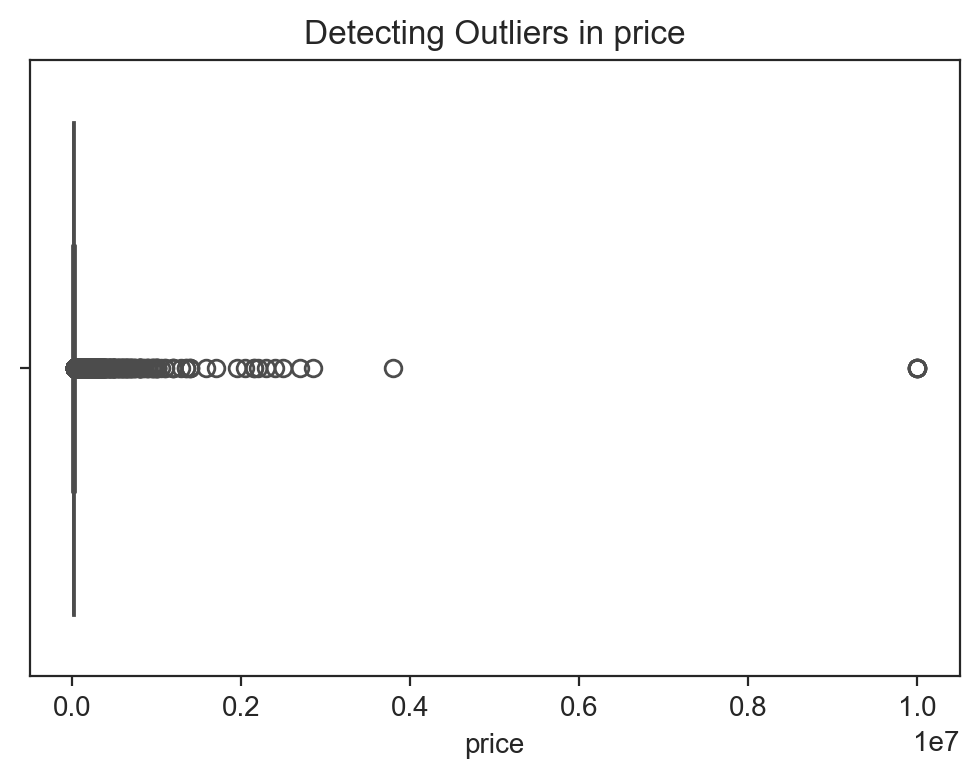

In [330]:
sns.boxplot(data=df, x='price')
plt.title("Detecting Outliers in price")
plt.xlabel("price")
# plt.savefig('Figures/Outliers_in_Price.png')
plt.show()

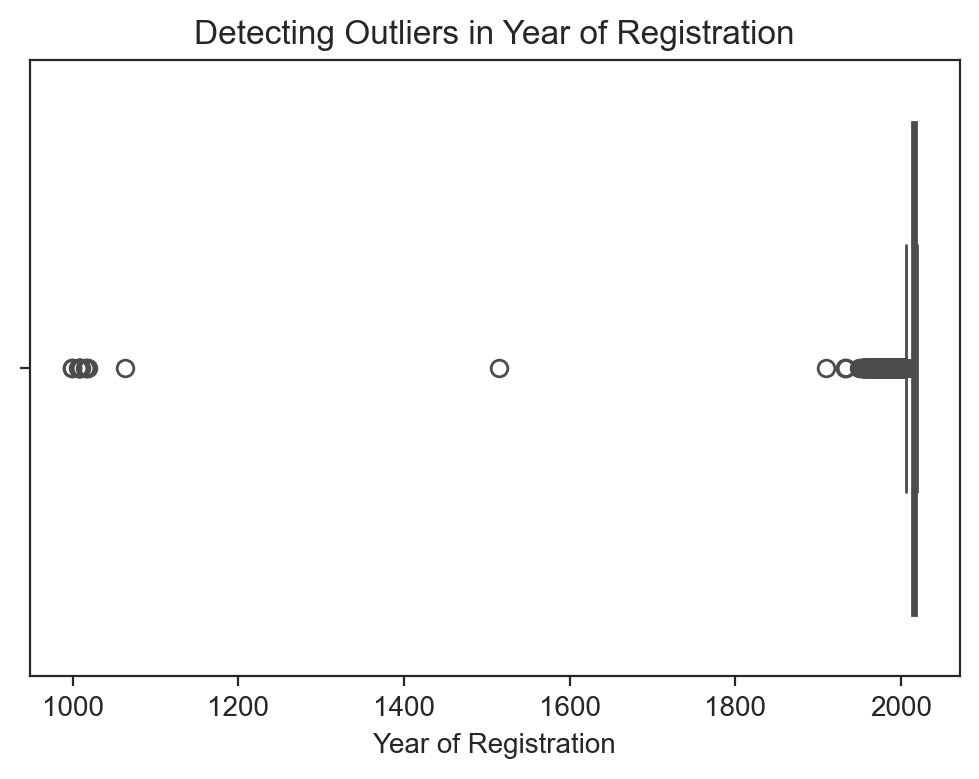

In [331]:
sns.boxplot(data=df, x='year_of_registration')
plt.title("Detecting Outliers in Year of Registration")
plt.xlabel("Year of Registration")
# plt.savefig('Figures/Outliers_in_Year_of_Registration.png')
plt.show()

In [332]:
df['vehicle_condition'].value_counts()

vehicle_condition
USED    370756
NEW      31249
Name: count, dtype: int64

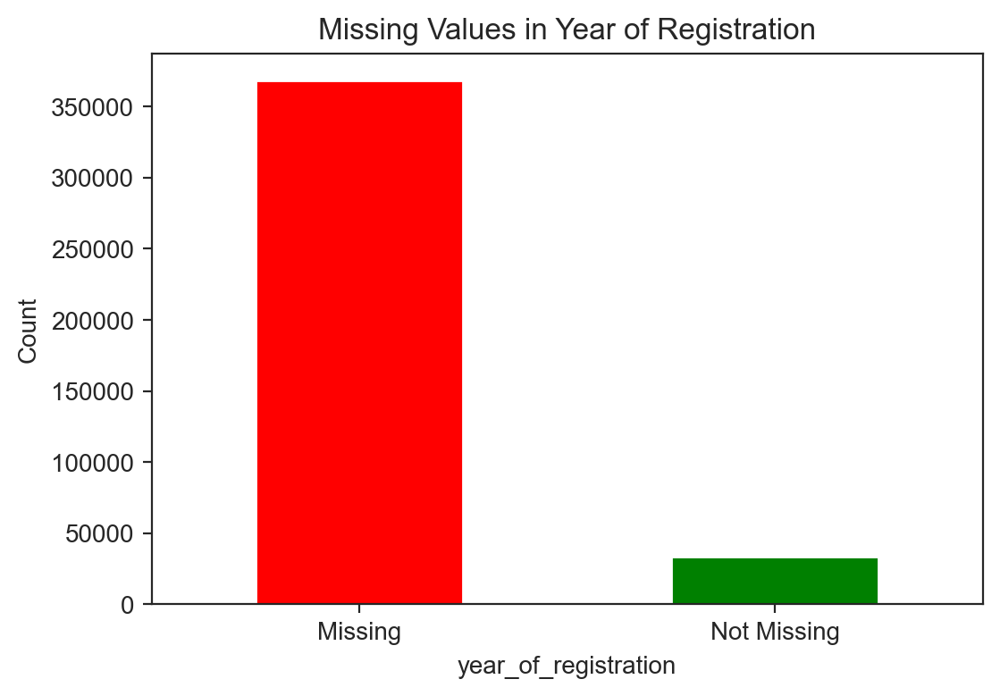

In [333]:
df['year_of_registration'].isna().value_counts().plot(kind='bar', color=['red', 'green'],  )
plt.title('Missing Values in Year of Registration')
plt.ylabel('Count')
plt.xticks([0, 1], ['Missing', 'Not Missing'], rotation=0)
# plt.savefig('Figures/Missing_Values_in_year_of_registration.png')
plt.show()

In [334]:
df.loc[df["year_of_registration"].isnull(), "vehicle_condition"].value_counts()

vehicle_condition
NEW     31249
USED     2062
Name: count, dtype: int64

#### Year&Mileage

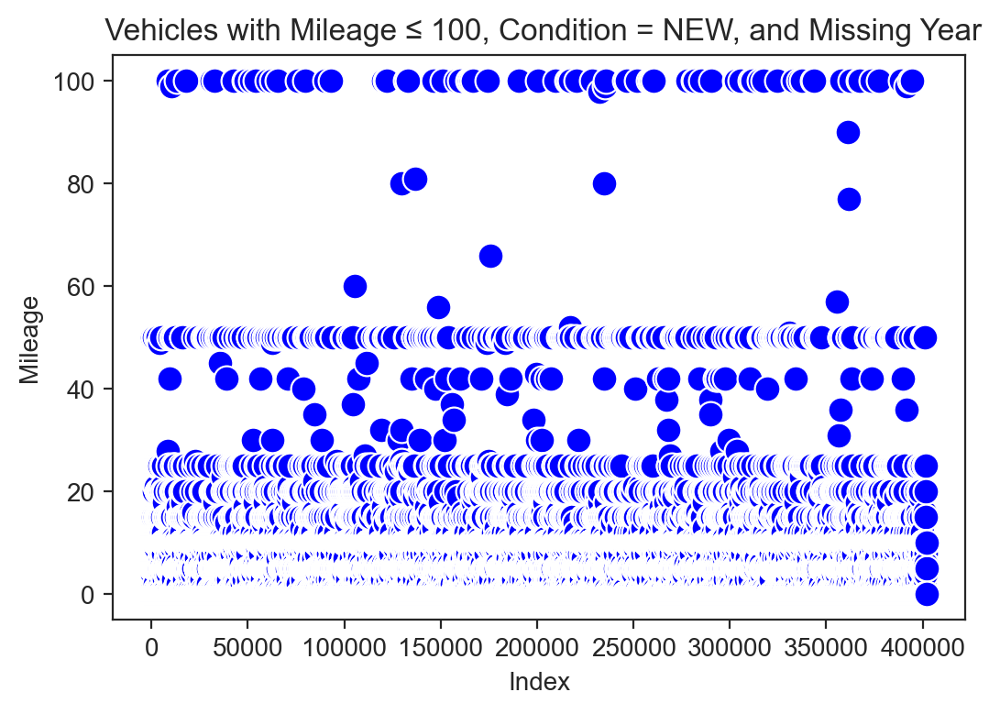

In [336]:
condition = (df['mileage'] <= 100) & (df['vehicle_condition'] == 'NEW') & (df['year_of_registration'].isna())
filtered_data = df[condition]
sns.scatterplot(data=filtered_data, x=filtered_data.index, y='mileage', color='blue', s=100)
plt.title(" Vehicles with Mileage ≤ 100, Condition = NEW, and Missing Year")
plt.xlabel("Index")
plt.ylabel("Mileage")
# plt.savefig('Figures/Vehicles_with_Mileage_≤_100_Condition_=_NEW_and_Missing_Year.png')
plt.show()


In [337]:
df.loc[(df['mileage'] <= 100) & (df['vehicle_condition'] == 'NEW') & (df['year_of_registration'].isna()), 'year_of_registration'] = 2020

In [338]:
print(df[(df['mileage'] <= 100) & (df['vehicle_condition'] == 'NEW') & (df['year_of_registration'] == 2020)])

        public_reference  mileage reg_code standard_colour standard_make  \
0        202006039777689      0.0      NaN            Grey         Volvo   
17       201911043995897      5.0      NaN             NaN        Nissan   
19       202008272998331      0.0      NaN           White    Volkswagen   
37       202001306737473      0.0      NaN           White          Fiat   
44       202003178531910      0.0      NaN             NaN         Honda   
...                  ...      ...      ...             ...           ...   
401860   202010024501227     10.0      NaN          Silver    Mitsubishi   
401890   202010104843364      5.0      NaN             Red           BMW   
401902   202010134960554     10.0      NaN           White           BMW   
401905   202010144983518      0.0      NaN             Red    Land Rover   
401971   202010285515882     10.0      NaN            Grey        Nissan   

            standard_model vehicle_condition  year_of_registration  price  \
0         

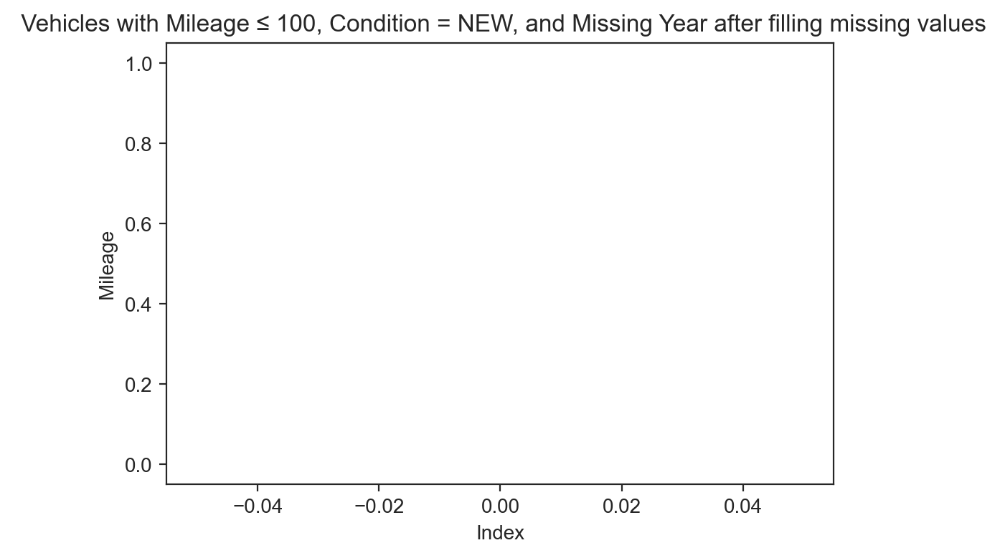

In [339]:
condition = (df['mileage'] <= 100) & (df['vehicle_condition'] == 'NEW') & (df['year_of_registration'].isna())
filtered_data = df[condition]
sns.histplot(data=filtered_data, x=filtered_data.index, y='mileage', color='blue')
plt.title(" Vehicles with Mileage ≤ 100, Condition = NEW, and Missing Year after filling missing values")
plt.xlabel("Index")
plt.ylabel("Mileage")
#plt.savefig('Figures/Vehicles_with_Mileage_≤_100_Condition_=_NEW_and_Missing_Year.png')
plt.show()


In [340]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration      2062
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

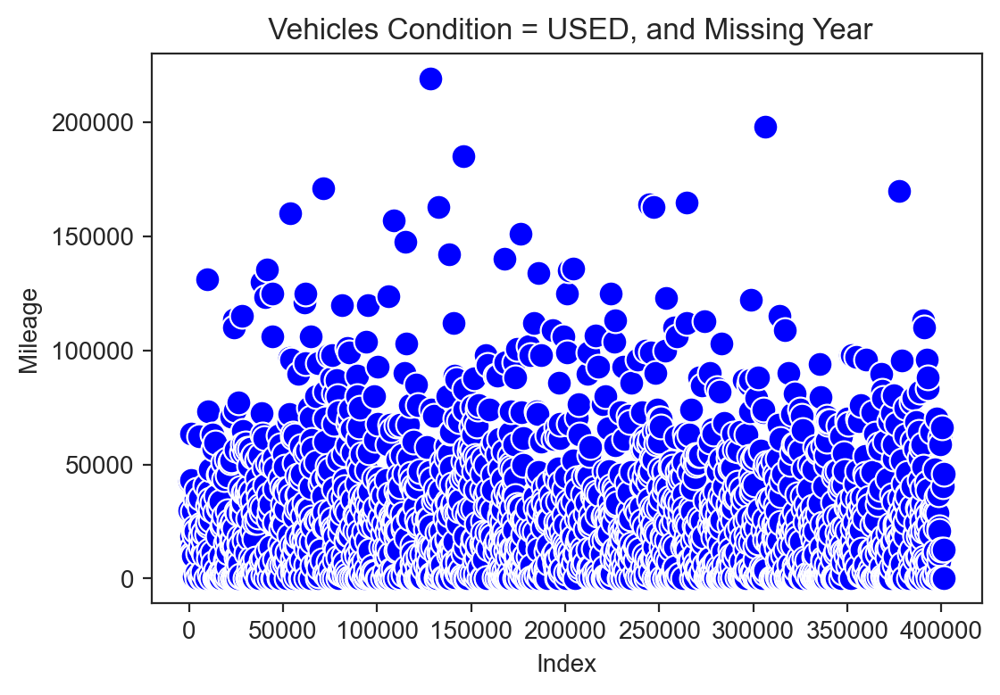

In [341]:
condition = (df['vehicle_condition'] == 'USED') & (df['year_of_registration'].isna())
filtered_data = df[condition]
sns.scatterplot(data=filtered_data, x=filtered_data.index, y='mileage', color='blue', s=100)
plt.title(" Vehicles Condition = USED, and Missing Year")
plt.xlabel("Index")
plt.ylabel("Mileage")
# plt.savefig('Figures/Vehicles_Condition_=_USED_and_Missing_Year.png')
plt.show()


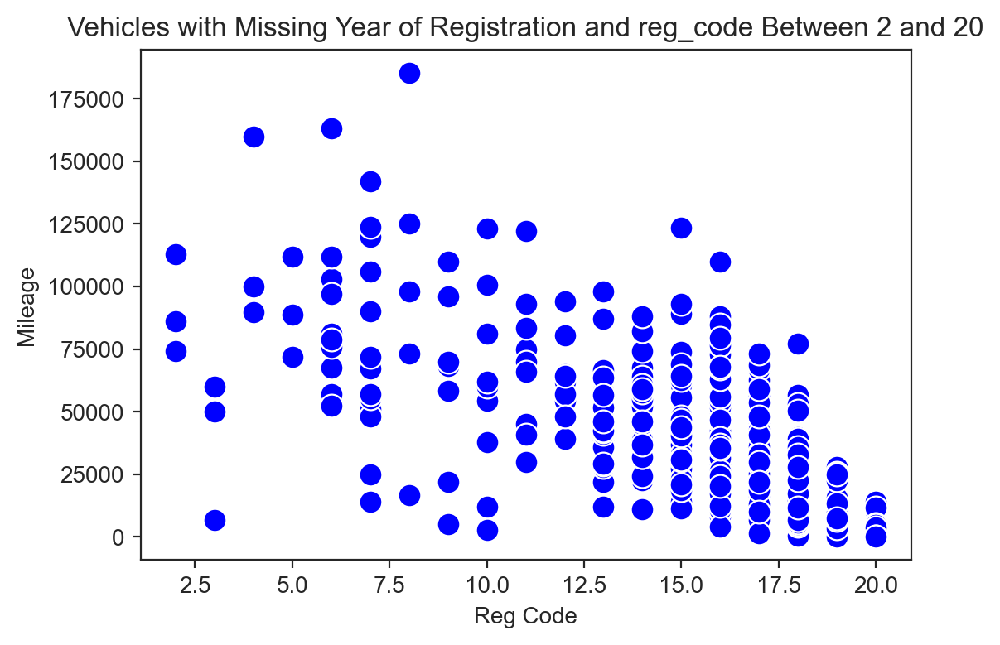

In [342]:
df['reg_code'] = pd.to_numeric(df['reg_code'], errors='coerce')

# Filter the data where reg_code is within the range 51 to 70 and year_of_registration is missing
filtered_data_20 = df[(df['reg_code'] >= 2) & (df['reg_code'] <= 20) & (df['year_of_registration'].isna())]

sns.scatterplot(data=filtered_data_20, x='reg_code', y='mileage', color='blue', s=100)
plt.title("Vehicles with Missing Year of Registration and reg_code Between 2 and 20")
plt.xlabel("Reg Code")
plt.ylabel("Mileage")
# plt.savefig('Figures/Vehicles_ with_Missing_Year_of_Registration_and_reg_code Between 2 and 20.png')
plt.show()


In [343]:
# Define the mapping dictionary for reg_code to year_of_registration
reg_code_to_year = {
    2: 2002, 3: 2003, 4: 2004, 5: 2005, 6: 2006,
    7: 2007, 8: 2008, 9: 2009, 10: 2010, 11: 2011,
    12: 2012, 13: 2013, 14: 2014, 15: 2015, 16: 2016,
    17: 2017, 18: 2018, 19: 2019, 20: 2020 
}
# Filter the data where reg_code is within the range 51 to 70 and year_of_registration is missing
filltered_data_2_to_20 = df[(df['reg_code'] >= 2) & (df['reg_code'] <= 20) & (df['year_of_registration'].isna())]

filltered_data_2_to_20

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
54,202007030806426,30000.0,18.0,Red,Vauxhall,Insignia,USED,NaN,11990,Hatchback,False,Petrol
968,202010305607535,63369.0,17.0,Blue,SKODA,Rapid Spaceback,USED,NaN,7490,Hatchback,False,Diesel
2243,202010094816021,29691.0,17.0,White,Audi,A4,USED,NaN,14398,Saloon,False,Diesel
3208,202009284304835,22630.0,18.0,Grey,Audi,Q2,USED,NaN,22499,SUV,False,Petrol
5965,202010225293331,1604.0,20.0,Blue,Porsche,718 Spyder,USED,NaN,95900,Convertible,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
398974,202010265463361,7500.0,19.0,Grey,Vauxhall,Corsa,USED,NaN,9895,Hatchback,False,Petrol
399000,202010315634191,11000.0,14.0,Bronze,Peugeot,108,USED,NaN,5995,Hatchback,False,Petrol
400725,202008252905656,45.0,20.0,Silver,Land Rover,Range Rover Evoque,USED,NaN,46945,SUV,False,Diesel
401323,201909222504136,46000.0,13.0,Grey,Volkswagen,Caravelle,USED,NaN,22995,MPV,False,Diesel


In [344]:
missing_year_condition = (df['year_of_registration'].isna()) & (df['reg_code'].isin(reg_code_to_year.keys()))

# Fill missing year_of_registration using reg_code mapping
df.loc[missing_year_condition, 'year_of_registration'] = df.loc[missing_year_condition, 'reg_code'].map(reg_code_to_year)

# Check if there are still missing values in year_of_registration
missing_after_fill = df['year_of_registration'].isna().sum()
print(f"Number of missing values in year_of_registration after filling: {missing_after_fill}")

Number of missing values in year_of_registration after filling: 1255


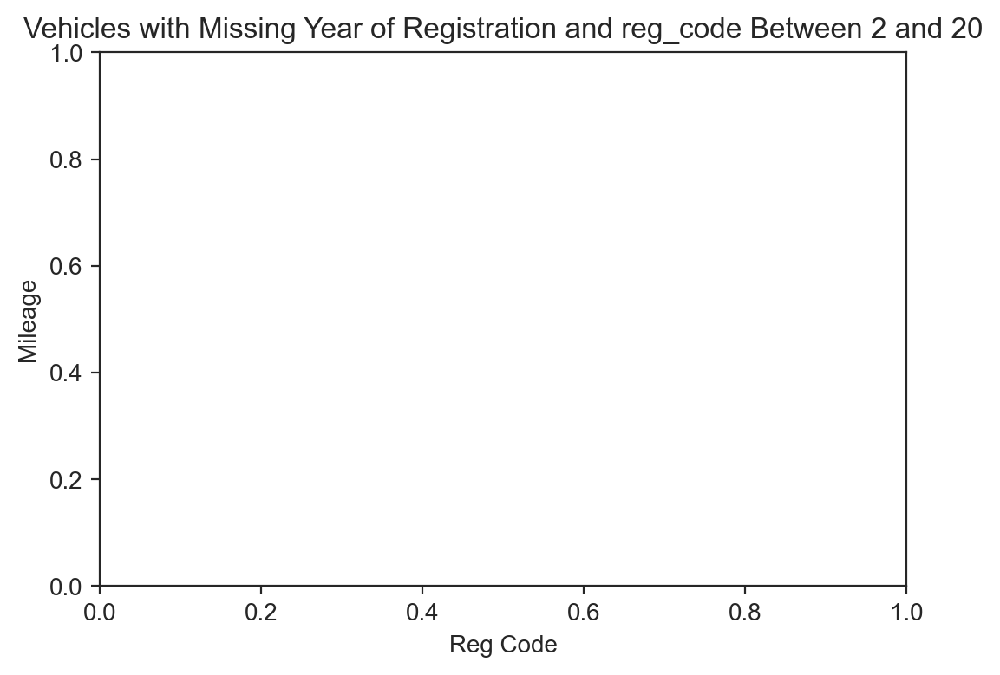

In [345]:
df['reg_code'] = pd.to_numeric(df['reg_code'], errors='coerce')

# Filter the data where reg_code is within the range 51 to 70 and year_of_registration is missing
filtered_data_20 = df[(df['reg_code'] >= 2) & (df['reg_code'] <= 20) & (df['year_of_registration'].isna())]

sns.scatterplot(data=filtered_data_20, x='reg_code', y='mileage', color='blue', s=100)
plt.title("Vehicles with Missing Year of Registration and reg_code Between 2 and 20")
plt.xlabel("Reg Code")
plt.ylabel("Mileage")
# plt.savefig('Figures/Vehicles_ with_Missing_Year_of_Registration_and_reg_code Between 2 and 20.png')
plt.show()


In [346]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 34772
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration      1255
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

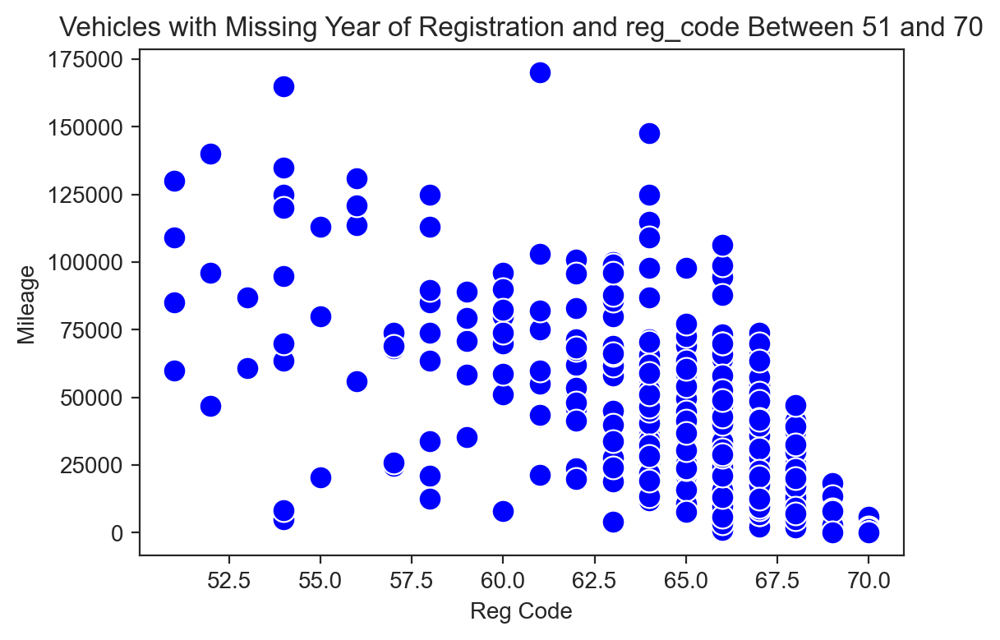

In [347]:
# Filter the data where reg_code is within the range 51 to 70 and year_of_registration is missing
filtered_data_70 = df[(df['reg_code'] >= 51) & (df['reg_code'] <= 70) & (df['year_of_registration'].isna())]

sns.scatterplot(data=filtered_data_70, x='reg_code', y='mileage', color='blue', s=100)
plt.title("Vehicles with Missing Year of Registration and reg_code Between 51 and 70")
plt.xlabel("Reg Code")
plt.ylabel("Mileage")
# plt.savefig('Figures/Vehicles_ with_Missing_Year_of_Registration_and_reg_code Between 51 and 70.png')
plt.show()


In [348]:
# Define the mapping dictionary for reg_code to year_of_registration
reg_code_to_year_70 = {
    51: 2001, 52: 2002, 53: 2003, 54: 2004, 55: 2005,
    56: 2006, 57: 2007, 58: 2008, 59: 2009, 60: 2010,
    61: 2011, 62: 2012, 63: 2013, 64: 2014, 65: 2015,
    66: 2016, 67: 2017, 68: 2018, 69: 2019, 70: 2020, 
}

# Filter rows where year_of_registration is missing and reg_code is between 51 and 70
filltered_data_51_to_70 = df[(df['year_of_registration'].isna()) & (df['reg_code'].isin(reg_code_to_year_70.keys()))]
filltered_data_51_to_70

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
83,202008222801747,42847.0,61.0,Red,Honda,Jazz,USED,NaN,5695,Hatchback,False,Petrol
865,202010084741550,43130.0,66.0,White,Land Rover,Range Rover Sport,USED,NaN,35990,SUV,False,Diesel
1256,202010225294466,18715.0,68.0,White,Volvo,V40,USED,NaN,16950,NaN,False,Petrol
1578,202010175102430,10926.0,68.0,Blue,BMW,1 Series,USED,NaN,22290,Hatchback,False,Diesel
2168,202009183885679,10000.0,68.0,White,Kia,Sportage,USED,NaN,21500,SUV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...,...
399222,202010155019609,62129.0,64.0,Blue,Audi,S3,USED,NaN,17795,NaN,False,Petrol
399236,202010175112471,59000.0,64.0,Silver,Volkswagen,Campervan,USED,NaN,27995,NaN,False,Diesel
399325,201911074123845,10.0,69.0,Silver,SsangYong,Korando,USED,NaN,24990,SUV,False,Petrol
400336,202010315635977,66287.0,63.0,Blue,Vauxhall,Astra GTC,USED,NaN,8400,Coupe,False,Petrol


In [349]:
missing_year_condition_70 = (df['year_of_registration'].isna()) & (df['reg_code'].isin(reg_code_to_year_70.keys()))
# Fill missing year_of_registration using reg_code mapping
df.loc[missing_year_condition_70, 'year_of_registration'] = df.loc[missing_year_condition_70, 'reg_code'].map(reg_code_to_year_70)

# Check if there are still missing values in year_of_registration
missing_after_fill = df['year_of_registration'].isna().sum()
print(f"Number of missing values in year_of_registration after filling: {missing_after_fill}")


Number of missing values in year_of_registration after filling: 378


In [350]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 34772
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       378
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [408]:
mean_year_of_registration = df["year_of_registration"].median()
mean_year_of_registration = int(mean_year_of_registration)
mean_year_of_registration

2017

In [424]:
# Fill the missing values (NaN) in 'year_of_registration' with the calculated mean
df['year_of_registration'].fillna(mean_year_of_registration)

# Verify that the missing values are filled
print(df['year_of_registration'].isna().sum()) 

378


In [426]:
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 34772
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       378
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [129]:
#Checking if there is any data available where mileage is zero condition is used
filtered_data_used = df[
    (df['mileage'] == 0) &
    (df['vehicle_condition'] == "USED")
]
filtered_data_used

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
810,202009254208702,0.0,70.0,Grey,Land Rover,Range Rover Velar,USED,2020.0,52995,SUV,False,Diesel
1656,202011015669636,0.0,13.0,Silver,Vauxhall,Insignia,USED,2013.0,2975,Hatchback,False,Diesel
1855,202010014447366,0.0,70.0,Grey,Mercedes-Benz,CLA Class,USED,2020.0,34995,Estate,False,Petrol
2201,202009304376426,0.0,70.0,Black,Land Rover,Range Rover,USED,2020.0,82750,SUV,False,Diesel
2754,202008283030532,0.0,63.0,Black,Audi,A1,USED,2013.0,8000,Hatchback,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...,...
392399,202009153775246,0.0,70.0,NaN,Nissan,Micra,USED,2020.0,15495,Hatchback,False,Petrol
392484,202010034543274,0.0,70.0,Black,Audi,Q2,USED,2020.0,22300,SUV,False,Petrol
397265,202010225306510,0.0,70.0,Blue,SEAT,Arona,USED,2020.0,18648,SUV,False,Petrol
398534,202010094812357,0.0,70.0,White,Audi,E-Tron,USED,2020.0,80000,SUV,False,Electric


In [131]:
filtered_data_used.count()

public_reference         355
mileage                  355
reg_code                 348
standard_colour          343
standard_make            355
standard_model           355
vehicle_condition        355
year_of_registration     353
price                    355
body_type                349
crossover_car_and_van    355
fuel_type                348
dtype: int64

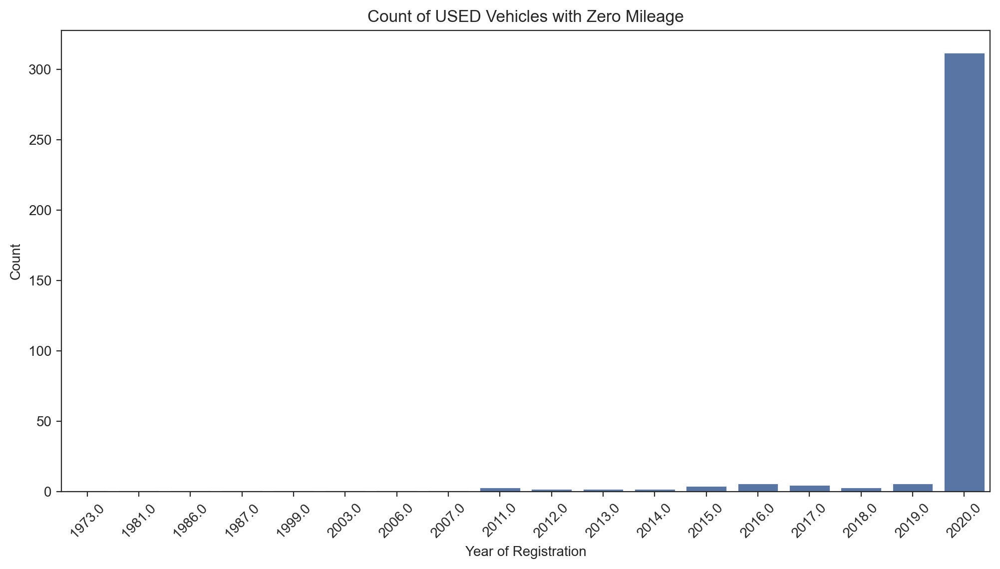

In [133]:
plt.figure(figsize=(12, 6))
sns.countplot(data=filtered_data_used, x='year_of_registration')
plt.title('Count of USED Vehicles with Zero Mileage')
plt.xlabel('Year of Registration')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Count of USED Vehicles with Zero Mileage.png')
plt.show()

In [134]:
#Checking how many values we have where mileage is zero, condtion is Used and year of registration is 2020
filtered_data_used_2020 = df[
    (df['mileage'] == 0) &
    (df['vehicle_condition'] == "USED") &
    (df['year_of_registration'] == 2020)
]
filtered_data_used_2020

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
810,202009254208702,0.0,70.0,Grey,Land Rover,Range Rover Velar,USED,2020.0,52995,SUV,False,Diesel
1855,202010014447366,0.0,70.0,Grey,Mercedes-Benz,CLA Class,USED,2020.0,34995,Estate,False,Petrol
2201,202009304376426,0.0,70.0,Black,Land Rover,Range Rover,USED,2020.0,82750,SUV,False,Diesel
3541,202009244132959,0.0,70.0,Blue,Volkswagen,Golf,USED,2020.0,22000,Hatchback,False,Diesel
5712,202010315640207,0.0,70.0,White,Renault,Clio,USED,2020.0,13995,Hatchback,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
389102,202009224052853,0.0,70.0,Multicolour,Volkswagen,up!,USED,2020.0,12490,Hatchback,False,Petrol
392399,202009153775246,0.0,70.0,NaN,Nissan,Micra,USED,2020.0,15495,Hatchback,False,Petrol
392484,202010034543274,0.0,70.0,Black,Audi,Q2,USED,2020.0,22300,SUV,False,Petrol
397265,202010225306510,0.0,70.0,Blue,SEAT,Arona,USED,2020.0,18648,SUV,False,Petrol


In [135]:
filtered_data_used_2020.count()

public_reference         312
mileage                  312
reg_code                 312
standard_colour          301
standard_make            312
standard_model           312
vehicle_condition        312
year_of_registration     312
price                    312
body_type                308
crossover_car_and_van    312
fuel_type                305
dtype: int64

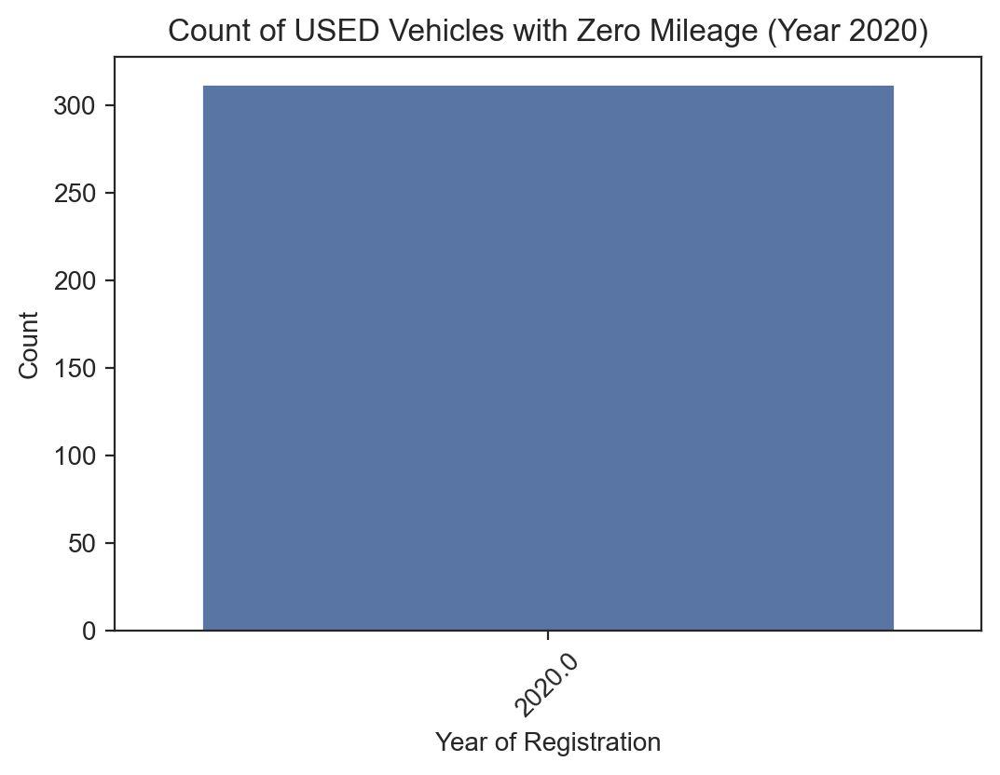

In [138]:
sns.countplot(data=filtered_data_used_2020, x='year_of_registration')
plt.title('Count of USED Vehicles with Zero Mileage (Year 2020)')
plt.xlabel('Year of Registration')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Count of USED Vehicles with Zero Mileage(Year 2020).png')
plt.show()

In [140]:
#Changing vehicle conditon to New where mileage is zero and year of registration is Used
df.loc[(df['mileage'] == 0) &  (df['year_of_registration'] == 2020), 'vehicle_condition'] = "NEW"

In [141]:
#checking if there is any values left where condition is used, mileage is zero and year of registrationis 2020
filtered_data_usedd = df[
    (df['mileage'] == 0) &
    (df['vehicle_condition'] == "USED")
]
filtered_data_usedd

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
1656,202011015669636,0.0,13.0,Silver,Vauxhall,Insignia,USED,2013.0,2975,Hatchback,False,Diesel
2754,202008283030532,0.0,63.0,Black,Audi,A1,USED,2013.0,8000,Hatchback,False,Diesel
8650,202010295556496,0.0,69.0,Black,Fiat,500X,USED,2019.0,13500,SUV,False,Petrol
8677,201704033991344,0.0,NaN,Red,Porsche,911,USED,1987.0,89995,Convertible,False,Petrol
11740,202007141210626,0.0,69.0,Blue,Vauxhall,Crossland X,USED,2019.0,17995,SUV,False,Petrol
12197,202009294356481,0.0,68.0,Black,Jaguar,XE,USED,2018.0,19995,Saloon,False,Petrol
17265,202010215247763,0.0,65.0,Red,Renault,Kadjar,USED,2015.0,10699,SUV,False,Diesel
22228,202010205225321,0.0,69.0,Grey,Renault,Kadjar,USED,2019.0,15595,SUV,False,Diesel
23572,202002207520406,0.0,69.0,Red,Audi,A4,USED,2019.0,27300,Saloon,False,Petrol
24939,202003198578057,0.0,NaN,Red,Ferrari,488,USED,NaN,225000,Coupe,False,Petrol


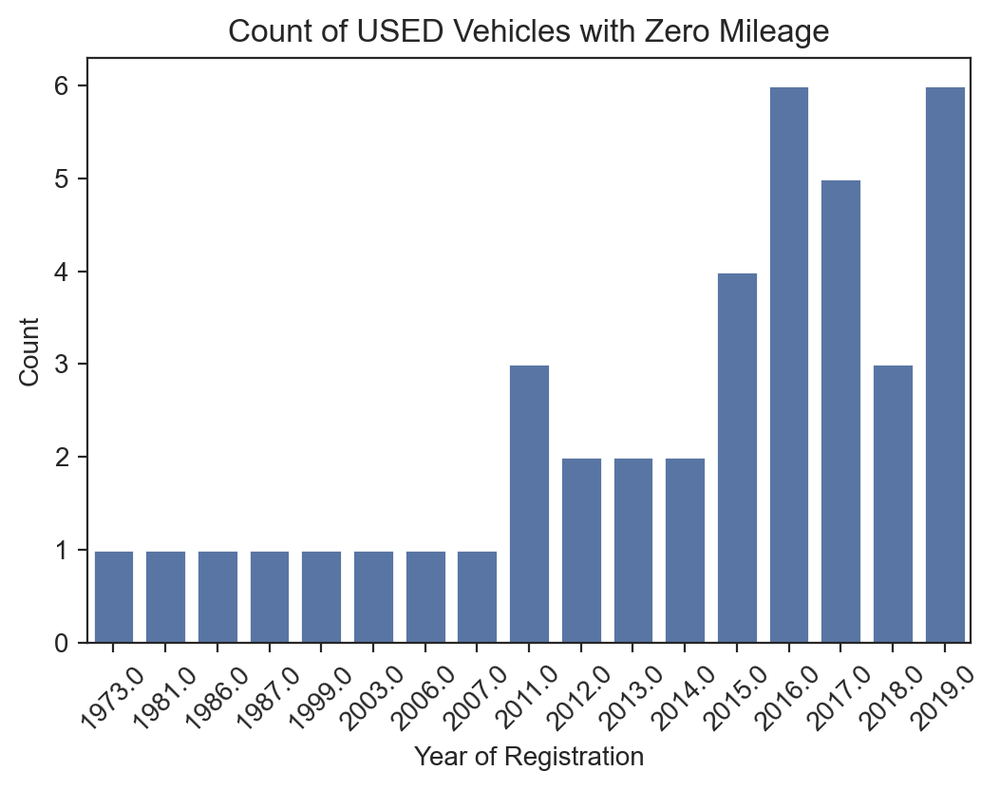

In [144]:
sns.countplot(data=filtered_data_usedd, x='year_of_registration')
plt.title('Count of USED Vehicles with Zero Mileage')
plt.xlabel('Year of Registration')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Distribution of Vehicle Condition After Update.png')
plt.show()

In [146]:
# Filter for used cars with valid mileage registered in 2020
valid_mileage_2019 = df[
    (df['mileage'] > 0) & 
    (df['vehicle_condition'] == 'USED') & 
    (df['year_of_registration'] >= 1973) &
    (df['year_of_registration'] <= 2019)
]

# Calculate the average mileage
average_mileage_2019 = valid_mileage_2019['mileage'].mean()
average_mileage_2019 = int(average_mileage_2019)
average_mileage_2019

44164

In [147]:
# Imputing mileage 44159 where mileage is zero, condition is used and year of registration is => 1973 and <= 2019
df.loc[(df['mileage'] == 0) & (df['vehicle_condition'] == 'USED') & (df['year_of_registration'] >= 1973) & (df['year_of_registration'] <= 2019), 'mileage'] = average_mileage_2019

In [149]:
# Check if there are any rows left where mileage is zero, year_of_registration is between 1973 and 2019, and vehicle_condition is USED
remaining_rows = df[
    (df['mileage'] == 0) & 
    (df['vehicle_condition'] == 'USED') & 
    (df['year_of_registration'] >= 1973) & 
    (df['year_of_registration'] <= 2019)
]

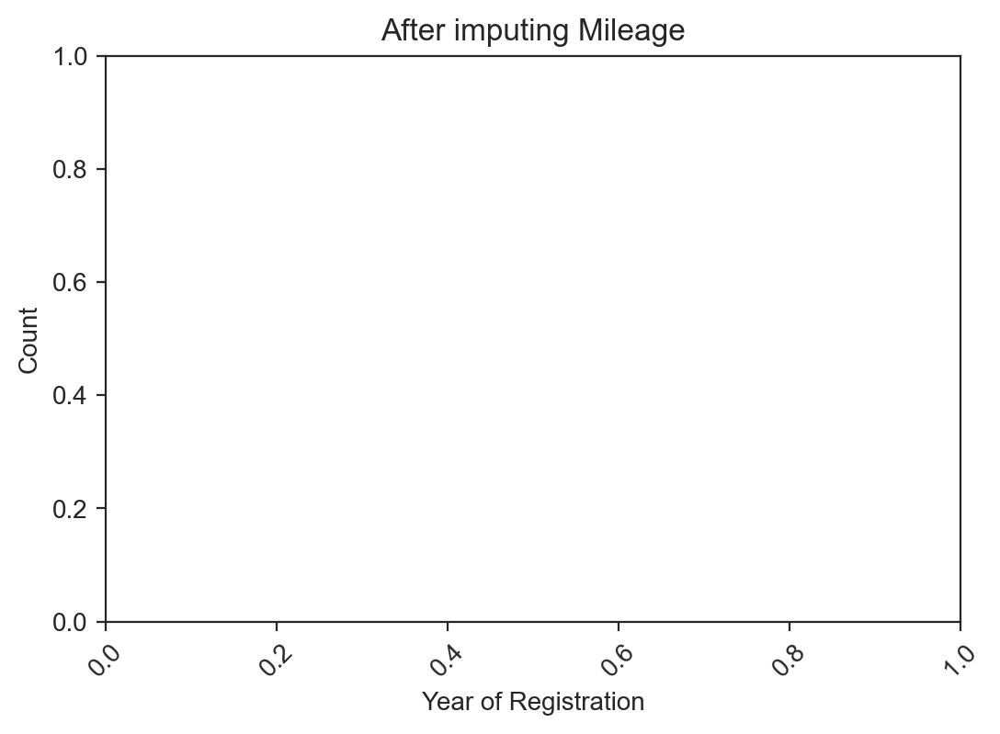

In [150]:
sns.countplot(data=remaining_rows, x='year_of_registration')
plt.title('After imputing Mileage')
plt.xlabel('Year of Registration')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/After imputing Mileage.png')
plt.show()

#### Mileage

In [155]:
#checking missing values in mileage
filtered_data_null = df[
    (df['mileage'].isnull())
]
filtered_data_null

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
4766,202003238706011,NaN,NaN,Grey,Subaru,Outback,USED,NaN,35995,Estate,False,Petrol
9178,202010084771255,NaN,20.0,Blue,BMW,3 Series,USED,2020.0,36990,Saloon,False,Diesel Hybrid
11188,202009284304657,NaN,9.0,Red,Citroen,C1,USED,2009.0,2699,Hatchback,False,Petrol
17166,202009264233189,NaN,15.0,Silver,Audi,A5 Cabriolet,USED,2015.0,13495,Convertible,False,Petrol
17416,202008192672386,NaN,NaN,Grey,SKODA,Octavia,USED,NaN,25085,Estate,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
391833,202010074725979,NaN,67.0,Grey,Audi,A7,USED,2017.0,28590,Hatchback,False,Diesel
395579,202010165062239,NaN,63.0,Blue,Kia,Venga,USED,2013.0,5995,Hatchback,False,Diesel
396360,202008052110771,NaN,12.0,Black,Citroen,C4,USED,2012.0,5999,Hatchback,False,Petrol
396367,202008112372413,NaN,6.0,Silver,Volkswagen,Polo,USED,2006.0,1399,Hatchback,False,Petrol


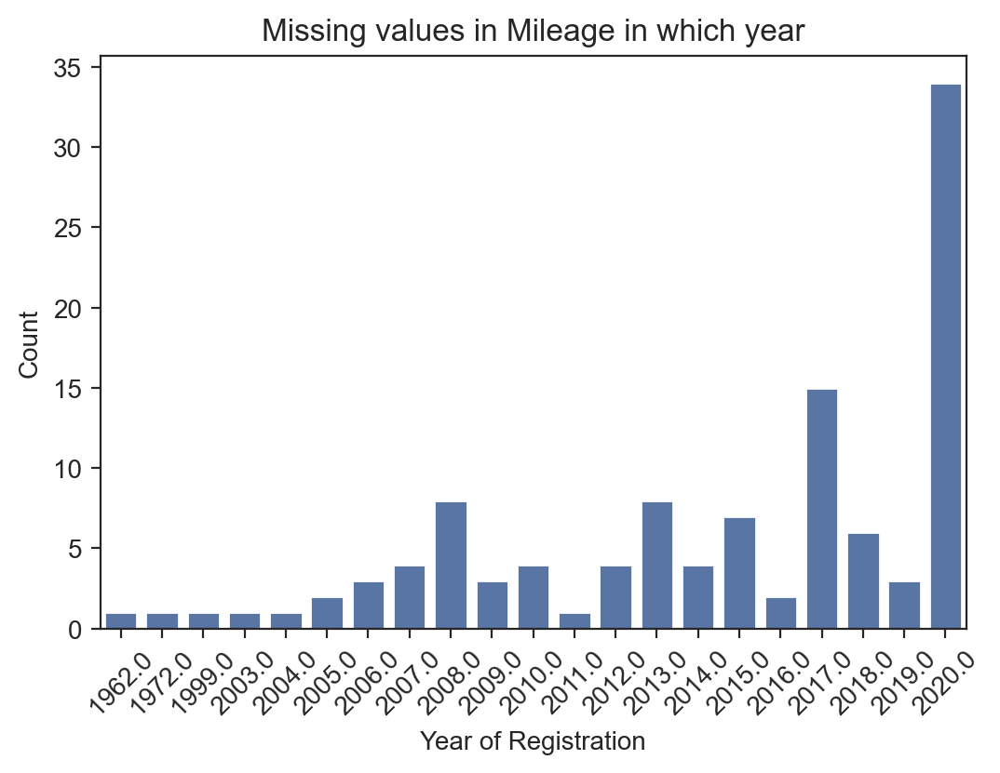

In [157]:
sns.countplot(data=filtered_data_null, x='year_of_registration')
plt.title('Missing values in Mileage in which year')
plt.xlabel('Year of Registration')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Missing values in Mileage in which year.png')
plt.show()

In [158]:
# Claulating avg of mileage where year of registration is >= 1962 and <= 2020 to impute the missing values of mileage
avg_mileage = df[
    (df['mileage'] > 0) & 
    (df['year_of_registration'] >= 1962) &
    (df['year_of_registration'] <= 2020)
]

# Calculate the average mileage
average_mileage = avg_mileage['mileage'].median()
average_mileage = int(average_mileage)
average_mileage

30086

In [159]:
# Imputing mileage 30096 where mileage is missing
df.loc[(df['mileage'].isnull()) & (df['year_of_registration'] >= 1962) & (df['year_of_registration'] <= 2020), 'mileage'] = average_mileage

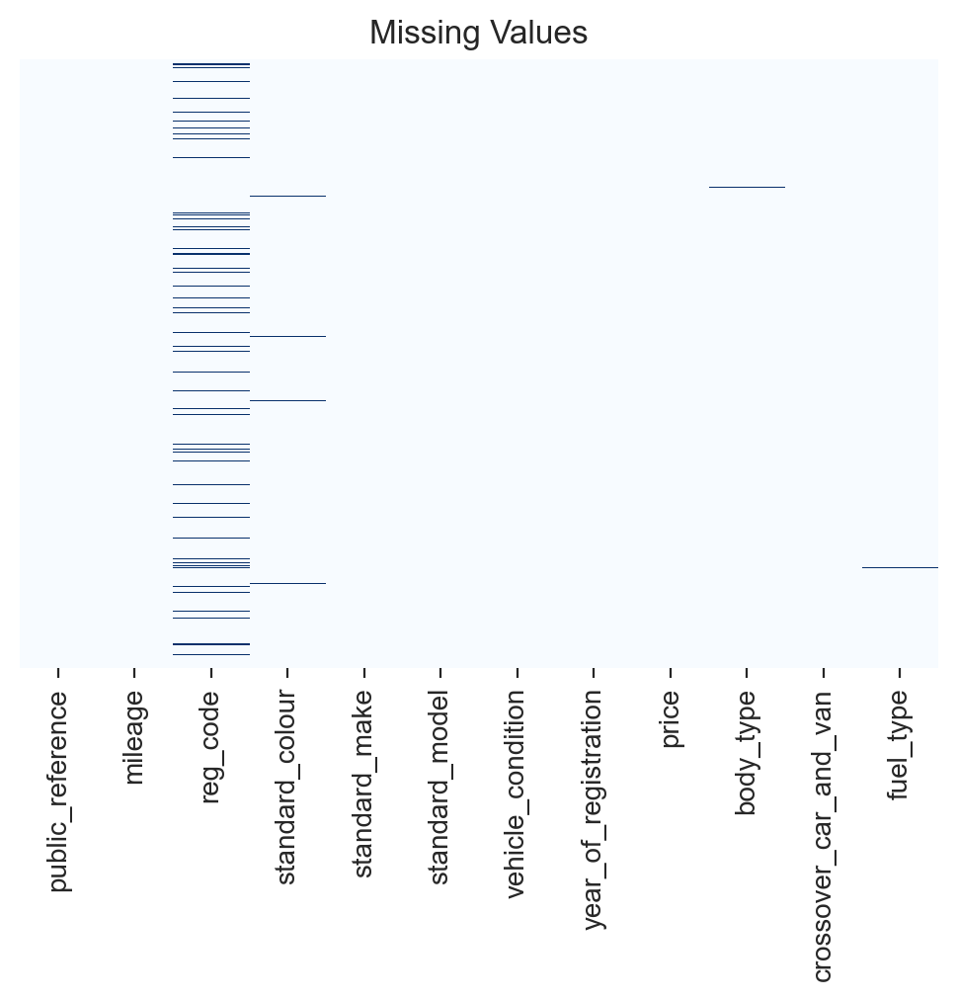

In [160]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False,cmap="Blues")
plt.title("Missing Values")
#plt.savefig('Missing_Values_in_Dataset.png')
plt.show()

In [161]:
df.isnull().sum()

public_reference             0
mileage                     14
reg_code                 34772
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       378
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [162]:
df.describe()

,public_reference,mileage,reg_code,year_of_registration,price
count,4.020050e+05,401991.000000,367233.000000,401627.000000,4.020050e+05
mean,2.020071e+14,37745.947489,40.437578,2015.401467,1.734197e+04
std,1.691662e+10,34825.038946,25.204174,7.749230,4.643746e+04
min,2.013072e+14,0.000000,2.000000,999.000000,1.200000e+02
25%,2.020090e+14,10494.000000,16.000000,2014.000000,7.495000e+03
50%,2.020093e+14,28657.000000,54.000000,2017.000000,1.260000e+04
75%,2.020102e+14,56853.500000,66.000000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,95.000000,2020.000000,9.999999e+06


#### Colour, Type, & Fuel

#### Colour

In [166]:
df['standard_colour'].value_counts()

standard_colour
Black          86287
White          70535
Grey           68227
Blue           59784
Silver         49323
Red            42024
Green           4534
Orange          4088
Yellow          2097
Brown           2014
Multicolour     1854
Beige           1539
Bronze          1330
Purple          1211
Gold             818
Pink             410
Turquoise        307
Maroon           159
Burgundy          63
Magenta           15
Navy               7
Indigo             1
Name: count, dtype: int64

In [167]:
top_6_colors = df['standard_colour'].value_counts().head(6)

print(top_6_colors)

standard_colour
Black     86287
White     70535
Grey      68227
Blue      59784
Silver    49323
Red       42024
Name: count, dtype: int64


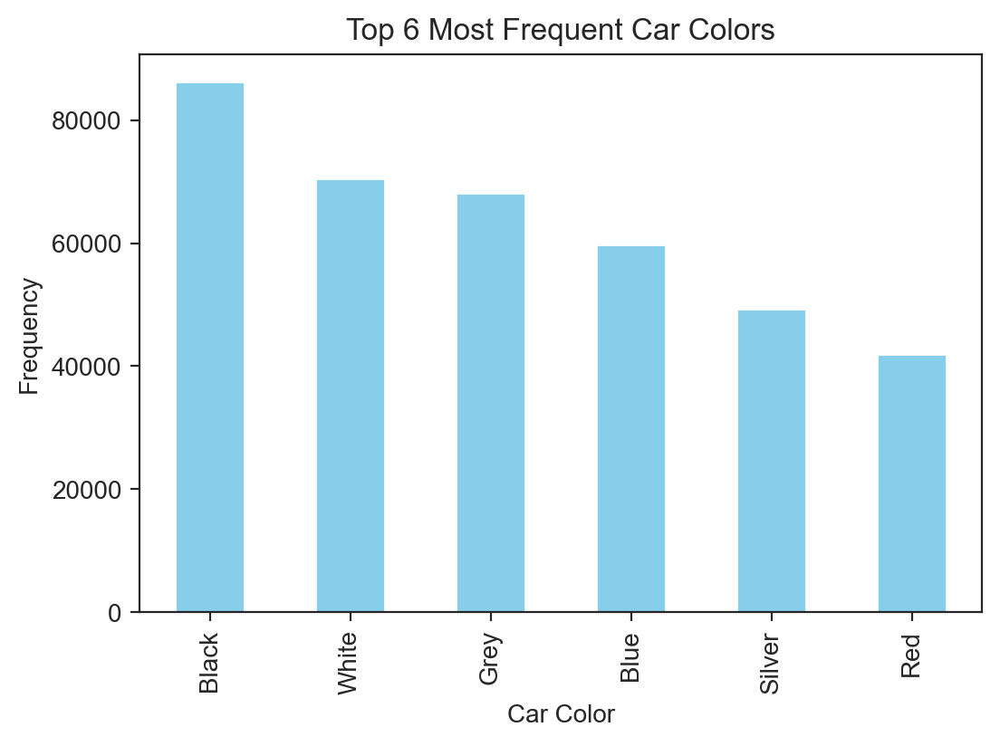

In [169]:
top_6_colors.plot(kind='bar', color='skyblue')
plt.title('Top 6 Most Frequent Car Colors')
plt.xlabel('Car Color')
plt.ylabel('Frequency')
#plt.savefig('Figures/Top_6_colors.png')
plt.show()

In [172]:
df['standard_colour'] = df['standard_colour'].fillna(top_6_colors.sample(n=1, replace=True).index[0])

In [173]:
print(df['standard_colour'].isna().sum())

0


In [174]:
df['standard_colour'].value_counts().head(6)

standard_colour
Black     86287
Grey      73605
White     70535
Blue      59784
Silver    49323
Red       42024
Name: count, dtype: int64

In [175]:
df.isnull().sum()

public_reference             0
mileage                     14
reg_code                 34772
standard_colour              0
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       378
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [176]:
top_colors = df['standard_colour'].value_counts().head(6)

# Replace all other colors with "Other"
df['standard_colour'] = df['standard_colour'].apply(lambda x: x if x in top_colors else 'Others')

# Display the updated color counts
print(df['standard_colour'].value_counts())


standard_colour
Black     86287
Grey      73605
White     70535
Blue      59784
Silver    49323
Red       42024
Others    20447
Name: count, dtype: int64


In [177]:
df.head(100)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,2020.0,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61.0,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17.0,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16.0,Others,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64.0,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...,...
95,202008313128882,29062.0,66.0,Grey,Mercedes-Benz,A Class,USED,2016.0,15877,Hatchback,False,Petrol
96,202009013153778,17375.0,67.0,White,Peugeot,108,USED,2018.0,7000,Hatchback,False,Petrol
97,202009013160255,32000.0,67.0,Others,Vauxhall,Mokka X,USED,2017.0,11695,SUV,False,Petrol
98,202009013177261,5659.0,67.0,Blue,Nissan,Micra,USED,2017.0,10495,Hatchback,False,Petrol


#### Fuel

In [179]:
df['fuel_type'].value_counts()


fuel_type
Petrol                   216929
Diesel                   158120
Petrol Hybrid             13602
Petrol Plug-in Hybrid      6160
Electric                   4783
Diesel Hybrid              1403
Bi Fuel                     221
Diesel Plug-in Hybrid       185
Natural Gas                   1
Name: count, dtype: int64

In [180]:
df = df[~df['fuel_type'].isin(['Natural Gas', 'Bi Fuel'])]

In [181]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,2020.0,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61.0,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17.0,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16.0,Others,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64.0,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [182]:
df['fuel_type'].value_counts()

fuel_type
Petrol                   216929
Diesel                   158120
Petrol Hybrid             13602
Petrol Plug-in Hybrid      6160
Electric                   4783
Diesel Hybrid              1403
Diesel Plug-in Hybrid       185
Name: count, dtype: int64

In [183]:
df['fuel_type'] = df['fuel_type'].replace({
    'Petrol Hybrid': 'Petro_Hybrid_and_Plugin',
    'Petrol Plug-in Hybrid': 'Petro_Hybrid_and_Plugin',
    'Diesel Hybrid': 'Diesel_Hybrid_and_Plugin',
    'Diesel Plug-in Hybrid': 'Diesel_Hybrid_and_Plugin'
})

# Verify the changes
print(df['fuel_type'].value_counts())

fuel_type
Petrol                      216929
Diesel                      158120
Petro_Hybrid_and_Plugin      19762
Electric                      4783
Diesel_Hybrid_and_Plugin      1588
Name: count, dtype: int64


<function matplotlib.pyplot.show(close=None, block=None)>

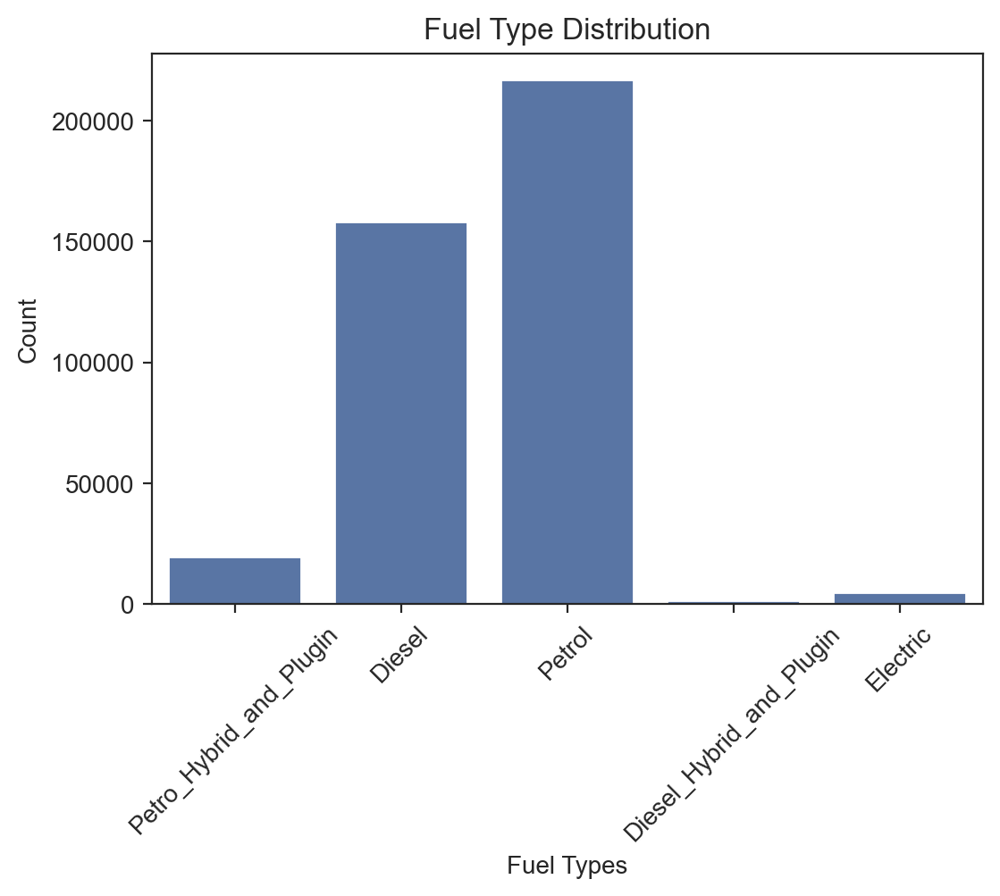

In [184]:
sns.countplot(x="fuel_type", data=df)
plt.title('Fuel Type Distribution')
plt.xlabel('Fuel Types')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Fuel_Type_Distribution.png')
plt.show

In [185]:

most_frequent_fuel_type = df['fuel_type'].mode()[0]

# Fill missing values in 'fuel_type' with the Mode
df['fuel_type'] = df['fuel_type'].fillna(most_frequent_fuel_type)

# Verify the changes
print(df['fuel_type'].value_counts())


fuel_type
Petrol                      217530
Diesel                      158120
Petro_Hybrid_and_Plugin      19762
Electric                      4783
Diesel_Hybrid_and_Plugin      1588
Name: count, dtype: int64


In [186]:
df.isnull().sum()

public_reference             0
mileage                     14
reg_code                 34621
standard_colour              0
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       376
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                    0
dtype: int64

In [187]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,2020.0,73970,SUV,False,Petro_Hybrid_and_Plugin
1,202007020778260,108230.0,61.0,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17.0,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16.0,Others,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64.0,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


#### Body Type

In [189]:
df['body_type'].value_counts()


body_type
Hatchback          167257
SUV                115730
Saloon              36639
Estate              24689
Coupe               23255
Convertible         16031
MPV                 16023
Pickup                619
Combi Van             213
Limousine             159
Minibus               149
Camper                 75
Panel Van              61
Window Van             41
Chassis Cab             3
Car Derived Van         2
Name: count, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

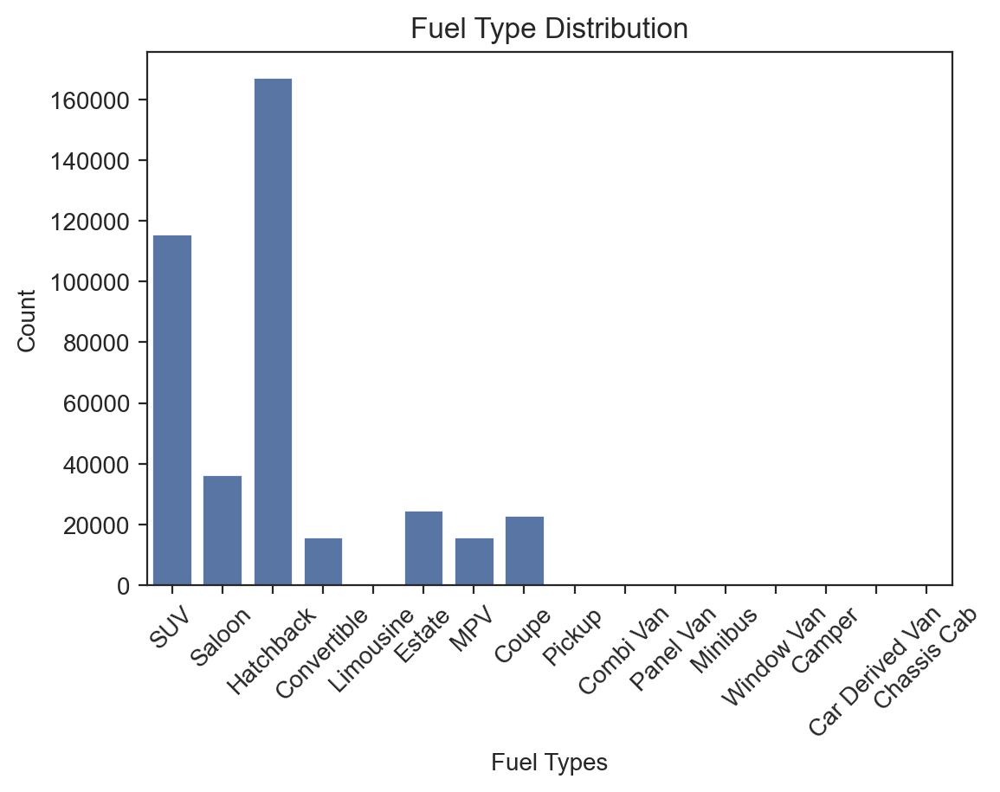

In [190]:
sns.countplot(x="body_type", data=df)
plt.title('Fuel Type Distribution')
plt.xlabel('Fuel Types')
plt.ylabel('Count')
plt.xticks(rotation=45)
# plt.savefig('Figures/Fuel_Type_Distribution.png')
plt.show

In [191]:
top_5_body_type = df['body_type'].value_counts().head(5)
top_5_body_type

body_type
Hatchback    167257
SUV          115730
Saloon        36639
Estate        24689
Coupe         23255
Name: count, dtype: int64

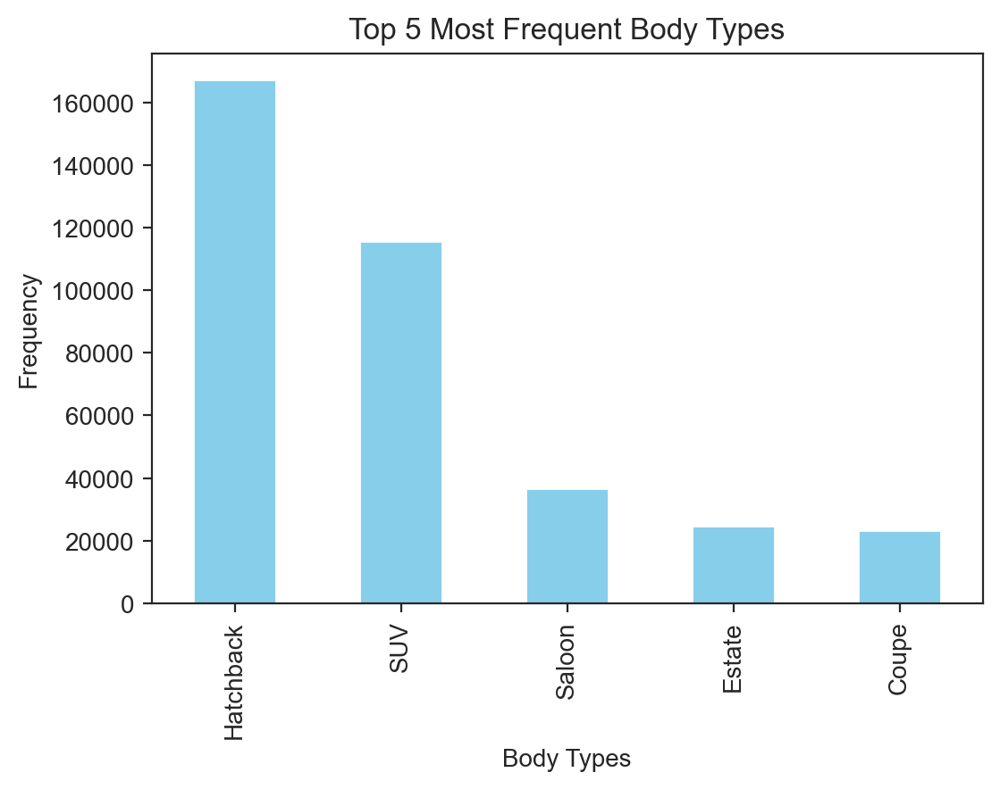

In [192]:
top_5_body_type.plot(kind='bar', color='skyblue')
plt.title('Top 5 Most Frequent Body Types')
plt.xlabel('Body Types')
plt.ylabel('Frequency')
# plt.savefig('Figures/Top_5_body_types.png')
plt.show()

In [193]:
df['body_type'] = df['body_type'].fillna(top_5_body_type.sample(n=1, replace=True).index[0])

In [194]:
df['body_type'].isnull().sum()

0

In [195]:
df['body_type'].value_counts().head(5)

body_type
Hatchback    167257
SUV          116567
Saloon        36639
Estate        24689
Coupe         23255
Name: count, dtype: int64

In [196]:
top_makes_5 = df['body_type'].value_counts().head(5)

# Replace all other body makes with "Others"
df['body_type'] = df['body_type'].apply(lambda x: x if x in top_makes_5 else 'Others')

In [197]:
df['body_type'].value_counts()

body_type
Hatchback    167257
SUV          116567
Saloon        36639
Others        33376
Estate        24689
Coupe         23255
Name: count, dtype: int64

In [198]:
df.isnull().sum()

public_reference             0
mileage                     14
reg_code                 34621
standard_colour              0
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration       376
price                        0
body_type                    0
crossover_car_and_van        0
fuel_type                    0
dtype: int64

#### Outliers and noise in Price

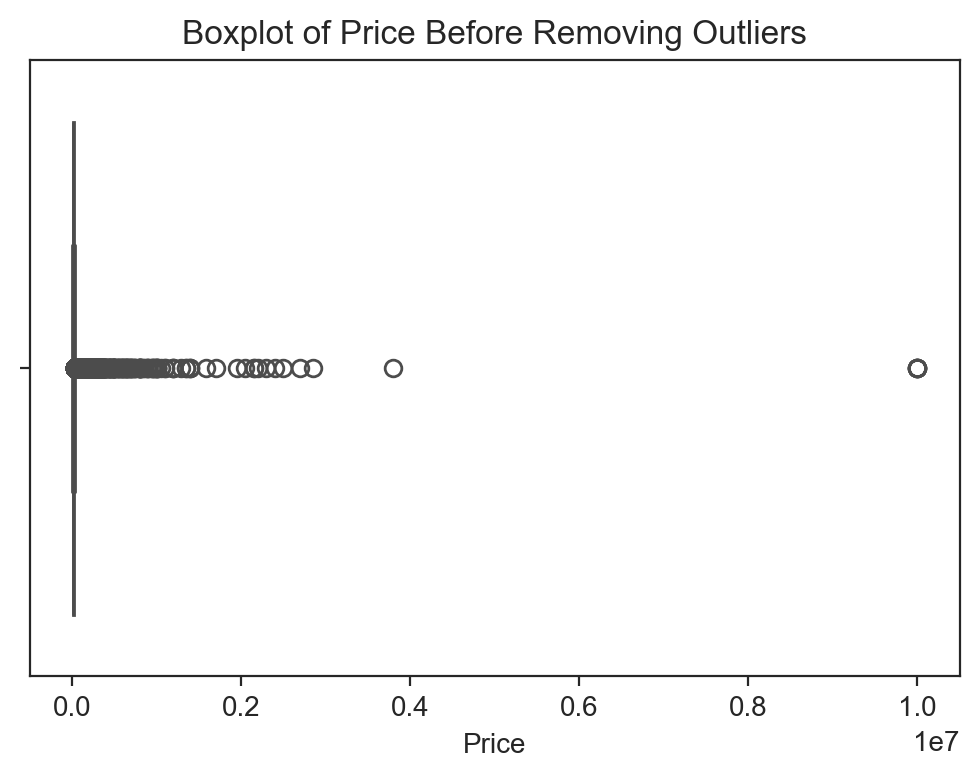

In [202]:
sns.boxplot(x=df['price'])
plt.title('Boxplot of Price Before Removing Outliers')
plt.xlabel('Price')
# plt.savefig('Figures/Price_Before_Removing_Outliers.png')
plt.show()

In [204]:
# Apply IQR method to remove outliers from the price column
Q1_price = df['price'].quantile(0.25)
Q3_price = df['price'].quantile(0.75)
IQR_price = Q3_price - Q1_price

lower_bound_price = Q1_price - 1.5 * IQR_price
upper_bound_price = Q3_price + 1.5 * IQR_price

# Filter out price outliers
df = df[(df['price'] >= lower_bound_price) & (df['price'] <= upper_bound_price)]

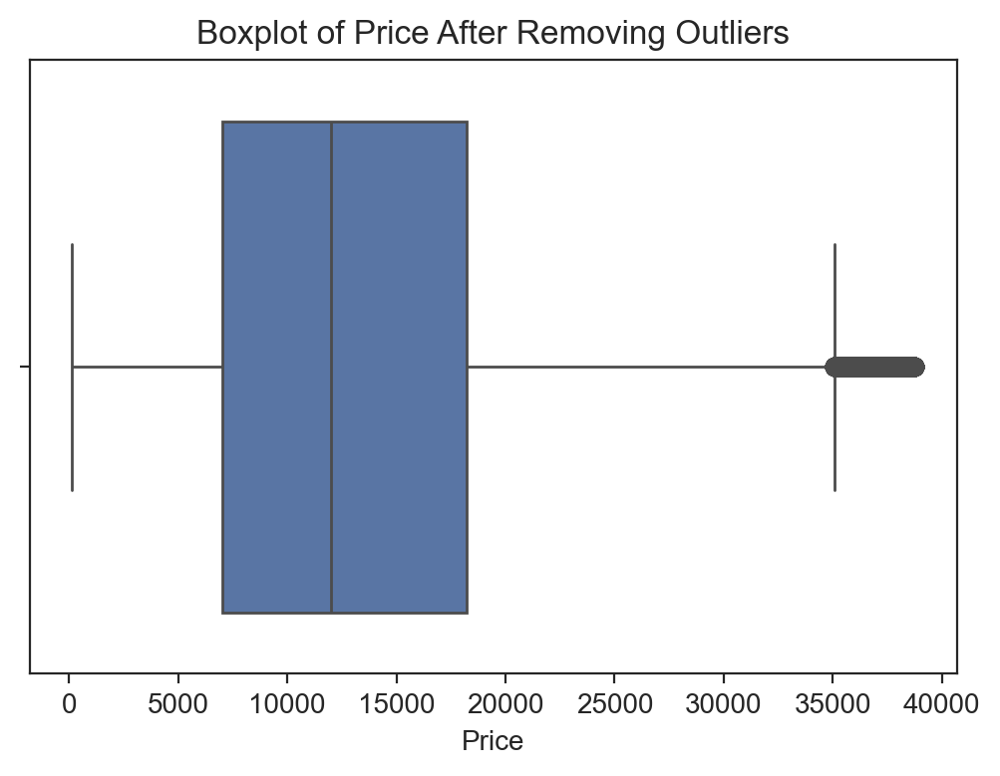

In [206]:
sns.boxplot(x=df['price'])
plt.title('Boxplot of Price After Removing Outliers')
plt.xlabel('Price')
# plt.savefig('Figures/Price_After_Removing_Outliers.png')
plt.show()

In [208]:
df['price'] = df['price'].astype(int)

In [209]:
df.describe()

,public_reference,mileage,reg_code,year_of_registration,price
count,3.755220e+05,375510.000000,349731.000000,375241.000000,375522.000000
mean,2.020073e+14,39715.619480,40.243456,2015.226542,13463.985577
std,1.549033e+10,34972.082924,25.190593,7.703583,8334.872678
min,2.013072e+14,0.000000,2.000000,999.000000,120.000000
25%,2.020090e+14,12692.000000,16.000000,2013.000000,7000.000000
50%,2.020093e+14,30783.500000,53.000000,2016.000000,11990.000000
75%,2.020102e+14,59124.750000,66.000000,2018.000000,18229.000000
max,2.020110e+14,999999.000000,95.000000,2020.000000,38755.000000


#### Outliers and Noise in Mileage

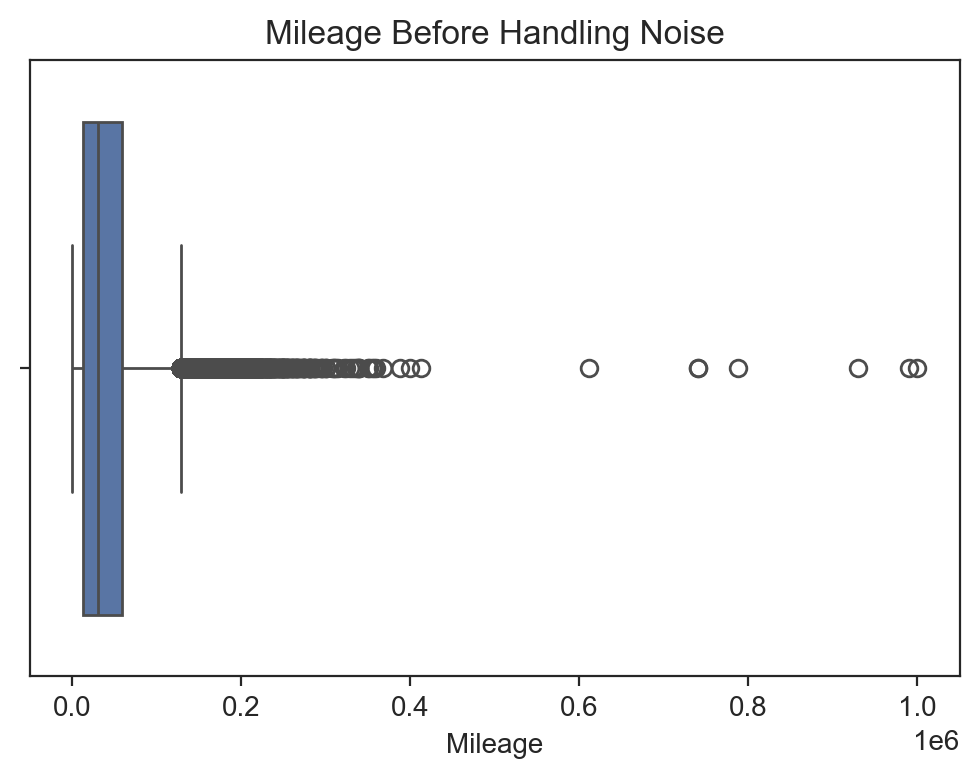

In [215]:
sns.boxplot(x=df['mileage'])
plt.title('Mileage Before Handling Noise')
plt.xlabel('Mileage')
# plt.savefig('Figures/Mileage_Before_Removing_Noise.png')
plt.show()

In [217]:
# Step 2: Handle noise by capping mileage at 300,000
df['mileage'] = np.where(df['mileage'] < 0, 0, df['mileage'])
df['mileage'] = np.where(df['mileage'] > 300000, 300000, df['mileage'])

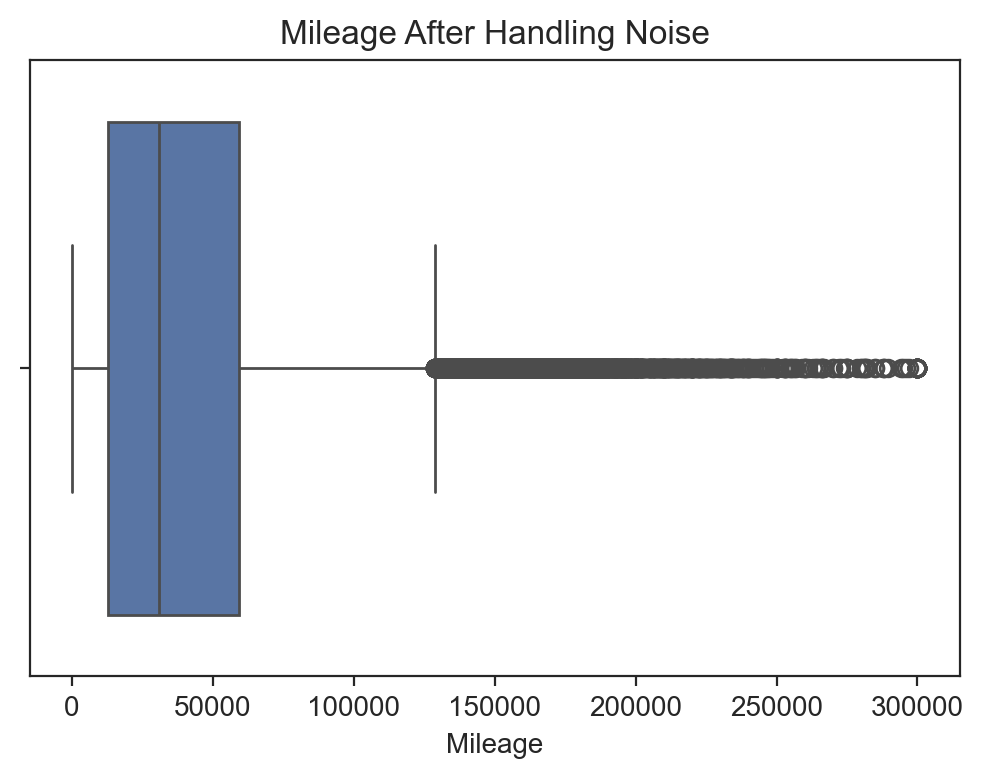

In [218]:
sns.boxplot(x=df['mileage'])
plt.title('Mileage After Handling Noise')
plt.xlabel('Mileage')
# plt.savefig('Figures/Mileage_After_Removing_Noise.png')
plt.show()

In [219]:
df.describe()

,public_reference,mileage,reg_code,year_of_registration,price
count,3.755220e+05,375510.000000,349731.000000,375241.000000,375522.000000
mean,2.020073e+14,39703.117307,40.243456,2015.226542,13463.985577
std,1.549033e+10,34796.872297,25.190593,7.703583,8334.872678
min,2.013072e+14,0.000000,2.000000,999.000000,120.000000
25%,2.020090e+14,12692.000000,16.000000,2013.000000,7000.000000
50%,2.020093e+14,30783.500000,53.000000,2016.000000,11990.000000
75%,2.020102e+14,59124.750000,66.000000,2018.000000,18229.000000
max,2.020110e+14,300000.000000,95.000000,2020.000000,38755.000000


#### Outliers and noise in Year of Registration

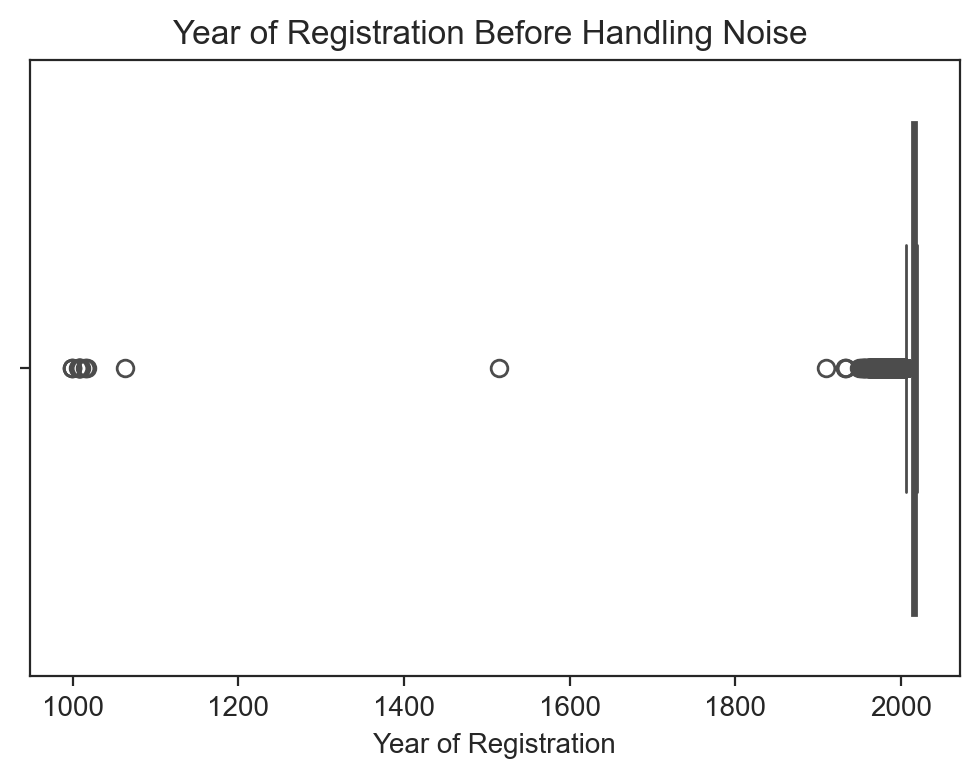

In [221]:
sns.boxplot(x=df['year_of_registration'])
plt.title('Year of Registration Before Handling Noise ')
plt.xlabel('Year of Registration')
# plt.savefig('Figures/Year_of_Registration_before_removing_Noise.png')
plt.show()

In [224]:
# Display all unique years in the dataset for the year_of_registration column
unique_years = df['year_of_registration'].unique()
unique_years.sort()

# Show the sorted list of unique years
unique_years


array([ 999., 1006., 1007., 1008., 1009., 1010., 1015., 1016., 1017.,
       1063., 1515., 1909., 1933., 1934., 1950., 1952., 1954., 1955.,
       1956., 1957., 1958., 1959., 1960., 1961., 1962., 1963., 1964.,
       1965., 1966., 1967., 1968., 1969., 1970., 1971., 1972., 1973.,
       1974., 1975., 1976., 1977., 1978., 1979., 1980., 1981., 1982.,
       1983., 1984., 1985., 1986., 1987., 1988., 1989., 1990., 1991.,
       1992., 1993., 1994., 1995., 1996., 1997., 1998., 1999., 2000.,
       2001., 2002., 2003., 2004., 2005., 2006., 2007., 2008., 2009.,
       2010., 2011., 2012., 2013., 2014., 2015., 2016., 2017., 2018.,
       2019., 2020.,   nan])

In [228]:
df = df[(df['year_of_registration'] >= 1969) & (df['year_of_registration'] <= 2020)]

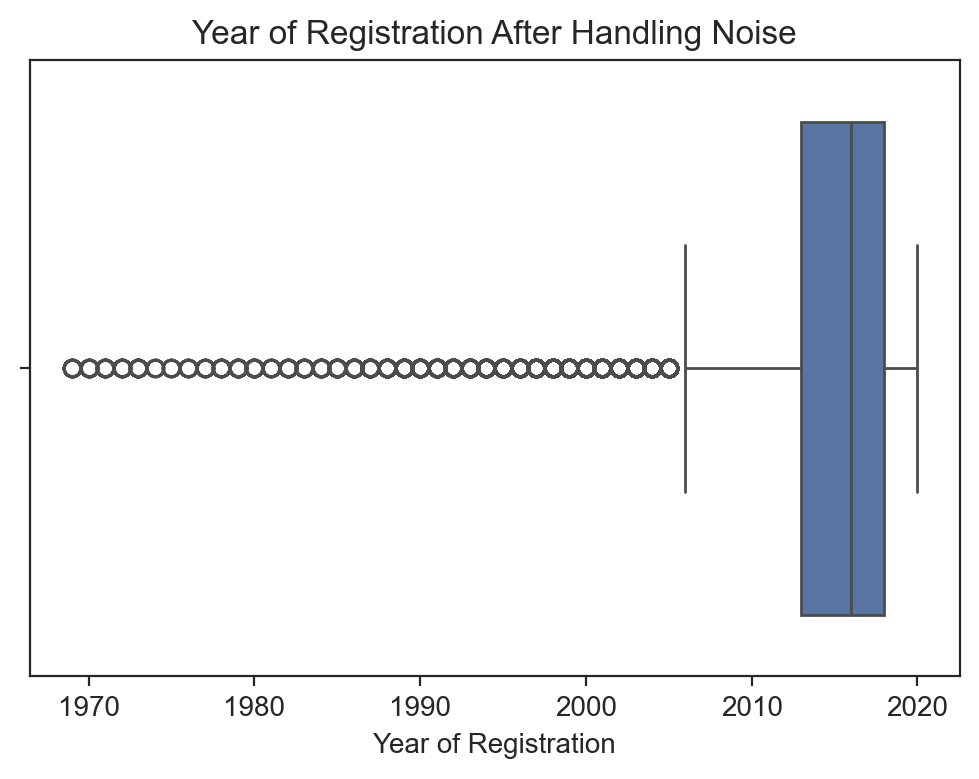

In [231]:
sns.boxplot(x=df['year_of_registration'])
plt.title('Year of Registration After Handling Noise')
plt.xlabel('Year of Registration')
# plt.savefig('Figures/Year_of_Registration_after_removing_Noise.png')
plt.show()

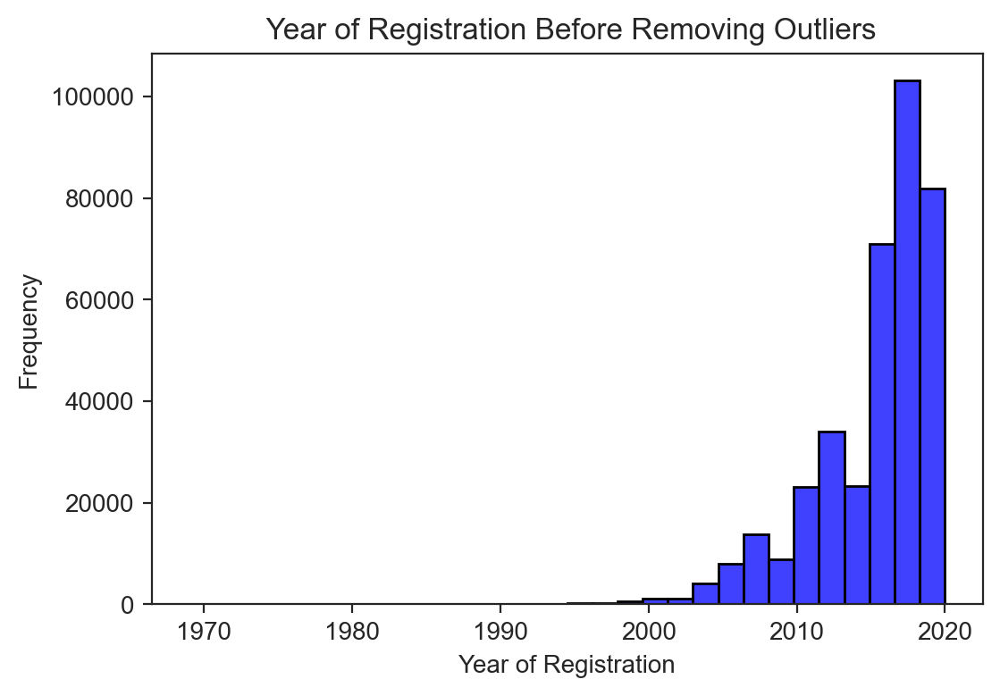

In [232]:
sns.histplot(df['year_of_registration'], bins=30, kde=False, color='blue', edgecolor='black')
plt.title(' Year of Registration Before Removing Outliers')
plt.xlabel('Year of Registration')
plt.ylabel('Frequency')
# plt.savefig('Figures/Year_of_Registration_before_removing_Outliers.png')
plt.show()


In [233]:
df.describe()

,public_reference,mileage,reg_code,year_of_registration,price
count,3.751610e+05,375161.000000,349704.000000,375161.000000,375161.000000
mean,2.020074e+14,39698.193706,40.242734,2015.277278,13463.339241
std,1.547204e+10,34797.242369,25.190069,4.227180,8334.428280
min,2.013072e+14,0.000000,2.000000,1969.000000,120.000000
25%,2.020090e+14,12685.000000,16.000000,2013.000000,7000.000000
50%,2.020093e+14,30770.000000,53.000000,2016.000000,11990.000000
75%,2.020102e+14,59123.000000,66.000000,2018.000000,18229.000000
max,2.020110e+14,300000.000000,70.000000,2020.000000,38755.000000


### 2.2 Feature Engineering, Data Transformations, Feature Selection

#### Creating new Feature Car Age

In [265]:
df['car_age'] = 2020 - df['year_of_registration']

In [267]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,car_age
1,202007020778260,108230.0,61.0,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel,9.0
2,202007020778474,7800.0,17.0,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol,3.0
3,202007080986776,45000.0,16.0,Others,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel,4.0
4,202007161321269,64000.0,64.0,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel,5.0
5,202009304412074,16000.0,17.0,Blue,Audi,S5,USED,2017.0,29000,Others,False,Petrol,3.0


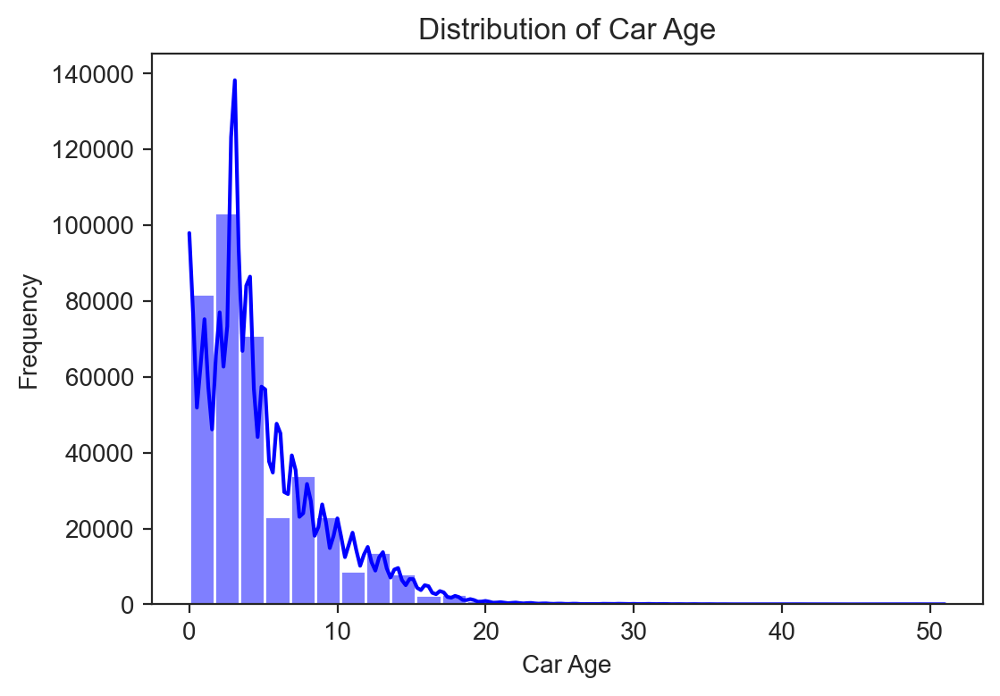

In [269]:
sns.histplot(df['car_age'], bins=30, kde=True, color='blue')
plt.title('Distribution of Car Age')
plt.xlabel('Car Age')
plt.ylabel('Frequency')
# plt.savefig('Figures/Distribution of Car Age.png')
plt.show()

#### Dropping Coloumns

In [271]:
df = df.drop(['public_reference', 'reg_code','year_of_registration','crossover_car_and_van'],axis=1)

In [274]:
df.head()

,mileage,standard_colour,standard_make,standard_model,vehicle_condition,price,body_type,fuel_type,car_age
1,108230.0,Blue,Jaguar,XF,USED,7000,Saloon,Diesel,9.0
2,7800.0,Grey,SKODA,Yeti,USED,14000,SUV,Petrol,3.0
3,45000.0,Others,Vauxhall,Mokka,USED,7995,Hatchback,Diesel,4.0
4,64000.0,Grey,Land Rover,Range Rover Sport,USED,26995,SUV,Diesel,5.0
5,16000.0,Blue,Audi,S5,USED,29000,Others,Petrol,3.0


#### Encoding 

In [329]:
categorical_cols = ['standard_colour', 'standard_make', 'vehicle_condition', 'body_type', 'fuel_type']
categorical_cols

['standard_colour',
 'standard_make',
 'vehicle_condition',
 'body_type',
 'fuel_type']

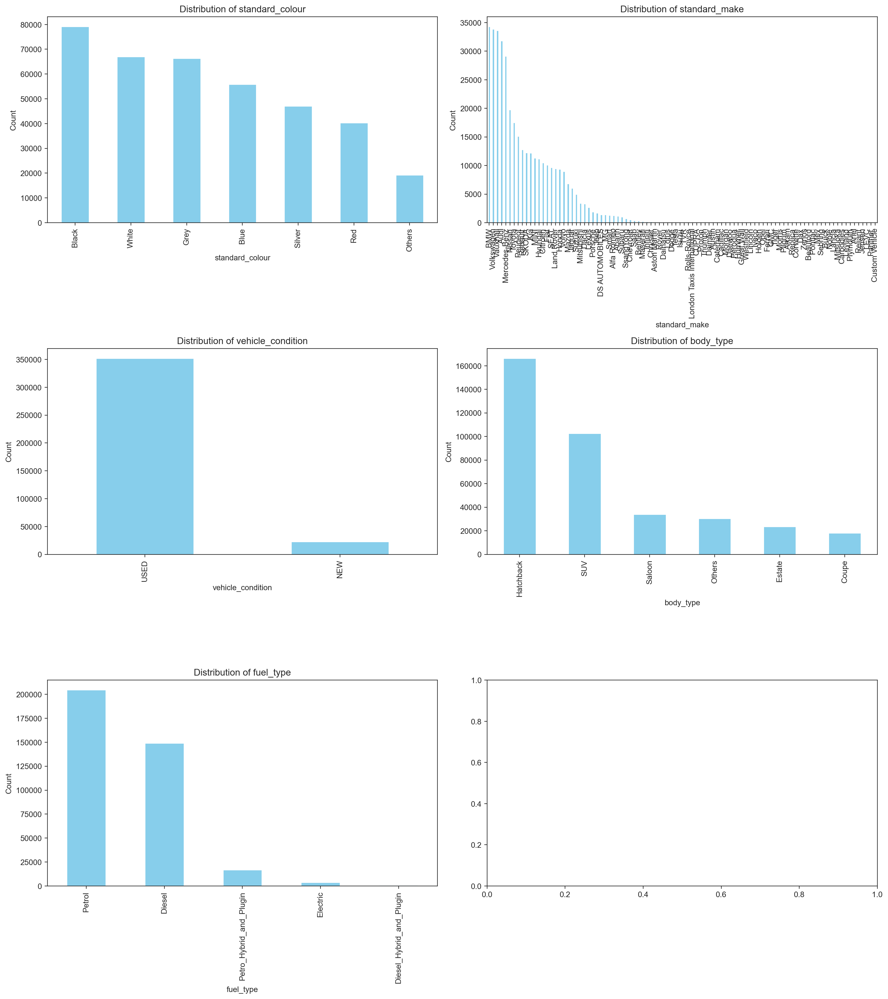

In [331]:
import matplotlib.pyplot as plt

# Visualize the distribution of each categorical column
fig, axes = plt.subplots(3, 2, figsize=(16, 18))  # 3 rows, 2 columns

# Flatten axes array to iterate over
for i, col in enumerate(['standard_colour', 'standard_make' , 'vehicle_condition', 'body_type', 'fuel_type']):
    ax = axes[i // 2, i % 2]  # Access axes without explicit axes array
    df[col].value_counts().plot(kind='bar', ax=ax, color='skyblue')
    ax.set_title(f"Distribution of {col}")
    ax.set_ylabel('Count')
    ax.set_xlabel(col)

plt.tight_layout()
plt.show()


In [333]:
ohe = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

# Step 3: Apply One-Hot Encoding
encoded_data = ohe.fit_transform(df[categorical_cols])

# Step 4: Convert encoded data to a DataFrame
encoded_feature_names = ohe.get_feature_names_out(categorical_cols)
encoded_df = pd.DataFrame(encoded_data, columns=encoded_feature_names)

# Step 5: Reset indices to ensure proper alignment
df.reset_index(drop=True, inplace=True)
encoded_df.reset_index(drop=True, inplace=True)

# Step 6: Concatenate encoded data with the original DataFrame
df_encoded = pd.concat([df, encoded_df], axis=1)

# Step 7: Drop the original categorical columns
df_encoded = df_encoded.drop(columns=categorical_cols)


In [335]:
df_encoded.head()

,mileage,standard_model,price,car_age,standard_colour_Blue,standard_colour_Grey,standard_colour_Others,standard_colour_Red,standard_colour_Silver,standard_colour_White,...,vehicle_condition_USED,body_type_Estate,body_type_Hatchback,body_type_Others,body_type_SUV,body_type_Saloon,fuel_type_Diesel_Hybrid_and_Plugin,fuel_type_Electric,fuel_type_Petro_Hybrid_and_Plugin,fuel_type_Petrol
0,108230.0,XF,7000,9.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,7800.0,Yeti,14000,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,45000.0,Mokka,7995,4.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,64000.0,Range Rover Sport,26995,5.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,16000.0,S5,29000,3.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


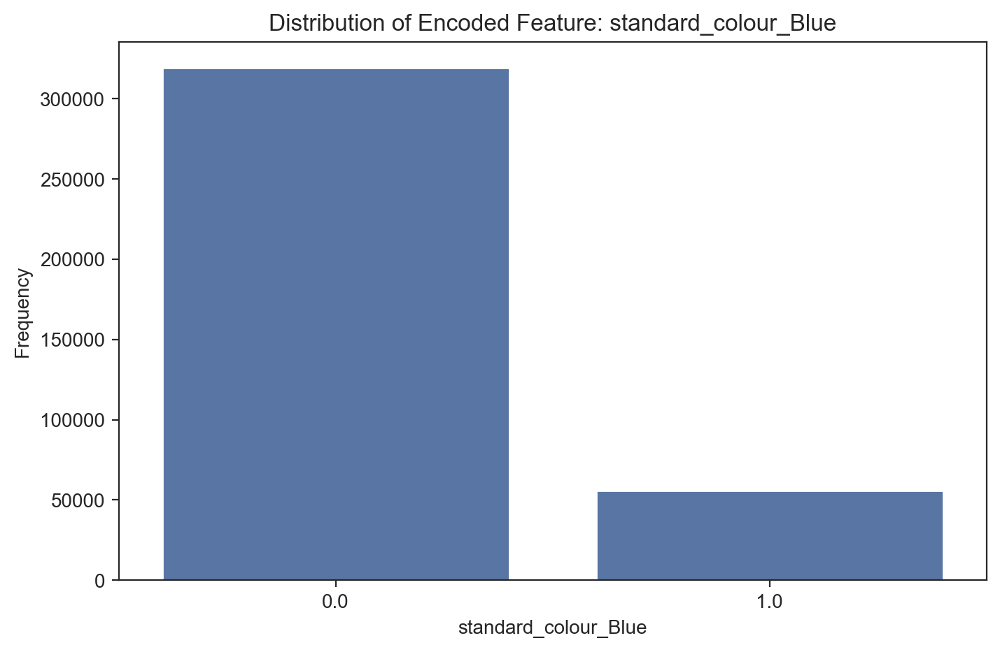

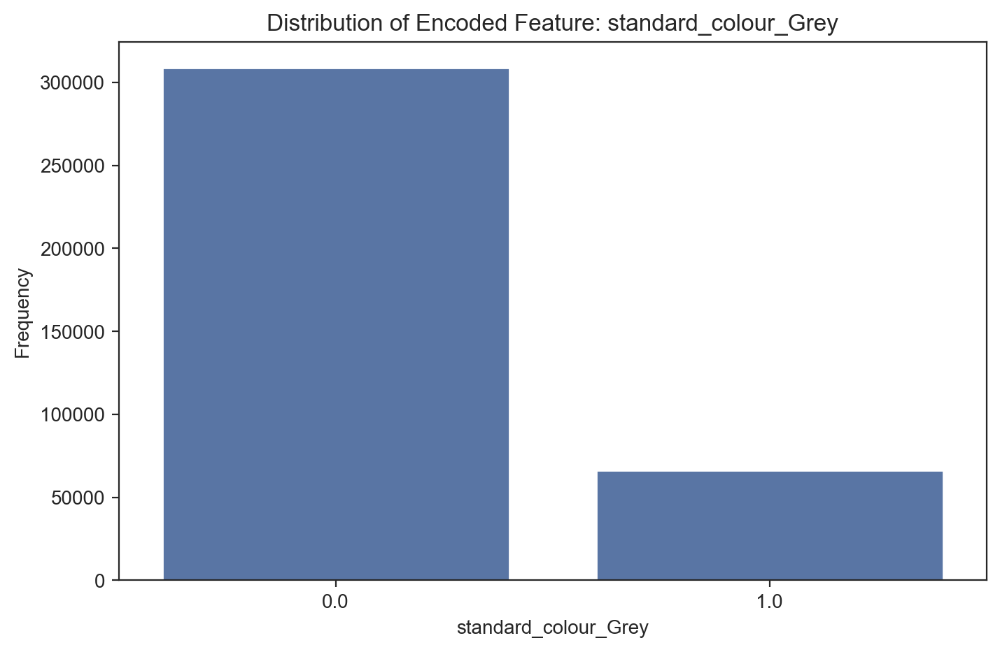

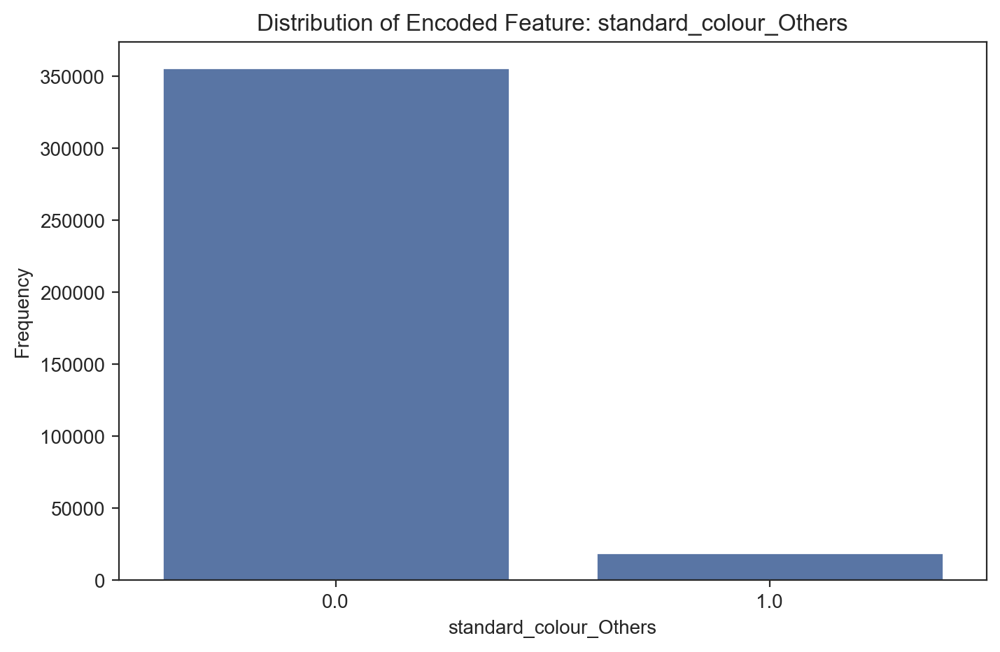

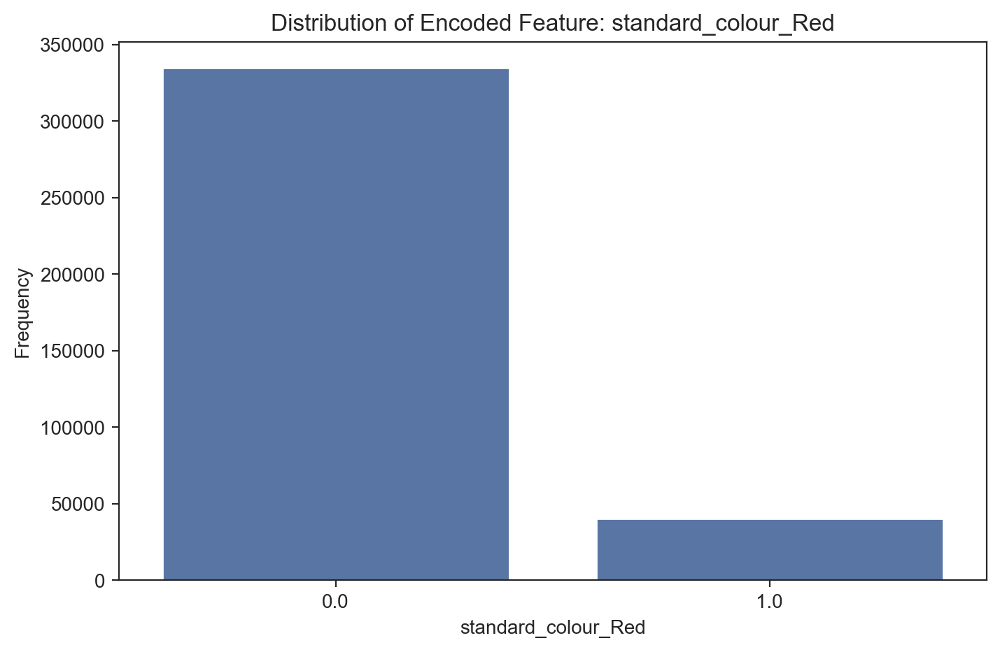

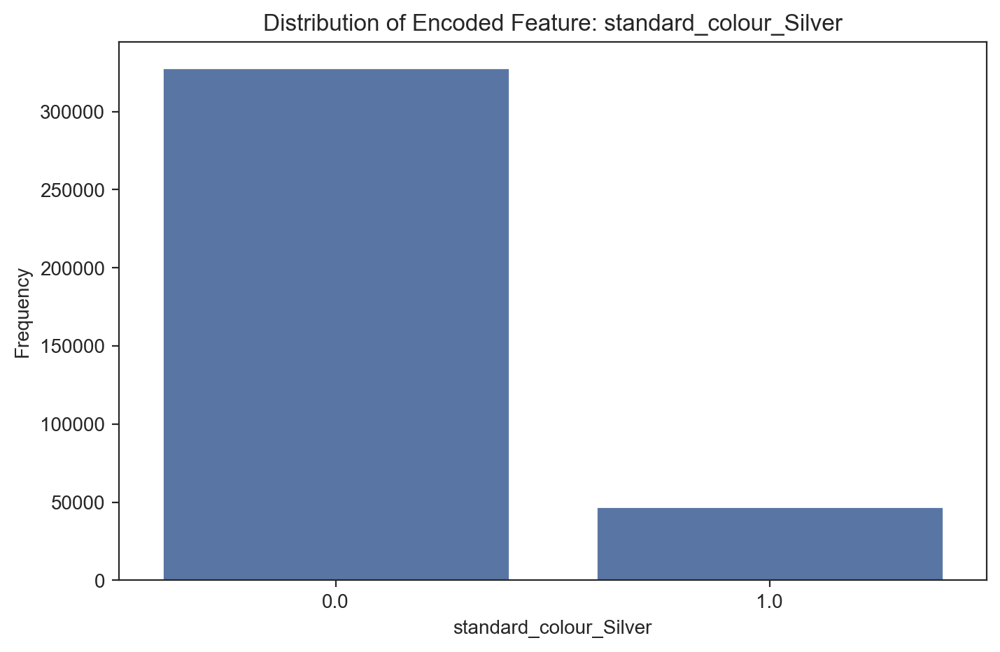

In [409]:
encoded_columns = encoded_df.columns[:5]  # Select the first 5 encoded features for simplicity

for col in encoded_columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=encoded_df[col].value_counts().index, y=encoded_df[col].value_counts().values)
    plt.title(f"Distribution of Encoded Feature: {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    # plt.savefig('Figures/Encoded_Features.png')
    plt.show()

#### Sample Data, Spliting Data, Scalling and Selecting Feature Columns

In [338]:
df_sample = df_encoded.sample(frac=0.4, random_state=42)

In [340]:
df_sample.head()

,mileage,standard_model,price,car_age,standard_colour_Blue,standard_colour_Grey,standard_colour_Others,standard_colour_Red,standard_colour_Silver,standard_colour_White,...,vehicle_condition_USED,body_type_Estate,body_type_Hatchback,body_type_Others,body_type_SUV,body_type_Saloon,fuel_type_Diesel_Hybrid_and_Plugin,fuel_type_Electric,fuel_type_Petro_Hybrid_and_Plugin,fuel_type_Petrol
221348,5000.0,Superb,25250,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
23539,96000.0,Golf,2375,15.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
266231,114782.0,A5,13400,3.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
292314,17581.0,Clio,7150,4.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
326021,11485.0,HR-V,19350,3.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


#### Spliting Data and Scalling data

In [347]:
X = df_sample.drop(columns=['price','standard_model'])  # Features
y = df_sample['price']  #Target 


In [349]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

In [351]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Step 5: Verify the shapes of the splits
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (120051, 111)
X_test shape: (30013, 111)
y_train shape: (120051,)
y_test shape: (30013,)


#### Feature Selection

In [362]:
LR_Model = LinearRegression()
rfe = RFE(estimator=LR_Model, n_features_to_select=20)  # Select top 20 features
rfe.fit(X_train, y_train)

RFE(estimator=LinearRegression(), n_features_to_select=20)

In [364]:
selected_features = X_train.columns[rfe.support_]
print("Selected Features:", selected_features)

Selected Features: Index(['mileage', 'car_age', 'standard_make_Aston Martin',
       'standard_make_Audi', 'standard_make_BMW', 'standard_make_Bentley',
       'standard_make_Dacia', 'standard_make_Fiat', 'standard_make_Jaguar',
       'standard_make_Land Rover', 'standard_make_Maserati',
       'standard_make_Mercedes-Benz', 'standard_make_Porsche',
       'standard_make_Volkswagen', 'standard_make_Volvo',
       'vehicle_condition_USED', 'body_type_Hatchback', 'body_type_SUV',
       'fuel_type_Electric', 'fuel_type_Petro_Hybrid_and_Plugin'],
      dtype='object')


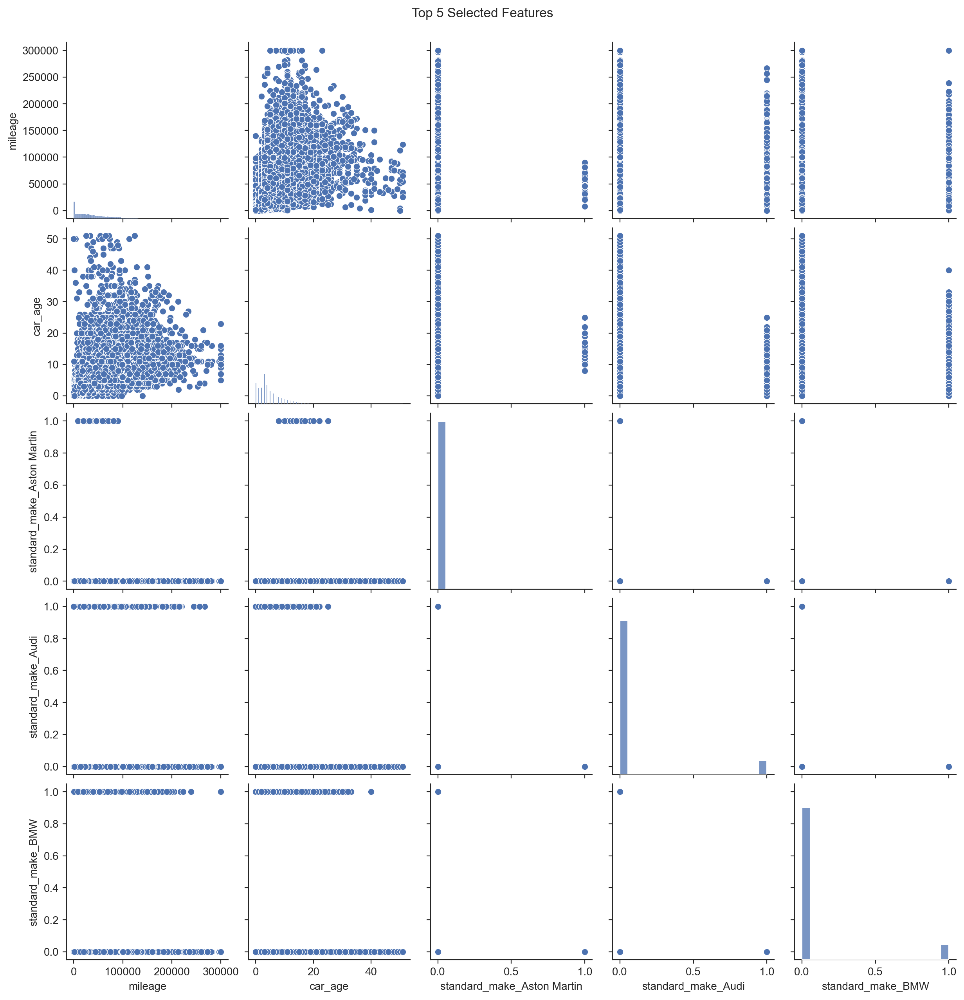

In [419]:
# Pairplot for the selected features
sns.pairplot(X_train[selected_features[:5]])  # Adjust for the top features (e.g., first 5)
plt.suptitle("Top 5 Selected Features", y=1.02)
# plt.savefig('Figures/Top_5_Selected_Features.png')
plt.show()


## 3. Model Building

### 3.1  Algorithm Selection, Model  Instantiation and Configuration

#### KNN

In [460]:
# Step 4: Filter dataset for selected features
X_selected = df_sample[selected_features]

# Step 5: Create a sample of data
X_sample, _, y_sample, _ = train_test_split(X_selected, y, train_size=150000, random_state=42)

# Step 6: Split the sampled data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.3, random_state=42)

In [462]:
# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [515]:
# Initialize the KNN model
knn = KNeighborsRegressor(n_neighbors=5)
# Training the model
knn.fit(X_train_scaled, y_train)

KNeighborsRegressor()

In [517]:
# Predict on the test set
y_pred_knn = knn.predict(X_test_scaled)

# Calculate RMSE and R²
rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))
r2_knn = r2_score(y_test, y_pred_knn)

# Print results
print("KNN Results:")
print(f"  RMSE: {rmse_knn:.2f}")
print(f"  R2 Score: {r2_knn:.2f}")

KNN Results:
  RMSE: 3946.07
  R2 Score: 0.77


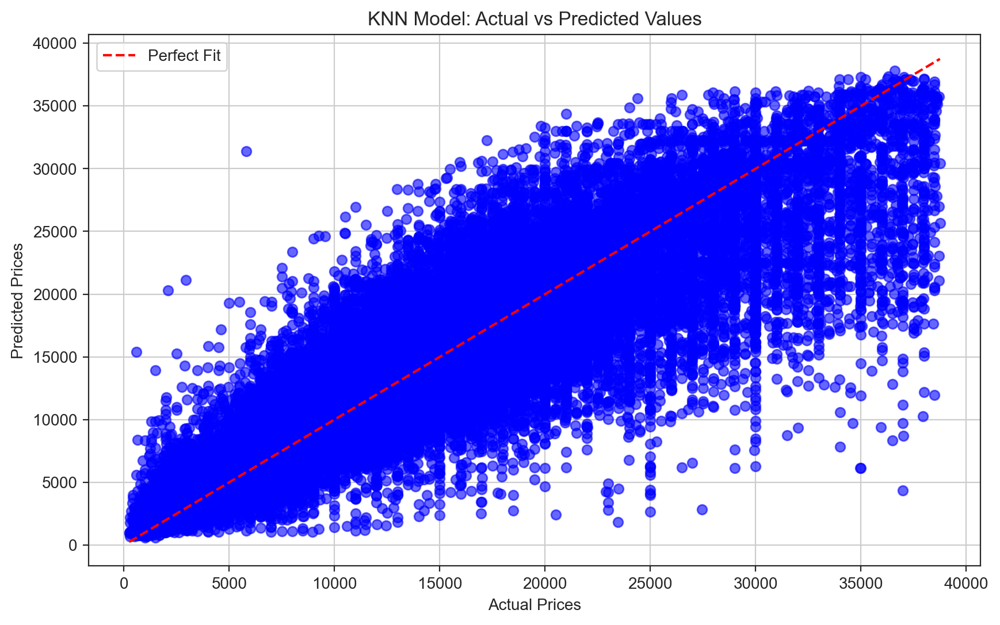

In [519]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_knn, alpha=0.6, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
plt.title('KNN Model: Actual vs Predicted Values')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.legend()
plt.grid(True)
# plt.savefig('Figures/KNN Model.png')
plt.show()

#### Linear Regression

In [478]:
linear_regression = LinearRegression()

# Step 2: Train the model
linear_regression.fit(X_train, y_train)

LinearRegression()

In [480]:
y_pred_lr = linear_regression.predict(X_test)

# Step 4: Calculate RMSE and R²
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred_lr))
r2_lr = r2_score(y_test, y_pred_lr)

# Step 5: Print results
print("Linear Regression Results:")
print(f"  RMSE: {rmse_lr:.2f}")
print(f"  R2 Score: {r2_lr:.2f}")

Linear Regression Results:
  RMSE: 4392.42
  R2 Score: 0.72


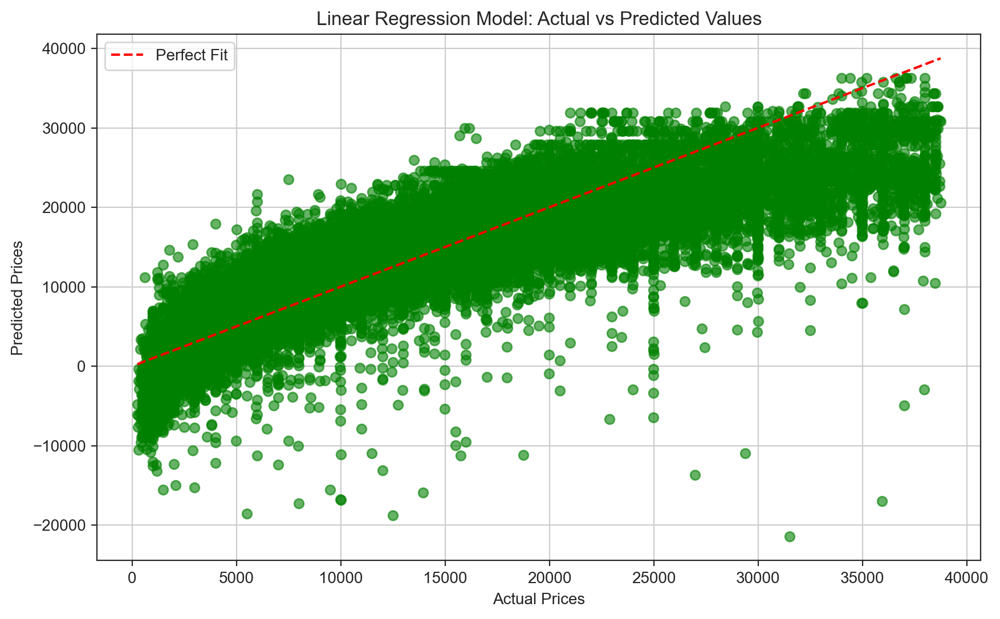

In [507]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_lr, alpha=0.6, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
plt.title('Linear Regression Model: Actual vs Predicted Values')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.legend()
plt.grid(True)
# plt.savefig('Figures/Linear Regression Model.png')
plt.show()

#### Decision Tree

In [491]:
# Step 1: Initialize the Decision Tree model
decision_tree = DecisionTreeRegressor(max_depth=10, random_state=42)

# Step 2: Train the model
decision_tree.fit(X_train, y_train)


DecisionTreeRegressor(max_depth=10, random_state=42)

In [493]:
y_pred_dt = decision_tree.predict(X_test)

# Step 4: Calculate RMSE and R²
rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred_dt))
r2_dt = r2_score(y_test, y_pred_dt)

# Step 5: Print results
print("Decision Tree Results:")
print(f"  RMSE: {rmse_dt:.2f}")
print(f"  R2 Score: {r2_dt:.2f}")

Decision Tree Results:
  RMSE: 4110.94
  R2 Score: 0.75


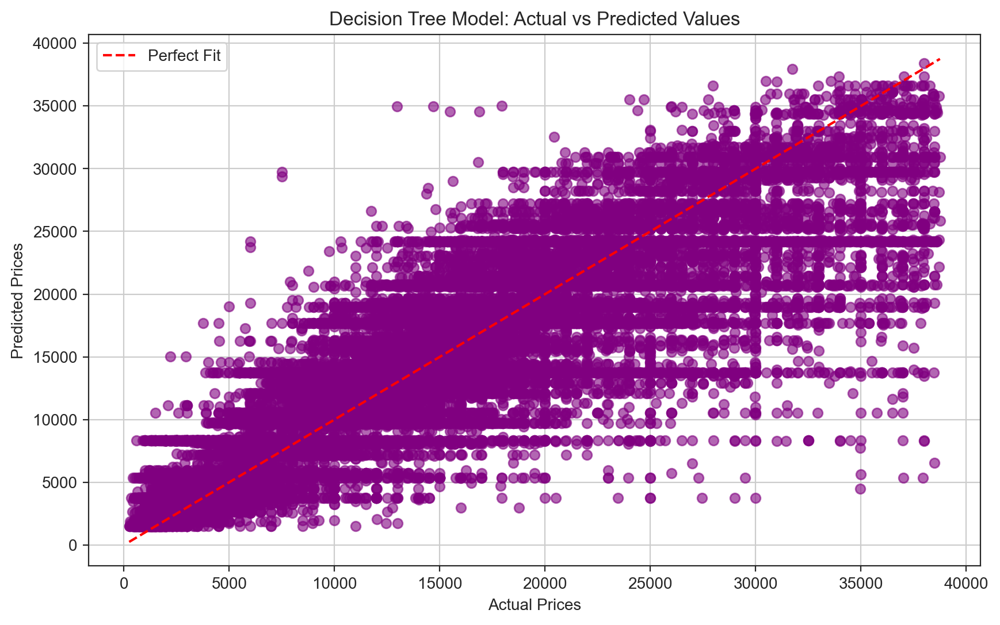

In [509]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_dt, alpha=0.6, color='purple')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Fit')
plt.title('Decision Tree Model: Actual vs Predicted Values')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.legend()
plt.grid(True)
# plt.savefig('Figures/Decision Tree Model.png')
plt.show()

### 3.2 Grid Search, and Model Ranking and  Selection

#### KNN

In [594]:
# Step 1: Grid Search for KNN
knn = KNeighborsRegressor()
knn_params = {'n_neighbors': [3, 5, 7, 9, 11, 15]}
knn_grid = GridSearchCV(knn, knn_params, scoring='neg_mean_squared_error', n_jobs=-1, cv=5)
knn_grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'n_neighbors': [3, 5, 7, 9, 11, 15]},
             scoring='neg_mean_squared_error')

In [596]:
# Best estimator and predictions
knn_best = knn_grid.best_estimator_
knn_pred = knn_best.predict(X_test_scaled)
knn_mse = mean_squared_error(y_test, knn_pred)
knn_rmse = np.sqrt(knn_mse)
knn_r2 = r2_score(y_test, knn_pred)

print("KNN Grid Search Results:")
print(f"Best Parameters: {knn_grid.best_params_}")
print(f"MSE: {knn_mse:.2f}, RMSE: {knn_rmse:.2f}, R²: {knn_r2:.2f}")

KNN Grid Search Results:
Best Parameters: {'n_neighbors': 15}
MSE: 14036252.64, RMSE: 3746.50, R²: 0.80


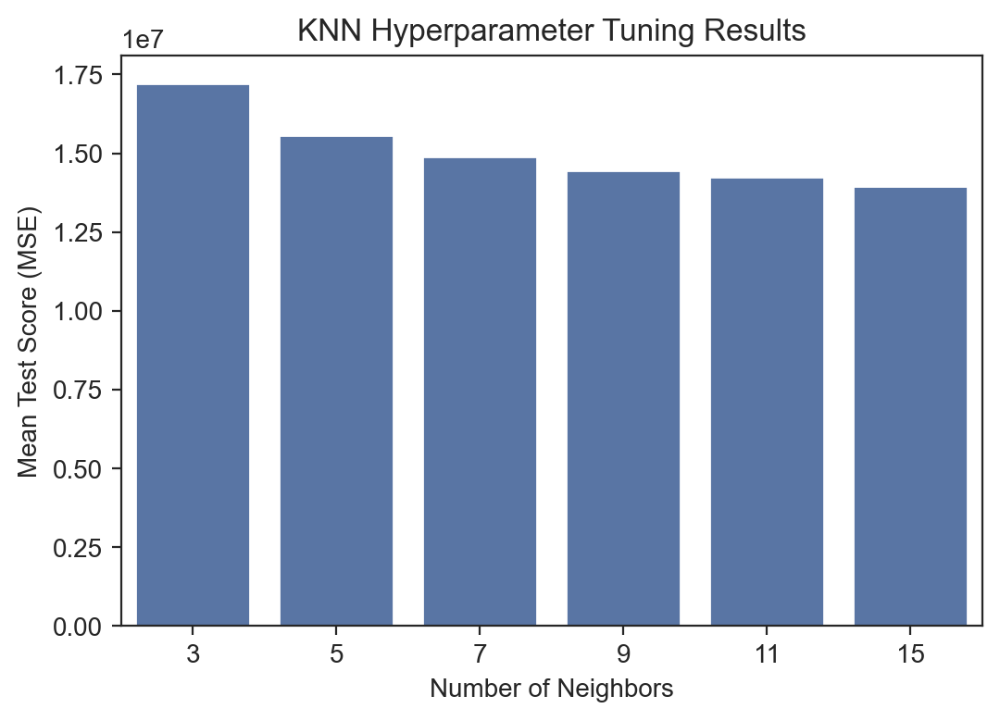

In [620]:
knn_results = pd.DataFrame(knn_grid.cv_results_)

# Convert negative MSE to positive
knn_results['mean_test_score'] = -1 * knn_results['mean_test_score']

sns.barplot(x='param_n_neighbors', y='mean_test_score', data=knn_results)
plt.title("KNN Hyperparameter Tuning Results")
plt.xlabel("Number of Neighbors")
plt.ylabel("Mean Test Score (MSE)")
# plt.savefig('Figures/GridSearch_of_KNN.png')
plt.show()


#### Linear Regression

In [624]:
linear = LinearRegression()
linear.fit(X_train, y_train)

LinearRegression()

In [626]:
linear_pred = linear.predict(X_test)
linear_mse = mean_squared_error(y_test, linear_pred)
linear_rmse = np.sqrt(linear_mse)
linear_r2 = r2_score(y_test, linear_pred)

print("\nLinear Regression Results:")
print(f"MSE: {linear_mse:.2f}, RMSE: {linear_rmse:.2f}, R²: {linear_r2:.2f}")


Linear Regression Results:
MSE: 19293355.23, RMSE: 4392.42, R²: 0.72


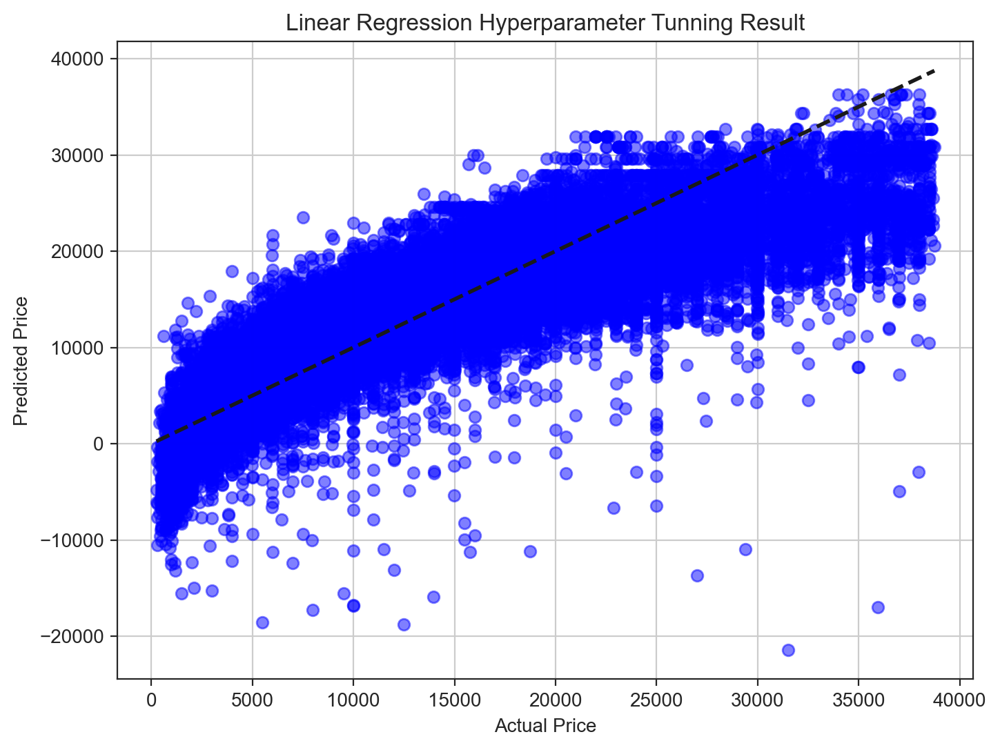

In [632]:
# Linear Regression: Actual vs Predicted Prices Visualization
plt.figure(figsize=(8, 6))
plt.scatter(y_test, linear_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.title("Linear Regression Hyperparameter Tunning Result")
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.grid(True)
# plt.savefig('Figures/GridSearch_LR.png')
plt.show()


#### Decision Tree

In [638]:
tree = DecisionTreeRegressor(random_state=42)
tree_params = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_leaf': [5, 10, 15]
}
tree_grid = GridSearchCV(tree, tree_params, scoring='neg_mean_squared_error', n_jobs=-1, cv=5)
tree_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [5, 10, 15]},
             scoring='neg_mean_squared_error')

In [642]:
# Decision Tree Results
tree_best = tree_grid.best_estimator_
tree_pred = tree_best.predict(X_test)
tree_mse = mean_squared_error(y_test, tree_pred)
tree_rmse = np.sqrt(tree_mse)
tree_r2 = r2_score(y_test, tree_pred)

print("\nDecision Tree Grid Search Results:")
print(f"Best Parameters: {tree_grid.best_params_}")
print(f"MSE: {tree_mse:.2f}, RMSE: {tree_rmse:.2f}, R²: {tree_r2:.2f}")


Decision Tree Grid Search Results:
Best Parameters: {'max_depth': 10, 'min_samples_leaf': 10}
MSE: 16885615.15, RMSE: 4109.21, R²: 0.75


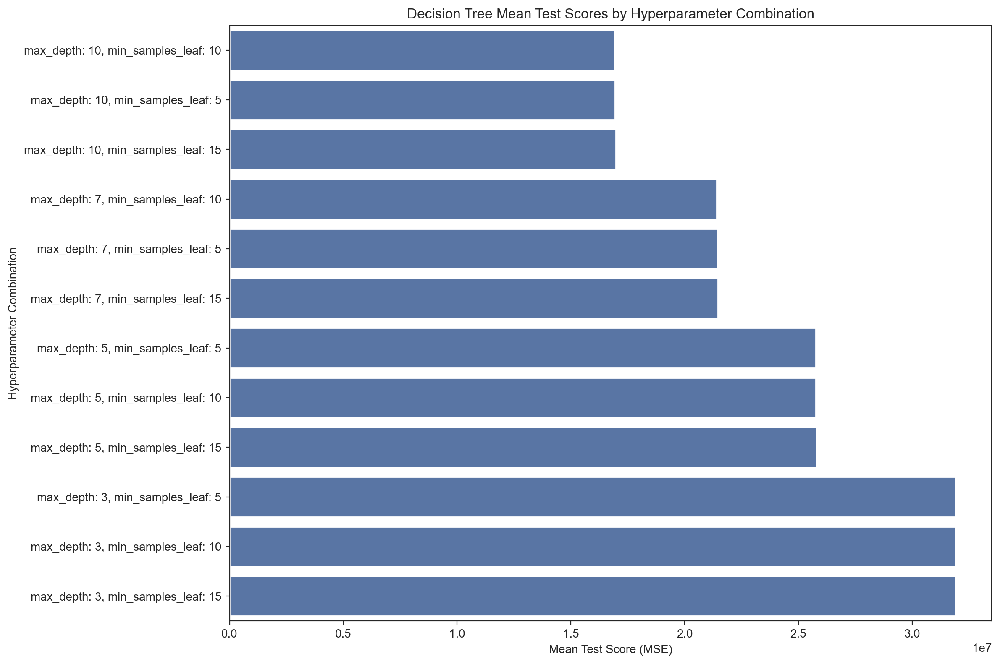

In [654]:
# Create a DataFrame from GridSearchCV results
tree_results = pd.DataFrame(tree_grid.cv_results_)

# Convert the negative mean_test_score back to positive for interpretation
tree_results['mean_test_score'] = -1 * tree_results['mean_test_score']

# Sort the results by mean_test_score
sorted_results = tree_results.sort_values(by='mean_test_score', ascending=True)

# Bar Plot
plt.figure(figsize=(12, 8))
sns.barplot(
    data=sorted_results,
    x='mean_test_score',
    y=['max_depth: ' + str(row['param_max_depth']) + ', min_samples_leaf: ' + str(row['param_min_samples_leaf']) 
       for _, row in sorted_results.iterrows()]
)
plt.title("Decision Tree Mean Test Scores by Hyperparameter Combination")
plt.xlabel("Mean Test Score (MSE)")
plt.ylabel("Hyperparameter Combination")
plt.tight_layout()
# plt.savefig('Figures/GridSearch_of_Decision_Tree.png')
plt.show()


#### Model Ranking

In [670]:
model_results = pd.DataFrame({
    'Model': ['KNN', 'Decision Tree', 'Linear Regression'],
    'Best Parameters': [knn_grid.best_params_, tree_grid.best_params_, 'N/A'],
    'MSE': [knn_mse, tree_mse, linear_mse],
    'RMSE': [knn_rmse, tree_rmse, linear_rmse],
    'R²': [knn_r2, tree_r2, linear_r2]
})

# Print Model Results
print("\nModel Comparison:")
print(model_results)


Model Comparison:
               Model                            Best Parameters           MSE  \
0                KNN                        {'n_neighbors': 15}  1.403625e+07   
1      Decision Tree  {'max_depth': 10, 'min_samples_leaf': 10}  1.688562e+07   
2  Linear Regression                                        N/A  1.929336e+07   

          RMSE        R²  
0  3746.498717  0.795390  
1  4109.211013  0.753854  
2  4392.420202  0.718756  


In [677]:
# Model ranking
eva_results = {
    "Model": ["kNN", "Decision Tree", "Linear Regression"],
    "RMSE": [knn_rmse, tree_rmse, linear_rmse],
    "R²": [knn_r2, tree_r2, linear_r2]
}

# Create a DataFrame
results_df = pd.DataFrame(eva_results)

# Rank based on RMSE (ascending order, lower RMSE is better)
results_df["RMSE Rank"] = results_df["RMSE"].rank(ascending=True)

# Rank based on R² (descending order, higher R² is better)
results_df["R² Rank"] = results_df["R²"].rank(ascending=False)

# Calculate an overall rank (average of RMSE Rank and R² Rank)
results_df["Overall Rank"] = results_df[["RMSE Rank", "R² Rank"]].mean(axis=1).rank(ascending=True)

# Sort by Overall Rank
results_df = results_df.sort_values("Overall Rank")

# Display the ranked models
print("Ranked Models:")
print(results_df)


Ranked Models:
               Model         RMSE        R²  RMSE Rank  R² Rank  Overall Rank
0                kNN  3746.498717  0.795390        1.0      1.0           1.0
1      Decision Tree  4109.211013  0.753854        2.0      2.0           2.0
2  Linear Regression  4392.420202  0.718756        3.0      3.0           3.0


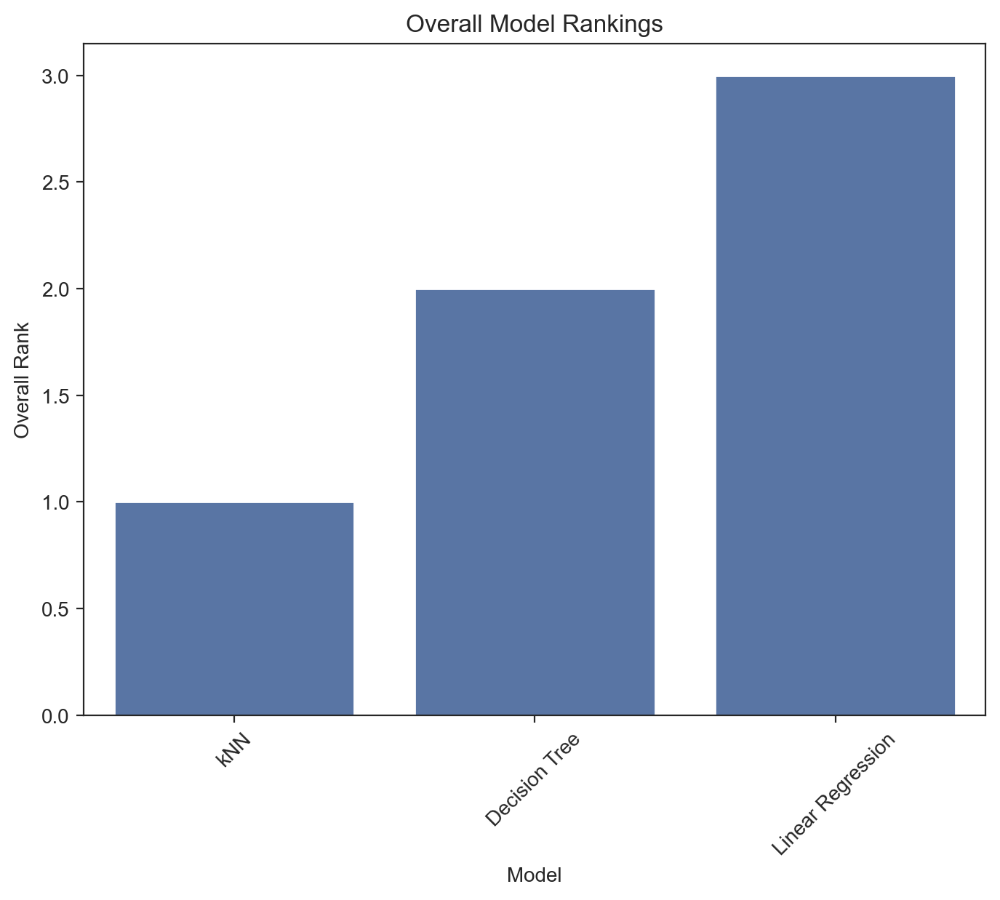

In [727]:
plt.figure(figsize=(8, 6))
sns.barplot(x="Model", y="Overall Rank", data=results_df)
plt.title("Overall Model Rankings")
plt.xlabel("Model")
plt.ylabel("Overall Rank")
plt.xticks(rotation=45)
# plt.savefig('Figures/Overall_Model_Ranking.png')
plt.show()

#### Model Selection

In [741]:
# Get the best model and its parameters
best_model = knn_grid.best_estimator_  # Replace with the respective GridSearchCV object, e.g., knn_grid or tree_grid
best_params = knn_grid.best_params_

# Predictions on the test set
best_model_pred = best_model.predict(X_test_scaled)  # Use X_test_scaled for KNN or X_test for other models

# Calculate evaluation metrics
best_model_mse = mean_squared_error(y_test, best_model_pred)
best_model_rmse = np.sqrt(best_model_mse)
best_model_r2 = r2_score(y_test, best_model_pred)

# Print the results
print("Best Model Configuration:")
print(best_model)
print("\nBest Parameters:")
print(best_params)

print("\nEvaluation Metrics for Best Model:")
print(f"MSE: {best_model_mse:.2f}")
print(f"RMSE: {best_model_rmse:.2f}")
print(f"R² Score: {best_model_r2:.2f}")

Best Model Configuration:
KNeighborsRegressor(n_neighbors=15)

Best Parameters:
{'n_neighbors': 15}

Evaluation Metrics for Best Model:
MSE: 14036252.64
RMSE: 3746.50
R² Score: 0.80


## 4. Model Evaluation and Analysis

#### 4.1 Coarse-Grained Evaluation/Analysis

In [797]:
model_results = pd.DataFrame({
    'Model': ['KNN', 'Decision Tree', 'Linear Regression'],
    'MSE': [knn_mse, tree_mse, linear_mse],
    'RMSE': [knn_rmse, tree_rmse, linear_rmse],
    'R²': [knn_r2, tree_r2, linear_r2]
})
print("\nModel Scores Comparison:")
print(model_results)



Model Scores Comparison:
               Model           MSE         RMSE        R²
0                KNN  1.403625e+07  3746.498717  0.795390
1      Decision Tree  1.688562e+07  4109.211013  0.753854
2  Linear Regression  1.929336e+07  4392.420202  0.718756


In [793]:
# Model results with MSE, RMSE, and R²
model_results = pd.DataFrame({
    'Model': ['KNN', 'Decision Tree', 'Linear Regression'],
    'MSE': [knn_mse, tree_mse, linear_mse],
    'RMSE': [knn_rmse, tree_rmse, linear_rmse],
    'R²': [knn_r2, tree_r2, linear_r2]
})

# Add ranks for RMSE (ascending, lower is better) and R² (descending, higher is better)
model_results['RMSE Rank'] = model_results['RMSE'].rank(ascending=True)
model_results['R² Rank'] = model_results['R²'].rank(ascending=False)

# Calculate Overall Rank (average of RMSE Rank and R² Rank)
model_results['Overall Rank'] = model_results[['RMSE Rank', 'R² Rank']].mean(axis=1)

# Sort by Overall Rank
model_results = model_results.sort_values(by='Overall Rank')

# Prepare detailed model comparison table
model_comparison_table = pd.DataFrame({
    'Model': model_results['Model'],
    'MSE': model_results['MSE'],
    'RMSE': model_results['RMSE'],
    'R²': model_results['R²'],
    'Overall Rank': model_results['Overall Rank']
})

# Display the final table
print("Coarse-Grained Evaluation Table:")
display(model_comparison_table)


Coarse-Grained Evaluation Table:


,Model,MSE,RMSE,R²,Overall Rank
0,KNN,1.403625e+07,3746.498717,0.795390,1.0
1,Decision Tree,1.688562e+07,4109.211013,0.753854,2.0
2,Linear Regression,1.929336e+07,4392.420202,0.718756,3.0


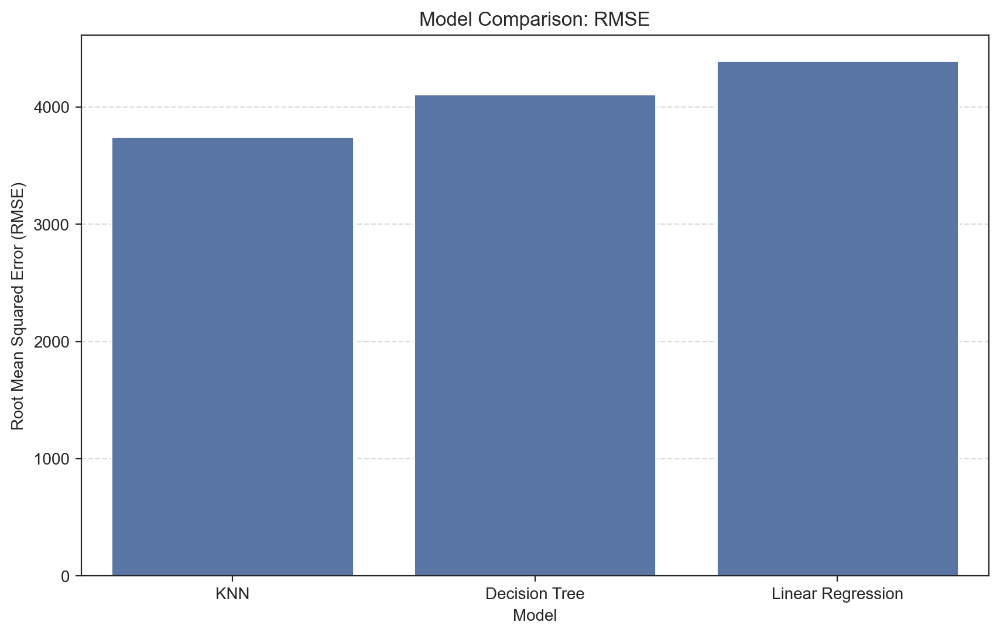

In [816]:
# Visualization for RMSE
plt.figure(figsize=(10, 6))
sns.barplot(
    x='Model', 
    y='RMSE', 
    data=comparison_results
)

# Titles and labels
plt.title("Model Comparison: RMSE")
plt.ylabel("Root Mean Squared Error (RMSE)")
plt.xlabel("Model")
plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.savefig('Figures/Model_Comparison_with_RMSE.png')
plt.show()


C:\Users\Salman\AppData\Local\Temp\ipykernel_8568\2031379347.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


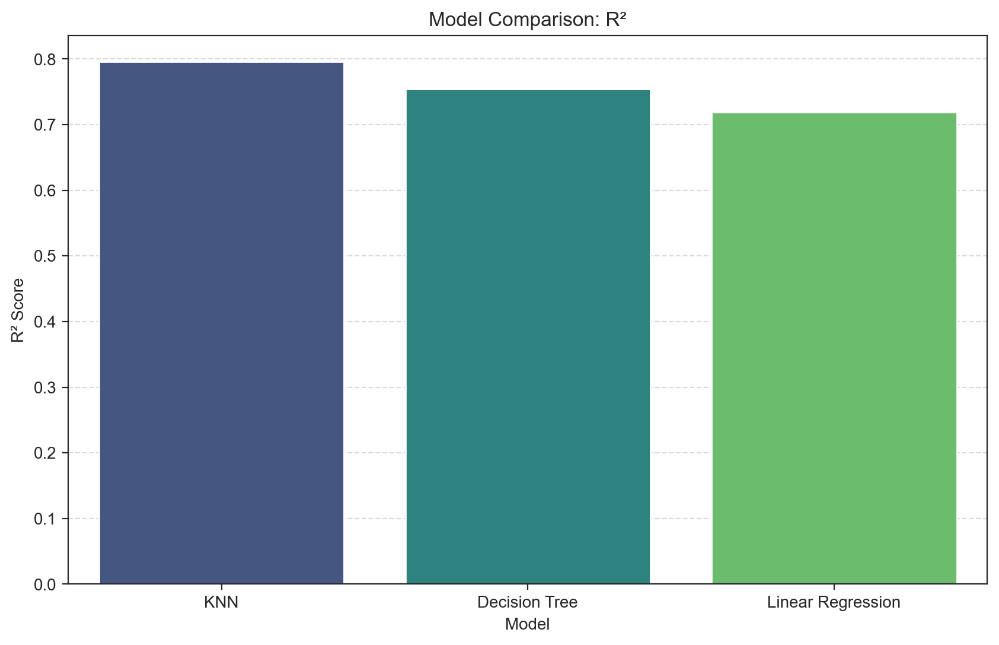

In [818]:
# Visualization for R²
plt.figure(figsize=(10, 6))
sns.barplot(
    x='Model', 
    y='R²', 
    data=comparison_results, 
    palette='viridis'
)

# Titles and labels
plt.title("Model Comparison: R²")
plt.ylabel("R² Score")
plt.xlabel("Model")
plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.savefig('Figures/Model_Comparison_with_R².png')
plt.show()


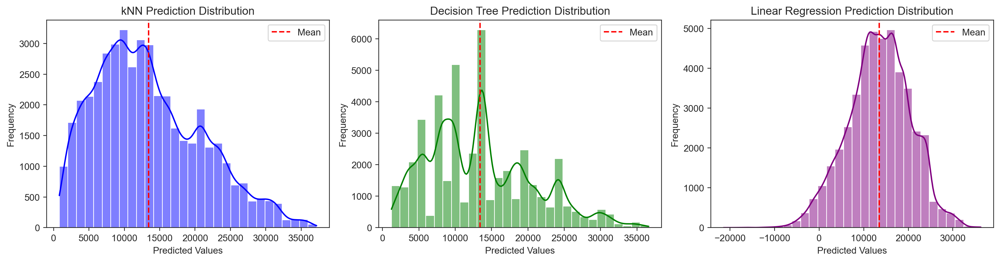

In [820]:
# Visualization of prediction distributions for each model
plt.figure(figsize=(15, 4))

# kNN Prediction Distribution
plt.subplot(1, 3, 1)
sns.histplot(knn_pred, kde=True, color='blue', bins=30)
plt.axvline(x=np.mean(knn_pred), color='red', linestyle='--', label="Mean")
plt.title("kNN Prediction Distribution")
plt.xlabel("Predicted Values")
plt.ylabel("Frequency")
plt.legend()

# Decision Tree Prediction Distribution
plt.subplot(1, 3, 2)
sns.histplot(tree_pred, kde=True, color='green', bins=30)
plt.axvline(x=np.mean(tree_pred), color='red', linestyle='--', label="Mean")
plt.title("Decision Tree Prediction Distribution")
plt.xlabel("Predicted Values")
plt.ylabel("Frequency")
plt.legend()

# Linear Regression Prediction Distribution
plt.subplot(1, 3, 3)
sns.histplot(linear_pred, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(linear_pred), color='red', linestyle='--', label="Mean")
plt.title("Linear Regression Prediction Distribution")
plt.xlabel("Predicted Values")
plt.ylabel("Frequency")
plt.legend()

# Adjust layout
plt.tight_layout()
# plt.savefig('Figures/Model_Prediction_Distribution.png')
plt.show()


### 4.2 Feature Importance 

#### Feature Importance of Decision Tree

In [829]:
# Step 1: Decision Tree Feature Importance
dt_feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': tree_best.feature_importances_
}).sort_values(by='Importance', ascending=False)

print(dt_feature_importance)

                              Feature  Importance
1                             car_age    0.589621
16                body_type_Hatchback    0.135280
9            standard_make_Land Rover    0.048107
11        standard_make_Mercedes-Benz    0.032320
3                  standard_make_Audi    0.032113
4                   standard_make_BMW    0.031338
0                             mileage    0.027588
12              standard_make_Porsche    0.020992
19  fuel_type_Petro_Hybrid_and_Plugin    0.016230
18                 fuel_type_Electric    0.011895
8                standard_make_Jaguar    0.011387
14                standard_make_Volvo    0.008202
13           standard_make_Volkswagen    0.007461
17                      body_type_SUV    0.007335
6                 standard_make_Dacia    0.006564
5               standard_make_Bentley    0.004639
2          standard_make_Aston Martin    0.003226
7                  standard_make_Fiat    0.002931
10             standard_make_Maserati    0.001585


C:\Users\Salman\AppData\Local\Temp\ipykernel_8568\1177844512.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=dt_feature_importance.head(10), palette="viridis")


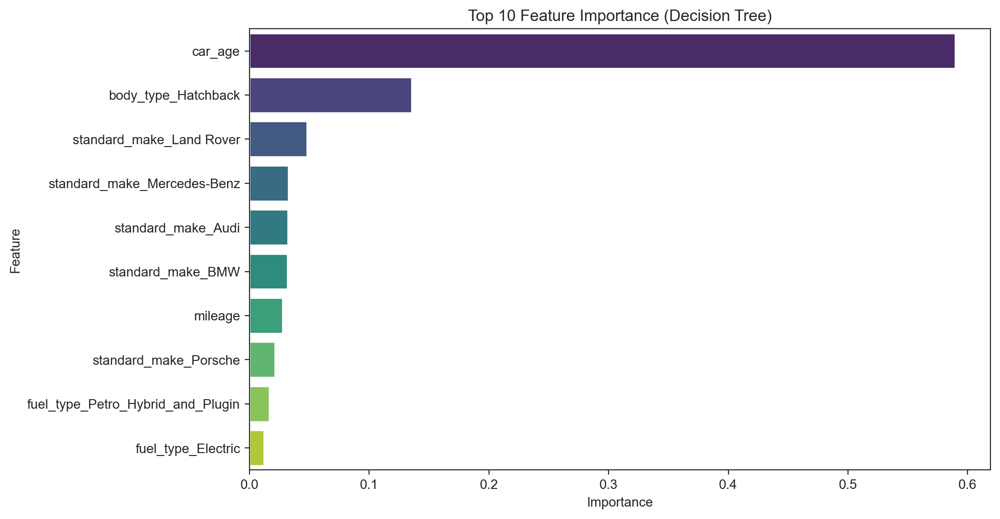

In [834]:
# Visualization of Decision Tree Feature Importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=dt_feature_importance.head(10), palette="viridis")
plt.title("Top 10 Feature Importance (Decision Tree)")
plt.xlabel("Importance")
plt.ylabel("Feature")
# plt.savefig('Figures/Feature_Importance_In_Decision_Tree.png')
plt.show()


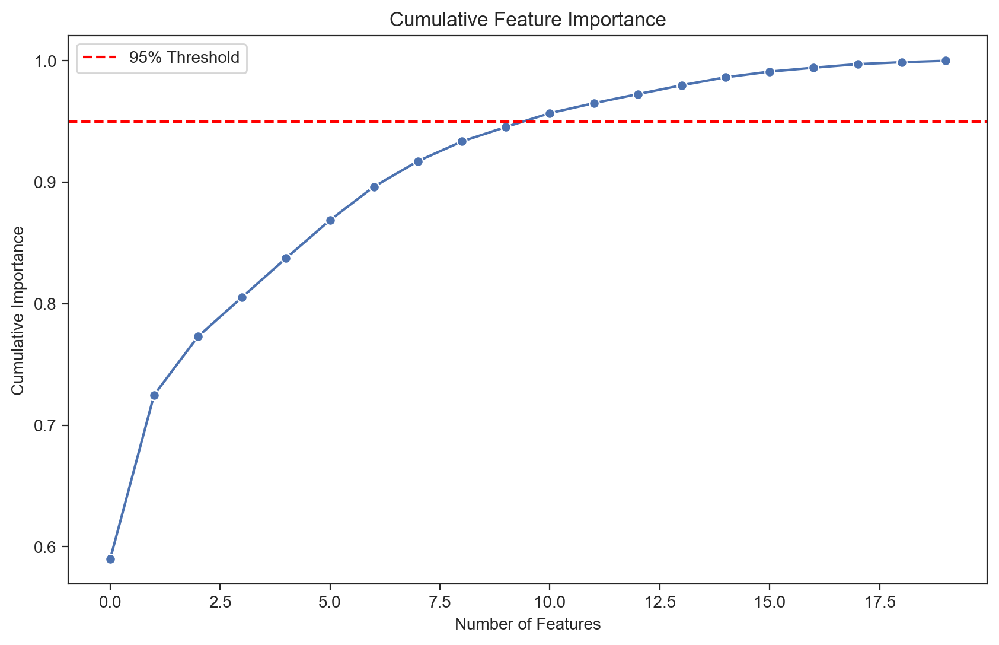

In [896]:
# Calculate cumulative importance (example with Decision Tree)
tree_importance_sorted = feature_importance_df['Decision Tree Importance'].sort_values(ascending=False).reset_index()
tree_importance_sorted['Cumulative Importance'] = tree_importance_sorted['Decision Tree Importance'].cumsum()

# Plot cumulative importance
plt.figure(figsize=(10, 6))
sns.lineplot(data=tree_importance_sorted, x=tree_importance_sorted.index, y='Cumulative Importance', marker='o')
plt.axhline(0.95, color='red', linestyle='--', label='95% Threshold')
plt.title("Cumulative Feature Importance")
plt.xlabel("Number of Features")
plt.ylabel("Cumulative Importance")
plt.legend()
plt.show()


#### Feature Importance of Linear Regression

In [857]:
# Fit Linear Regression model if not already done
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Extract coefficients from the fitted model
coefficients = linear_reg.coef_

# Create a DataFrame to store feature importance
feature_importance_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Coefficient": coefficients
})

# Sort by absolute magnitude of coefficients
feature_importance_df["Abs_Coefficient"] = feature_importance_df["Coefficient"].abs()
feature_importance_df = feature_importance_df.sort_values(by="Abs_Coefficient", ascending=False)

# Print the top features
print("Feature Importance for Linear Regression:")
print(feature_importance_df[["Feature", "Coefficient"]])


Feature Importance for Linear Regression:
                              Feature   Coefficient
2          standard_make_Aston Martin  26594.556770
5               standard_make_Bentley  22219.568296
12              standard_make_Porsche  17793.914346
10             standard_make_Maserati  16714.639962
9            standard_make_Land Rover  11502.801168
8                standard_make_Jaguar   8400.279383
18                 fuel_type_Electric   7665.096376
11        standard_make_Mercedes-Benz   7555.942810
4                   standard_make_BMW   6753.011236
14                standard_make_Volvo   6635.268316
3                  standard_make_Audi   6597.252128
19  fuel_type_Petro_Hybrid_and_Plugin   5370.754035
15             vehicle_condition_USED  -5270.427585
6                 standard_make_Dacia  -5238.371369
13           standard_make_Volkswagen   3604.676167
16                body_type_Hatchback  -3137.297147
7                  standard_make_Fiat  -2545.977618
17                    

C:\Users\Salman\AppData\Local\Temp\ipykernel_8568\4092947629.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Abs_Coefficient", y="Feature", data=feature_importance_df.head(10), palette="viridis")


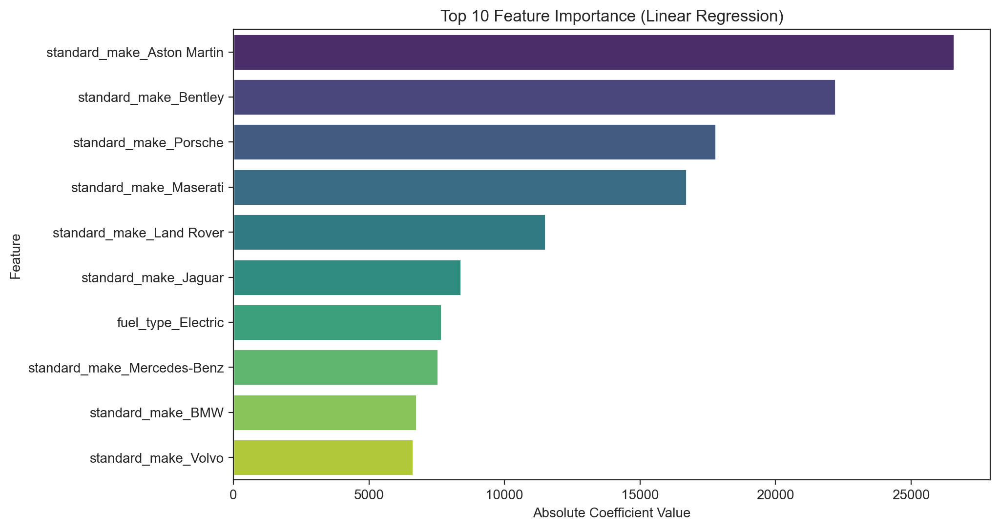

In [861]:
# Visualization of feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x="Abs_Coefficient", y="Feature", data=feature_importance_df.head(10), palette="viridis")
plt.title("Top 10 Feature Importance (Linear Regression)")
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
# plt.savefig('Figures/Feature_Importance_In_Linear_Regression.png')
plt.show()

### 4.3  Fine-Grained Evaluation 

### comparison of predictions, residuals, and actual values

In [942]:
# Create a DataFrame for comparison
comparison_df = pd.DataFrame({
    "Actual Value": y_test,
    "kNN Predicted": knn_pred,
    "kNN Residual": y_test - knn_pred,
    "Decision Tree Predicted": tree_pred,
    "Decision Tree Residual": y_test - tree_pred,
    "Linear Regression Predicted": linear_pred,
    "Linear Regression Residual": y_test - linear_pred
})
comparison_df

,Actual Value,kNN Predicted,kNN Residual,Decision Tree Predicted,Decision Tree Residual,Linear Regression Predicted,Linear Regression Residual
249564,15700,15775.400000,-75.400000,18985.056002,-3285.056002,15317.098227,382.901773
362841,17700,19218.666667,-1518.666667,24187.781729,-6487.781729,18990.527432,-1290.527432
92443,6495,15891.733333,-9396.733333,15288.090909,-8793.090909,12934.996752,-6439.996752
109649,13000,16704.200000,-3704.200000,15920.276224,-2920.276224,17780.145477,-4780.145477
248961,9963,8023.266667,1939.733333,8285.195611,1677.804389,12246.764215,-2283.764215
...,...,...,...,...,...,...,...
362923,2995,3555.200000,-560.200000,11150.686275,-8155.686275,-15251.765465,18246.765465
165510,20688,16104.200000,4583.800000,17677.110196,3010.889804,13671.315071,7016.684929
317325,22991,20851.400000,2139.600000,17677.110196,5313.889804,19278.208929,3712.791071
143410,9988,16586.666667,-6598.666667,20457.600000,-10469.600000,17219.919646,-7231.919646


#### Residual Distribution for kNN

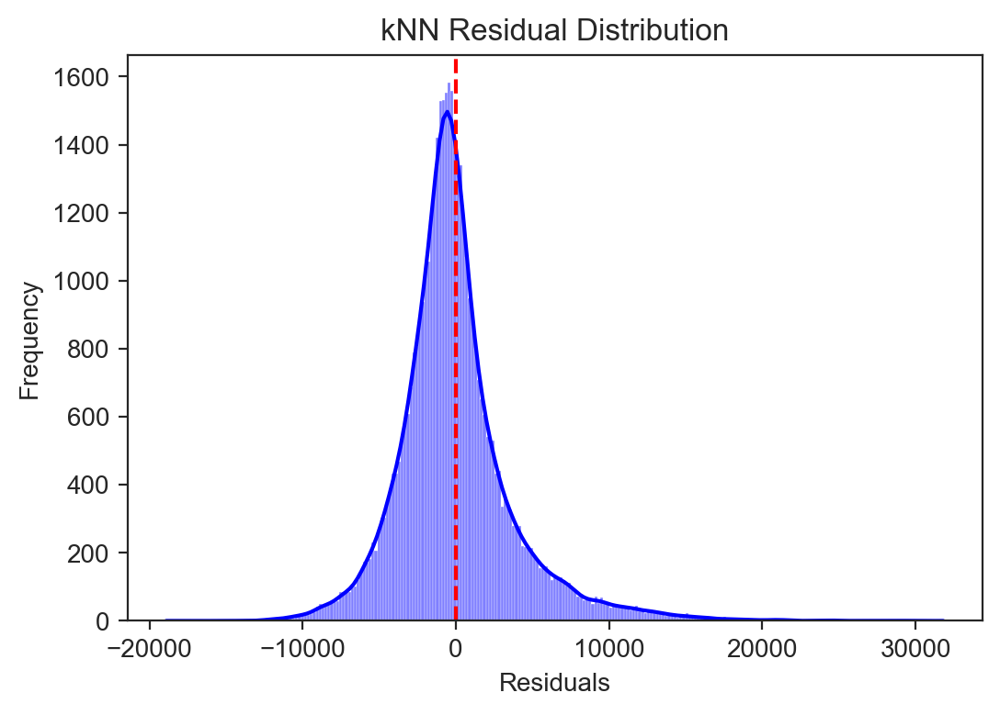

In [965]:
# Calculate residuals for kNN
knn_residuals = y_test - knn_pred

# Plot residual distribution for kNN
plt.figure(figsize=(6, 4))
sns.histplot(knn_residuals, kde=True, color='blue')
plt.axvline(0, color='red', linestyle='--')
plt.title("kNN Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
# plt.savefig('Figures/Residual_of_KNN.png')
plt.show()

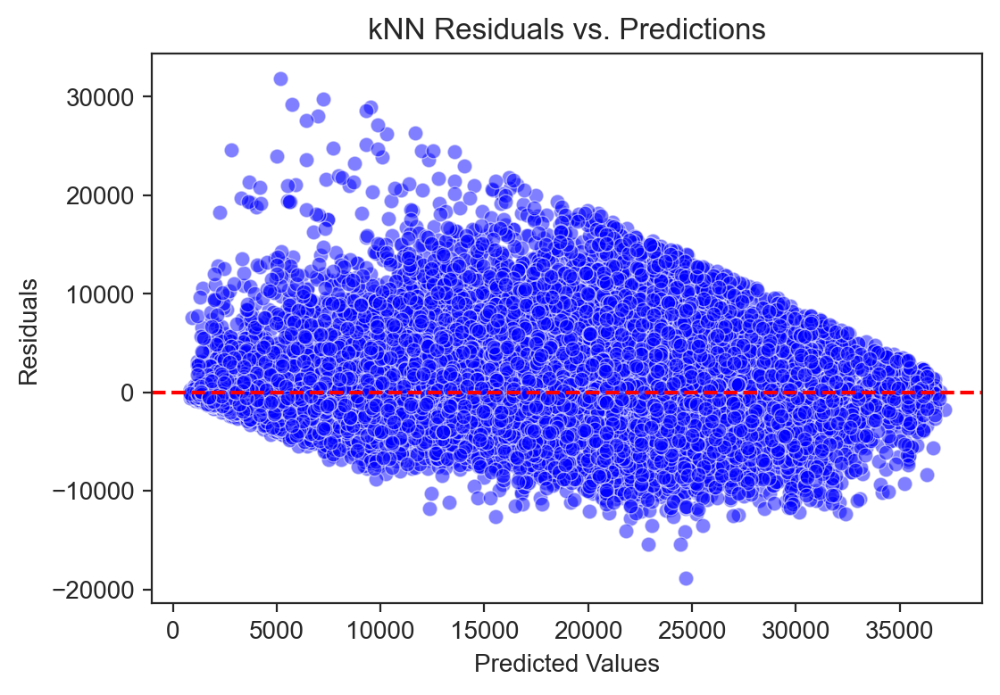

In [967]:
# Plot residuals vs. predictions for kNN
plt.figure(figsize=(6, 4))
sns.scatterplot(x=knn_pred, y=knn_residuals, alpha=0.5, color='blue')
plt.axhline(0, color='red', linestyle='--')
plt.title("kNN Residuals vs. Predictions")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
# plt.savefig('Figures/Residual_VS_Prediction_of_KNN.png')
plt.show()

#### Residual Distribution for Decision Tree

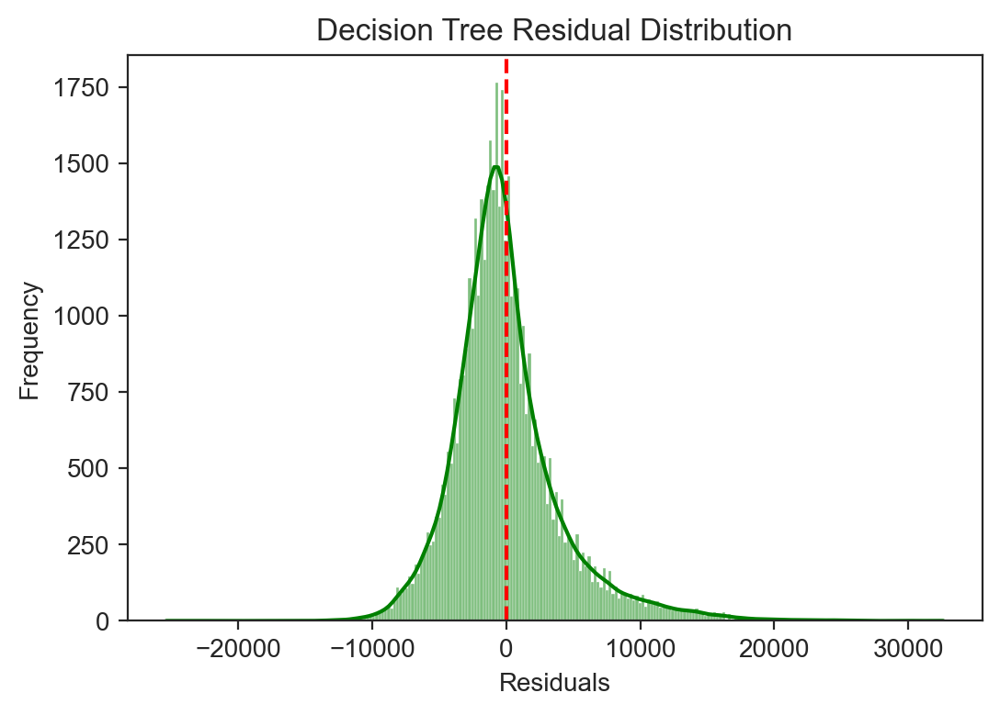

In [969]:
# Calculate residuals for Decision Tree
tree_residuals = y_test - tree_pred

# Plot residual distribution for Decision Tree
plt.figure(figsize=(6, 4))
sns.histplot(tree_residuals, kde=True, color='green')
plt.axvline(0, color='red', linestyle='--')
plt.title("Decision Tree Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
# plt.savefig('Figures/Residual_of_Decision_Tree.png')
plt.show()

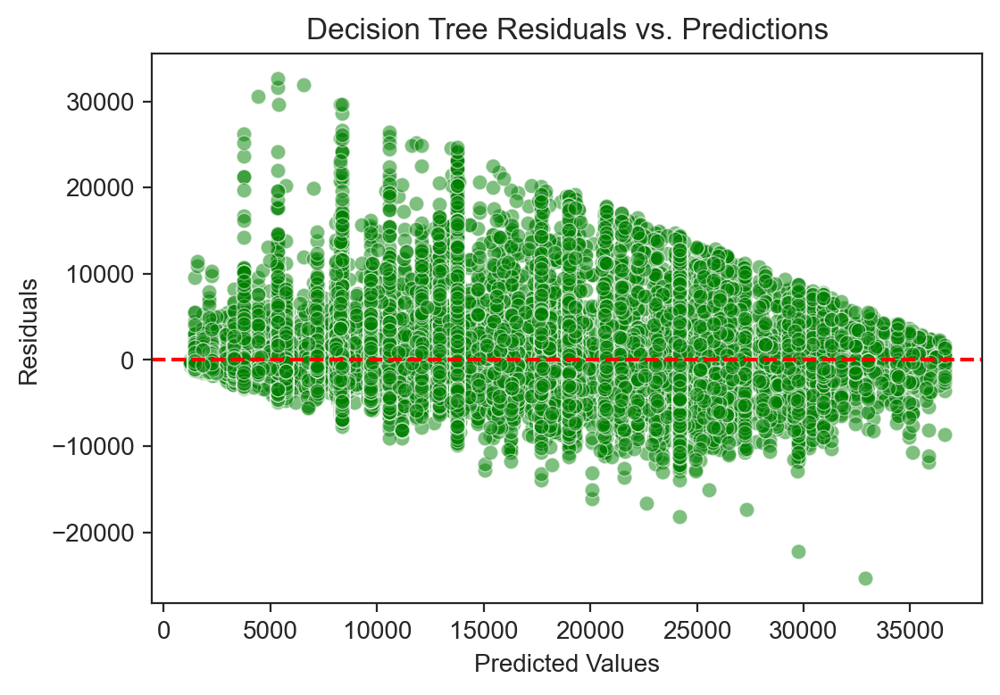

In [971]:
# Plot residuals vs. predictions for Decision Tree
plt.figure(figsize=(6, 4))
sns.scatterplot(x=tree_pred, y=tree_residuals, alpha=0.5, color='green')
plt.axhline(0, color='red', linestyle='--')
plt.title("Decision Tree Residuals vs. Predictions")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
# plt.savefig('Figures/Residual_vs_Predictions_of_Decision_Tree.png')
plt.show()


#### Residual Distribution for Linear Regression

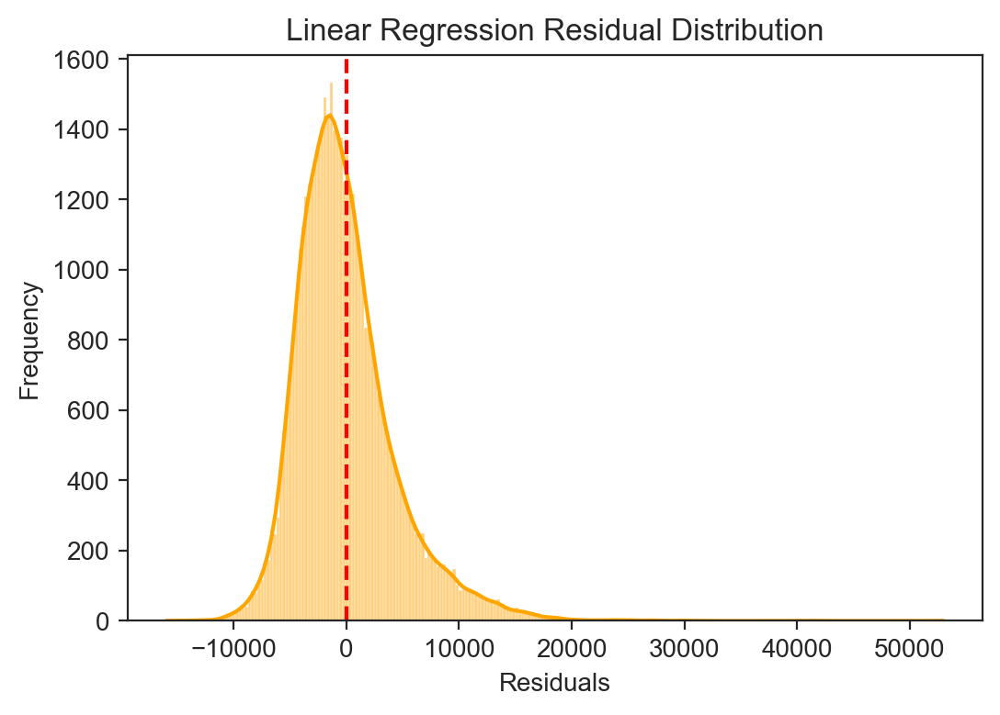

In [973]:
# Calculate residuals for Linear Regression
linear_residuals = y_test - linear_pred

# Plot residual distribution for Linear Regression
plt.figure(figsize=(6, 4))
sns.histplot(linear_residuals, kde=True, color='orange')
plt.axvline(0, color='red', linestyle='--')
plt.title("Linear Regression Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
# plt.savefig('Figures/Residual_of_Linear_Regression.png')
plt.show()

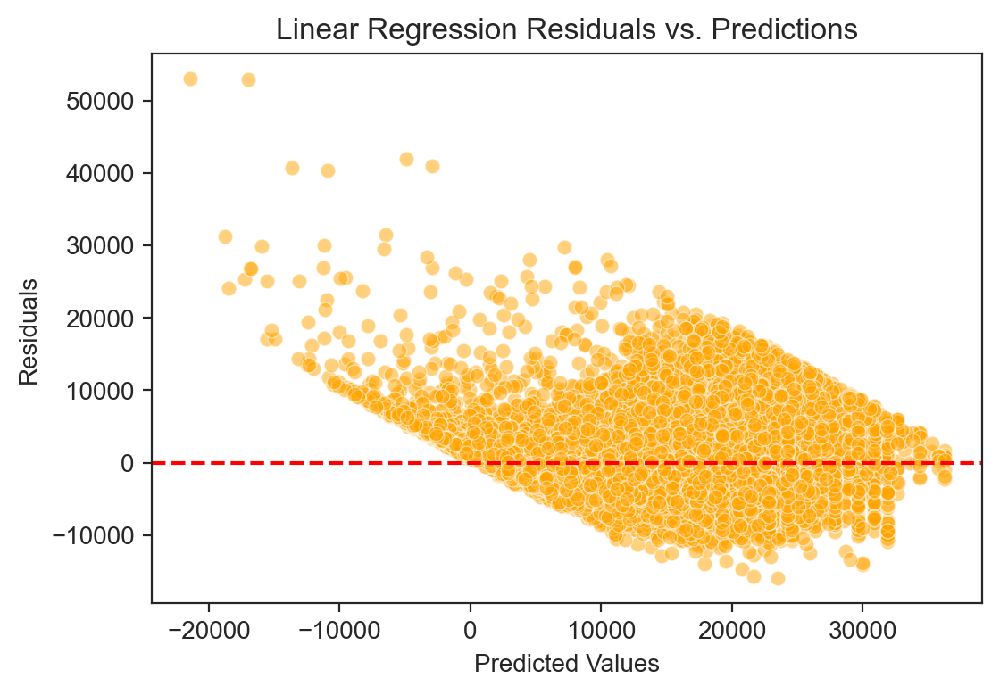

In [975]:
# Plot residuals vs. predictions for Linear Regression
plt.figure(figsize=(6, 4))
sns.scatterplot(x=linear_pred, y=linear_residuals, alpha=0.5, color='orange')
plt.axhline(0, color='red', linestyle='--')
plt.title("Linear Regression Residuals vs. Predictions")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
# plt.savefig('Figures/Residual_vs_Prediction_of_Linear_Regression.png')
plt.show()

### Error Distribution

#### KNN Error Distribution

In [1026]:
# Calculate residuals for kNN
knn_residuals = y_test - knn_pred
absolute_errors_knn = knn_residuals.abs()

# Get the top 6 absolute errors
top_6_knn_errors = absolute_errors_knn.nlargest(6).reset_index()
top_6_knn_errors.columns = ['Index', 'Absolute Error']
top_6_knn_errors

,Index,Absolute Error
0,43449,31813.666667
1,265098,29770.133333
2,185188,29225.000000
3,22243,28967.333333
4,191844,28637.866667
5,38565,28005.333333


C:\Users\Salman\AppData\Local\Temp\ipykernel_8568\3710360665.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


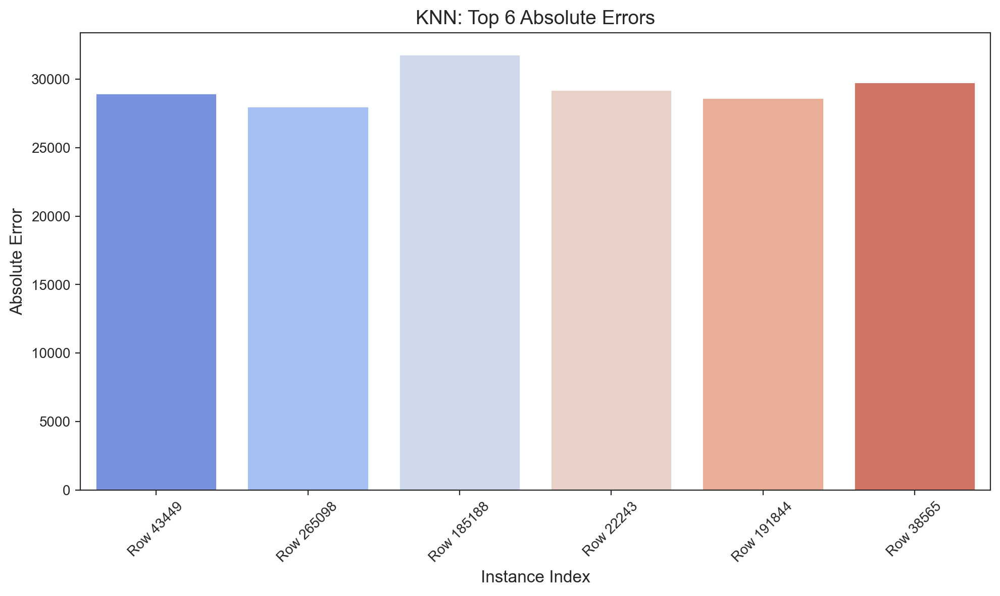

In [1049]:


# Bar Plot: Absolute Errors for Top 6 Instances in kNN
plt.figure(figsize=(10, 6))
sns.barplot(
    x=top_6_knn_errors['Index'],
    y=top_6_knn_errors['Absolute Error'],
    palette='coolwarm'
)
plt.title('KNN: Top 6 Absolute Errors', fontsize=14)
plt.xlabel('Instance Index', fontsize=12)
plt.ylabel('Absolute Error', fontsize=12)
plt.xticks(
    ticks=range(len(top_6_knn_errors['Index'])),
    labels=[f"Row {i}" for i in top_6_knn_errors['Index']],
    rotation=45
)
plt.tight_layout()
# plt.savefig('Figures/Top_6_Instance_Level_Errors_of_KNN.png')
plt.show()


#### Decision Tree Error Distribution

In [1055]:
dt_model = DecisionTreeRegressor(max_depth=4, min_samples_leaf=30, random_state=42)
dt_model.fit(X_train, y_train)

# Make predictions on the test set
dt_pred = dt_model.predict(X_test)
# Calculate residuals for Decision Tree
dt_residuals = y_test - dt_pred
absolute_errors_dt = dt_residuals.abs()

# Get the top 6 absolute errors
top_6_dt_errors = absolute_errors_dt.nlargest(6).reset_index()
top_6_dt_errors.columns = ['Index', 'Absolute Error']
top_6_dt_errors

,Index,Absolute Error
0,22243,32531.140511
1,191844,31991.140511
2,313576,31952.140511
3,175598,31941.140511
4,265098,31040.140511
5,170242,31036.140511


C:\Users\Salman\AppData\Local\Temp\ipykernel_8568\1614816736.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


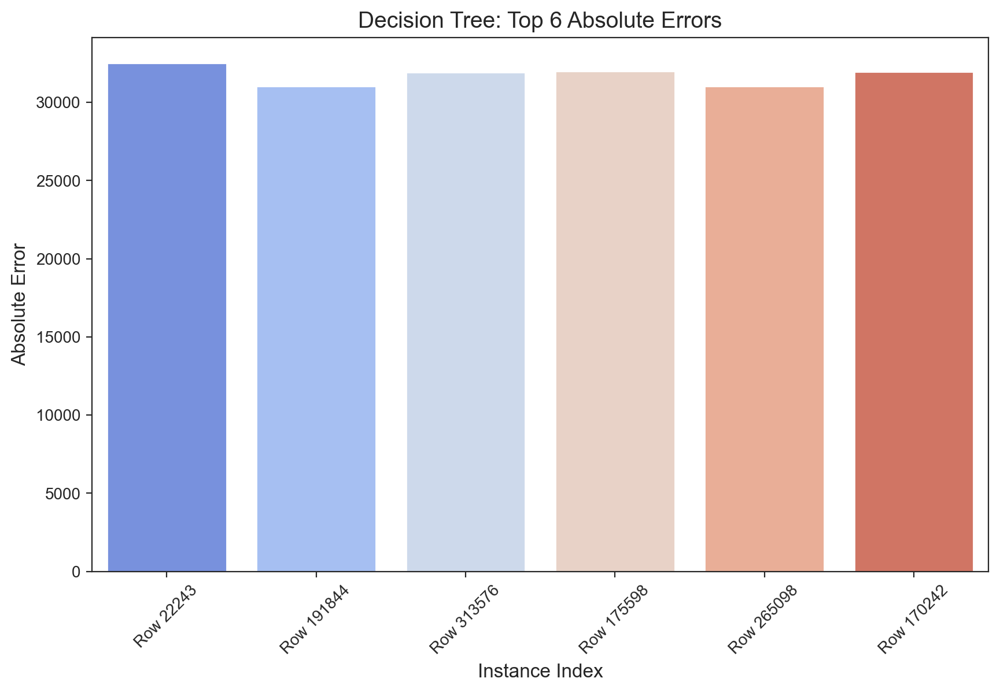

In [1059]:
# Bar Plot: Absolute Errors for Top 6 Instances in Decision Tree
plt.figure(figsize=(10, 6))
sns.barplot(
    x=top_6_dt_errors['Index'],
    y=top_6_dt_errors['Absolute Error'],
    palette='coolwarm'
)
plt.title('Decision Tree: Top 6 Absolute Errors', fontsize=14)
plt.xlabel('Instance Index', fontsize=12)
plt.ylabel('Absolute Error', fontsize=12)
plt.xticks(
    ticks=range(len(top_6_dt_errors['Index'])),
    labels=[f"Row {i}" for i in top_6_dt_errors['Index']],
    rotation=45
)
plt.tight_layout
# plt.savefig('Figures/Top_6_Instance_Level_Errors_of_Decision_Tree.png')
plt.show()

#### Linear Regression Error Distribution

In [1043]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Make predictions on the test set
lr_pred = linear_model.predict(X_test)
# Calculate residuals for Linear Regression
lr_residuals = y_test - lr_pred
absolute_errors_lr = lr_residuals.abs()

# Get the top 6 absolute errors
top_6_lr_errors = absolute_errors_lr.nlargest(6).reset_index()
top_6_lr_errors.columns = ['Index', 'Absolute Error']
top_6_lr_errors

,Index,Absolute Error
0,152528,52962.021357
1,96539,52928.735458
2,265098,41940.133465
3,191844,40908.986163
4,88891,40661.038171
5,338194,40340.602543


C:\Users\Salman\AppData\Local\Temp\ipykernel_8568\4276700554.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


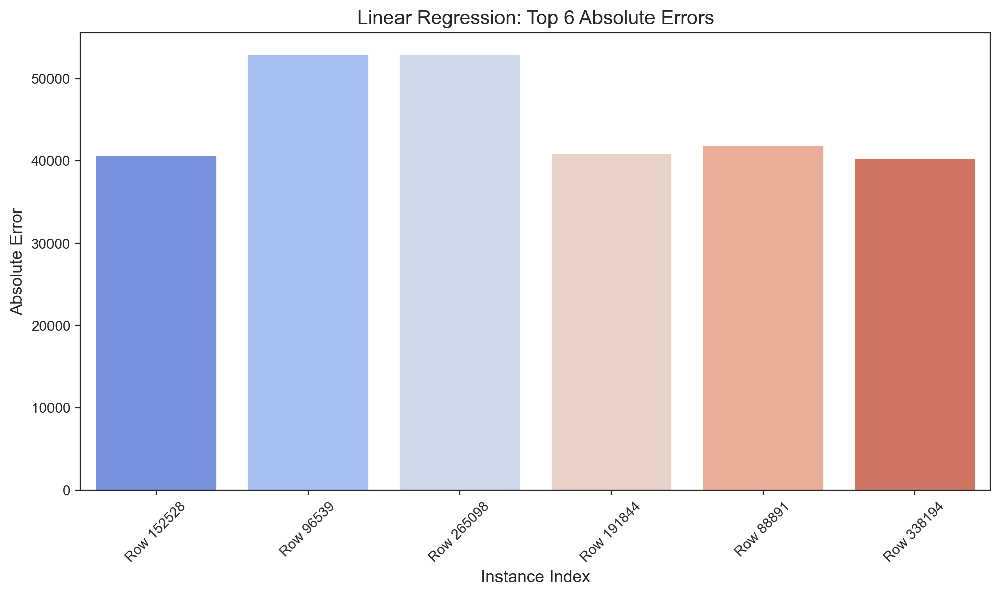

In [1047]:
# Bar Plot: Absolute Errors for Top 6 Instances in Linear Regression
plt.figure(figsize=(10, 6))
sns.barplot(
    x=top_6_lr_errors['Index'],
    y=top_6_lr_errors['Absolute Error'],
    palette='coolwarm'
)
plt.title('Linear Regression: Top 6 Absolute Errors', fontsize=14)
plt.xlabel('Instance Index', fontsize=12)
plt.ylabel('Absolute Error', fontsize=12)
plt.xticks(
    ticks=range(len(top_6_lr_errors['Index'])),
    labels=[f"Row {i}" for i in top_6_lr_errors['Index']],
    rotation=45
)
plt.tight_layout()
# plt.savefig('Figures/Top_6_Instance_Level_Errors_of_Linear_Regression.png')
plt.show()